# CLASSIFIEZ AUTOMATIQUEMENT DES BIENS DE CONSOMMATION

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [2]:
df_data = pd.read_csv(r"C:\Users\herbett\OneDrive - LEMKEN GmbH & Co.KG\Documents\Data_Science_OC\Classifier_automatiquement_biens_consommation\flipkart_com-ecommerce_sample_1050.csv")

## Étape 1 – Embeddings classiques

### A - Exploratory Data analysis

In [3]:
from skimpy import skim
skim(df_data)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ Dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 1050   │ │ string      │ 12    │                                                          │
│ │ Number of columns │ 15     │ │ float64     │ 2     │                                                          │
│ └───────────────────┴────────┘ │ bool        │ 1     │                                                          │
│                                └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━┳━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━┳━━━━━┳━━━━━┳━━━━━━┳━━━━━━━━┳━━━━━━━━┓  │
│ ┃ column             ┃ NA  ┃ NA %                  ┃ mean  ┃ sd    ┃ p0 ┃ p25 ┃ p50 ┃ p75  ┃ p100   ┃ hist   ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━╇━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━╇━━━━━╇━━━━━╇━━━━━━╇━━━━━━━━╇━━━━━━━━┩  │
│ │ retail_price       │   1 │   0.09523809523809523 │  2186 │  7639 │ 35 │ 555 │ 999 │ 1999 │ 201000 │   ▇    │  │
│ │ discounted_price   │   1 │   0.09523809523809523 │  1585 │  7475 │ 35 │ 340 │ 600 │ 1199 │ 201000 │   ▇    │  │
│ └────────────────────┴─────┴───────────────────────┴───────┴───────┴────┴─────┴─────┴──────┴────────┴────────┘  │
│                                                      bool                                                       │
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓  │
│ ┃ column                                           ┃ true         ┃ true rate              ┃ hist            ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩  │
│ │ is_FK_Advantage_product                          │           57 │                  0.054 │        ▇        │  │
│ └──────────────────────────────────────────────────┴──────────────┴────────────────────────┴─────────────────┘  │
│                                                     string                                                      │
│ ┏━━━━━━━━━━┳━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┓  │
│ ┃          ┃     ┃           ┃          ┃           ┃          ┃           ┃ chars    ┃ words per ┃ total    ┃  │
│ ┃ column   ┃ NA  ┃ NA %      ┃ shortest ┃ longest   ┃ min      ┃ max       ┃ per row  ┃ row       ┃ words    ┃  │
│ ┡━━━━━━━━━━╇━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━┩  │
│ │ uniq_id  │   0 │         0 │ 55b85ea1 │ 55b85ea15 │ 009099b1 │ fffa2117a │       32 │         1 │     1050 │  │
│ │          │     │           │ 5a1536d4 │ a1536d46b │ f6e1e8f8 │ 4006d4a84 │          │           │          │  │
│ │          │     │           │ 6b7190ad │ 7190ad6ff │ 93ec29a7 │ 8eb7d5b80 │          │           │          │  │
│ │          │     │           │ 6fff8ce7 │ f8ce7     │ 023153c4 │ d4816     │          │           │          │  │
│ │ crawl_ti │   0 │         0 │ 2016-04- │ 2016-04-3 │ 2015-12- │ 2016-06-2 │       25 │         3 │     3150 │  │
│ │ mestamp  │     │           │ 30       │ 0         │ 01       │ 6         │          │           │          │  │
│ │          │     │           │ 03:22:56 │ 03:22:56  │ 06:13:00 │ 14:21:24  │          │           │          │  │
│ │          │     │           │ +0000    │ +0000     │ 

In [4]:
df_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

On observe que les features: "retail_price" et "disconted_price" sont bien de type decimales mais les features: "product_rating" et "overall_rating" sont de type objet.

In [5]:
df_data.describe()

,retail_price,discounted_price
count,1049.000000,1049.000000
mean,2186.197331,1584.527169
std,7639.229411,7475.099680
min,35.000000,35.000000
25%,555.000000,340.000000
50%,999.000000,600.000000
75%,1999.000000,1199.000000
max,201000.000000,201000.000000


C:\Users\herbett\AppData\Local\Temp\ipykernel_27400\3724051864.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=df_data['product_category_tree'], order= df_data['product_category_tree'].value_counts().index[:10], palette='viridis')


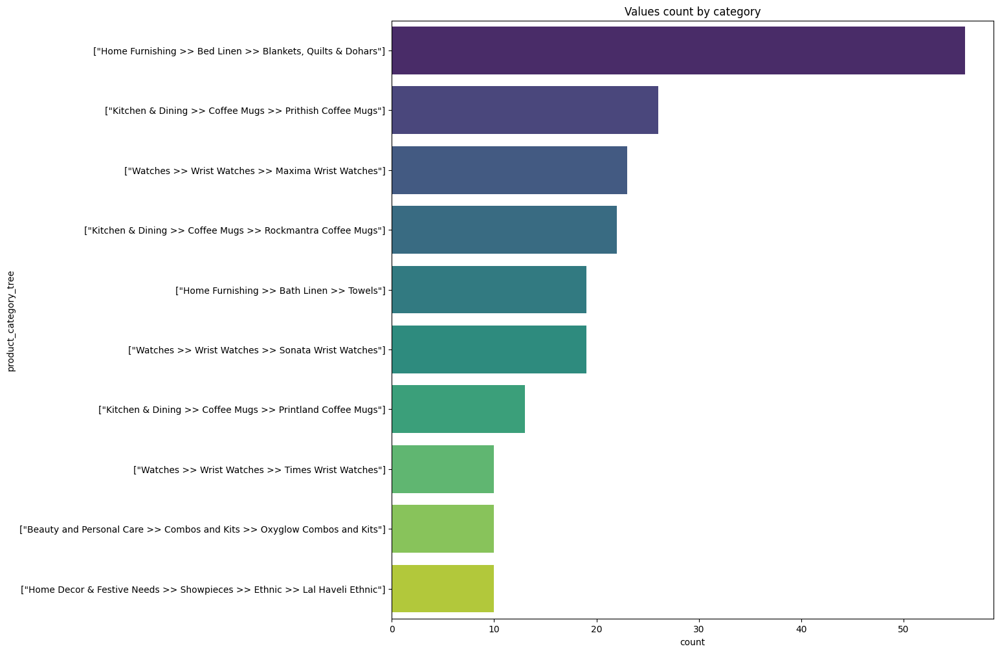

In [6]:
plt.figure(figsize=(12,12))
plt.title('Values count by category')
sns.countplot(y=df_data['product_category_tree'], order= df_data['product_category_tree'].value_counts().index[:10], palette='viridis')
plt.show()

C:\Users\herbett\AppData\Local\Temp\ipykernel_27400\4076828816.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=df_data['brand'], order= df_data['brand'].value_counts().index[:10], palette='viridis')


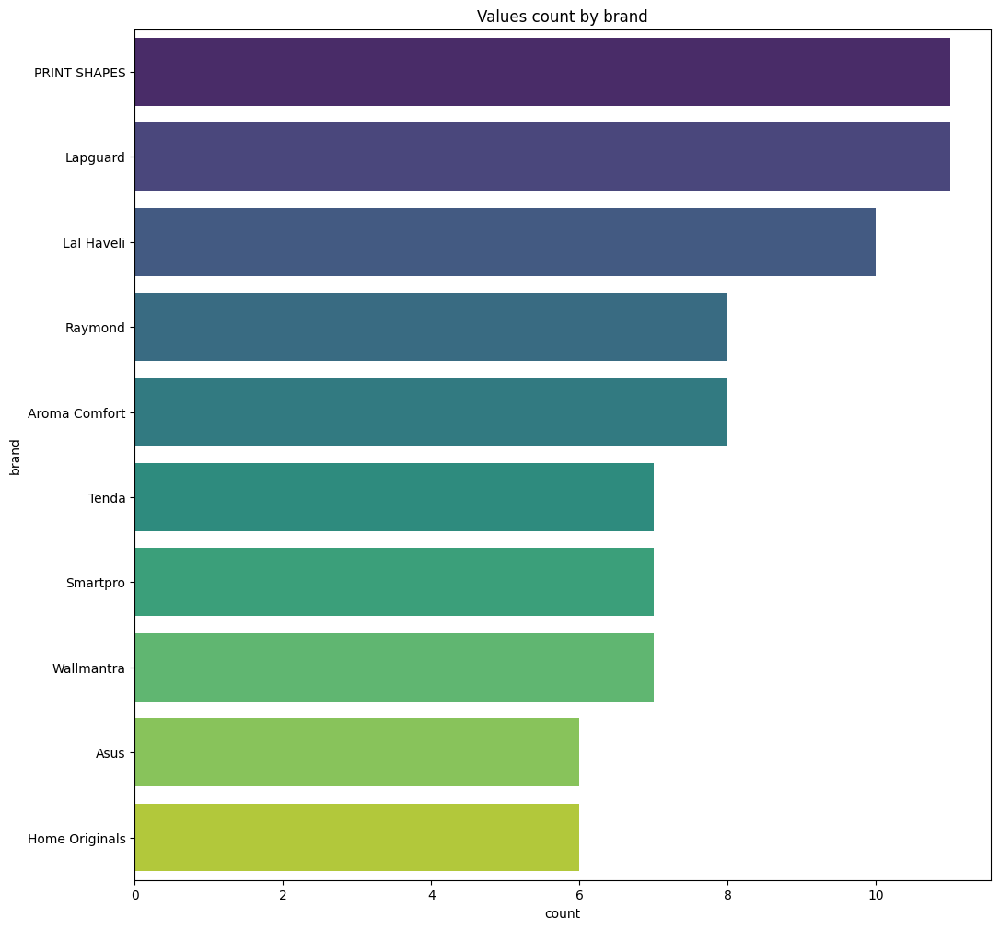

In [7]:
plt.figure(figsize=(12,12))
plt.title('Values count by brand')
sns.countplot(y=df_data['brand'], order= df_data['brand'].value_counts().index[:10], palette='viridis')
plt.show()

C:\Users\herbett\AppData\Local\Temp\ipykernel_27400\2489475554.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=df_data['product_rating'], order= df_data['product_rating'].value_counts().index[:10], palette='viridis')


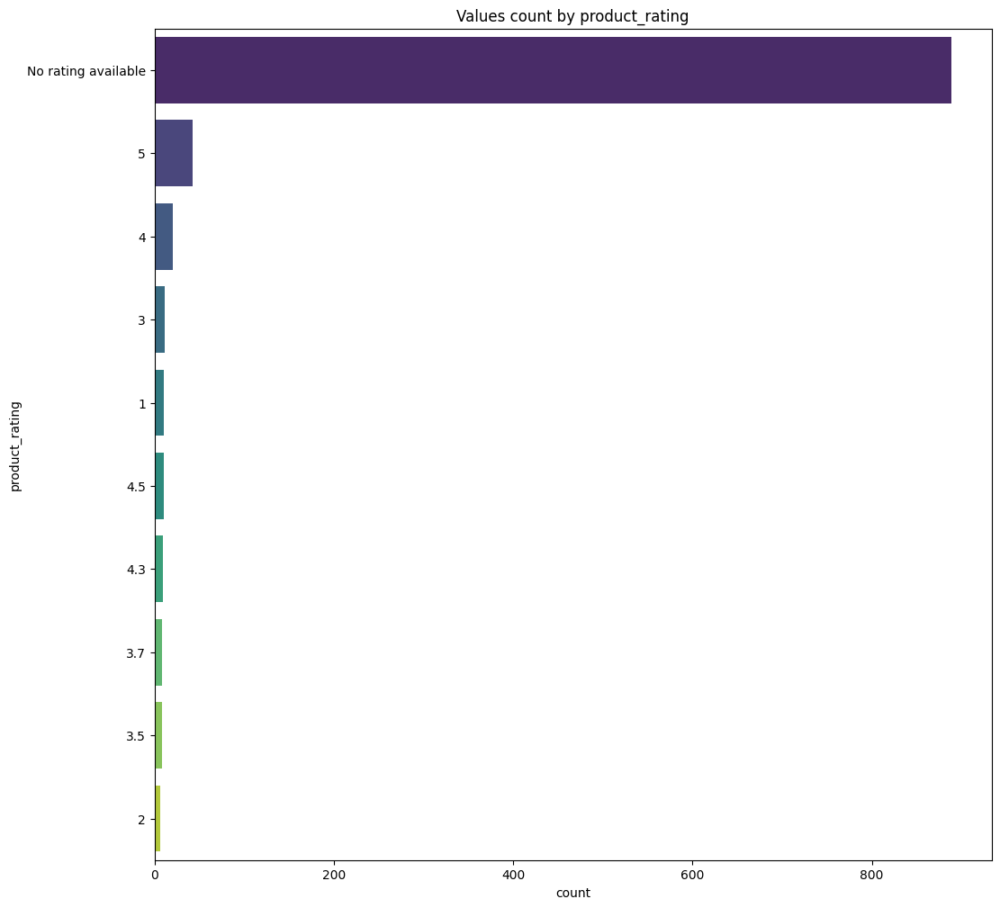

In [8]:
plt.figure(figsize=(12,12))
plt.title('Values count by product_rating')
sns.countplot(y=df_data['product_rating'], order= df_data['product_rating'].value_counts().index[:10], palette='viridis')
plt.show()

C:\Users\herbett\AppData\Local\Temp\ipykernel_27400\3645656018.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=df_data['overall_rating'], order= df_data['overall_rating'].value_counts().index[:10], palette='viridis')


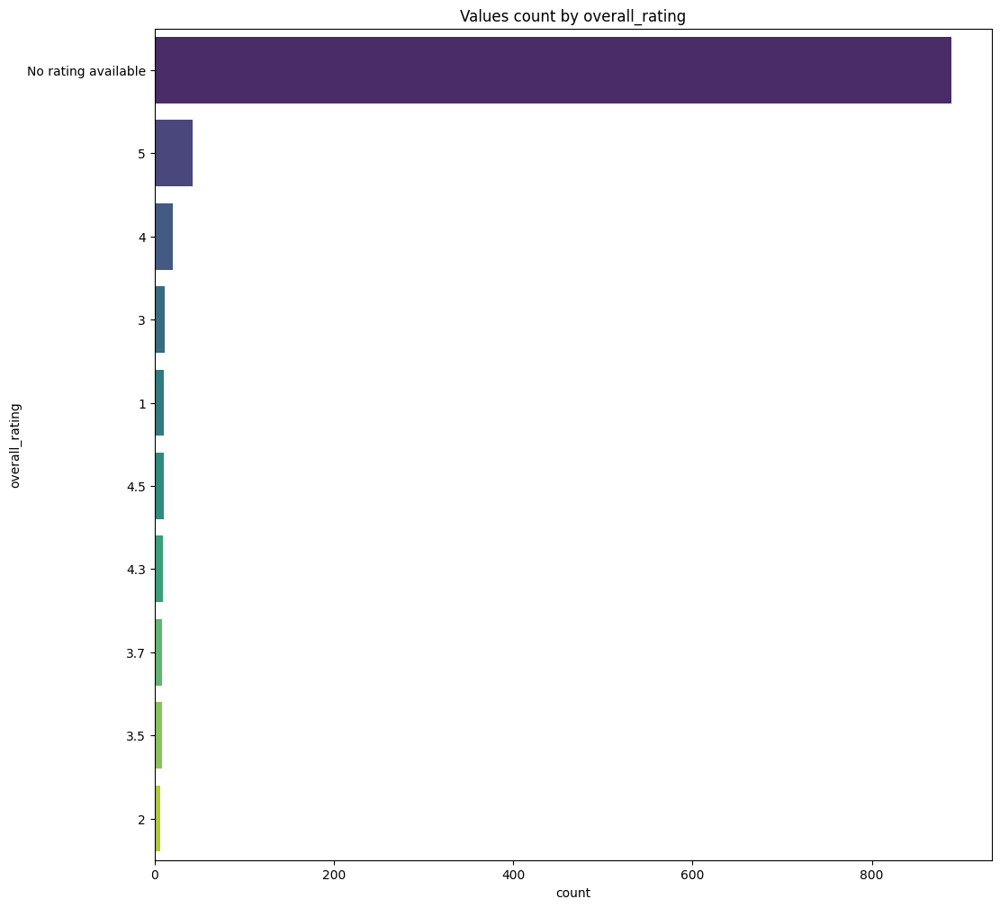

In [9]:
plt.figure(figsize=(12,12))
plt.title('Values count by overall_rating')
sns.countplot(y=df_data['overall_rating'], order= df_data['overall_rating'].value_counts().index[:10], palette='viridis')
plt.show()

<Axes: >

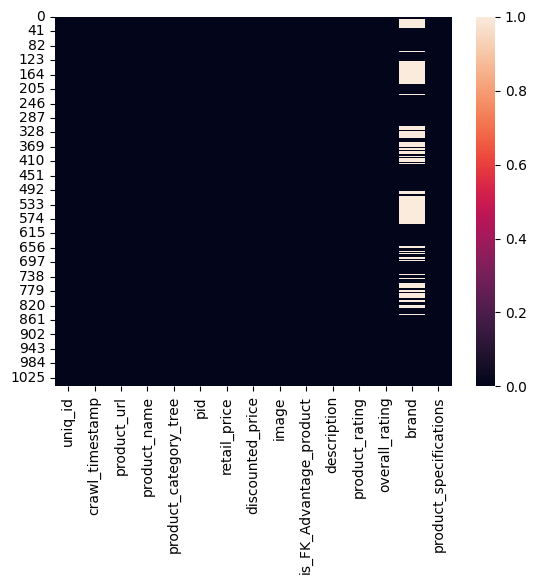

In [10]:
sns.heatmap(df_data.isna())

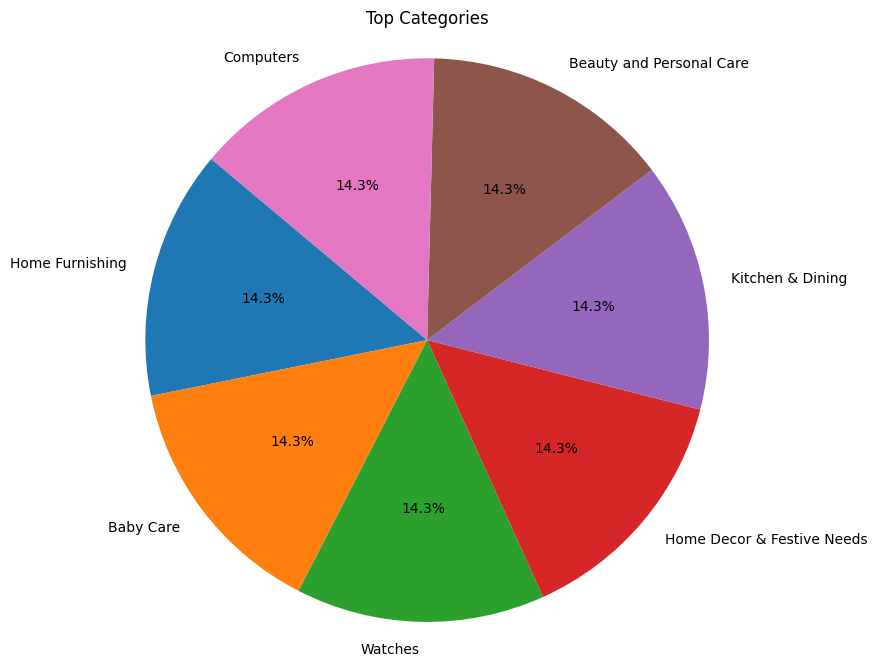

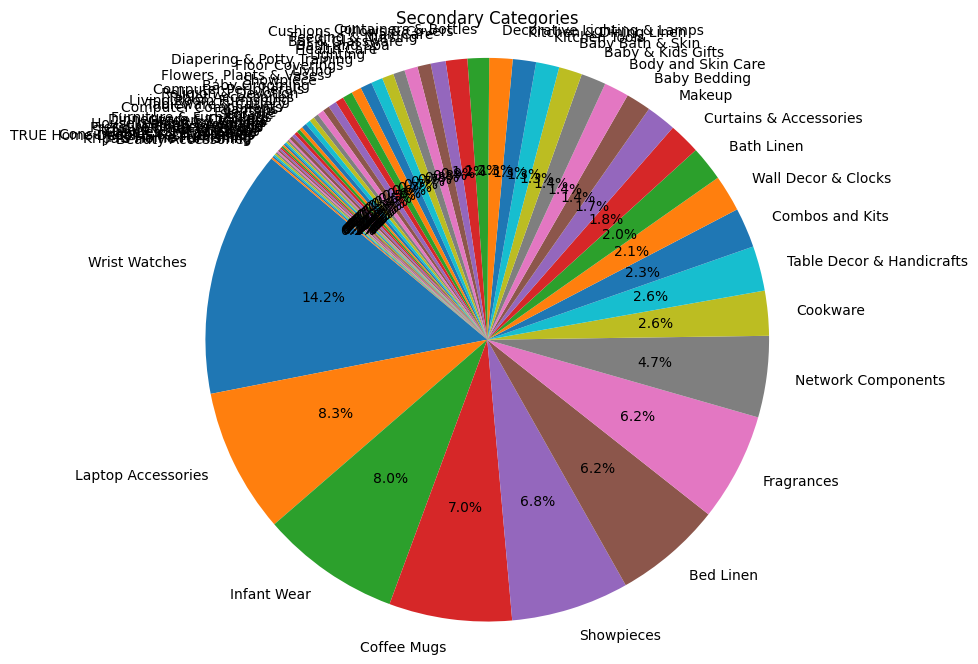

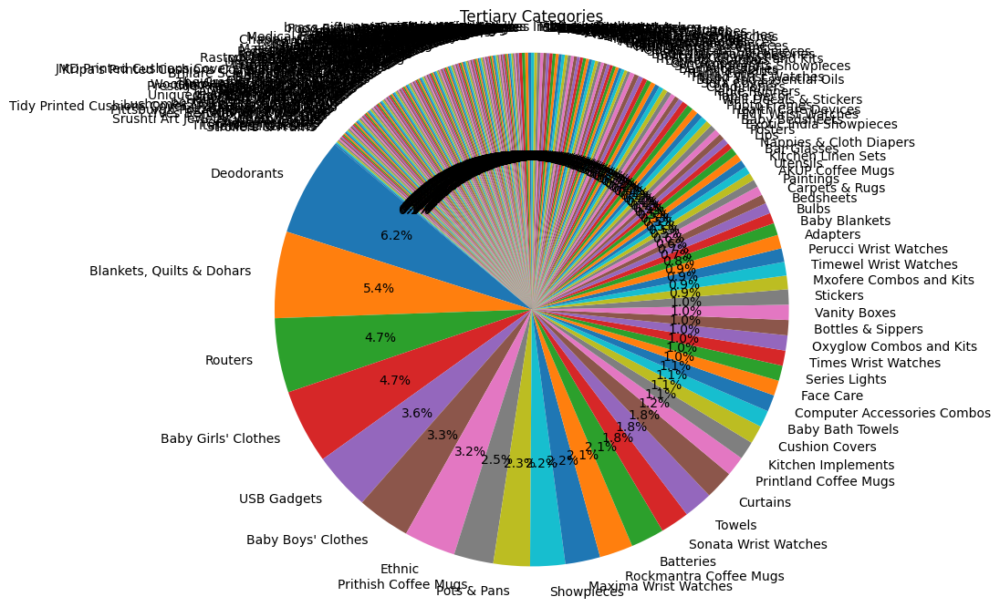

Number of unique top categories: 7
Number of unique secondary categories: 62
Number of unique tertiary categories: 241


In [11]:
def extract_categories(category_tree):
    # Divise la chaîne de l'arborescence des catégories pour obtenir les catégories
    categories = category_tree.strip('[]').split(">>")
    
    # Extraction des principales catégories 
    top_category = categories[0].strip().replace('"', '')
    
    # Extraction des catégories secondaires s'il y en a
    secondary_category = categories[1].strip().replace('"', '') if len(categories) > 1 else None
    
    # Extraction des catégories tertiaires s'il y en a
    tertiary_category = categories[2].strip().replace('"', '') if len(categories) > 2 else None
    
    return top_category, secondary_category, tertiary_category

# Applique la fonction a chaque ligne du DataFrame
df_data['top_category'], df_data['secondary_category'], df_data['tertiary_category'] = zip(*df_data['product_category_tree'].apply(extract_categories))

# Extraction des categories uniques
unique_top_categories = df_data['top_category'].unique()
unique_secondary_categories = df_data['secondary_category'].unique()
unique_tertiary_categories = df_data['tertiary_category'].unique()

# Fonction permettant de tracer un graphique circulaire pour la répartition par catégorie
def plot_category_pie_chart(categories, title):
    # Compte la fréquence de chaque catégories
    category_counts = categories.value_counts()
    
    # Initialisation du diagramme circulaire
    plt.figure(figsize=(8, 8))
    plt.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', startangle=140)
    plt.title(title)
    plt.axis('equal')  # Un rapport d'aspect 'equal' garantit que le cammebert soit dessinée sous forme de cercle
    plt.show()

# Trace un graphique circulaire pour les catégories principales
plot_category_pie_chart(df_data['top_category'], 'Top Categories')

# Trace un graphique circulaire pour les catégories secondaires
plot_category_pie_chart(df_data['secondary_category'], 'Secondary Categories')

# Trace un graphique circulaire pour les catégories tertiaires
plot_category_pie_chart(df_data['tertiary_category'], 'Tertiary Categories')

# Extraction des categories uniques
nunique_top_categories = df_data['top_category'].nunique()
nunique_secondary_categories = df_data['secondary_category'].nunique()
nunique_tertiary_categories = df_data['tertiary_category'].nunique()

print("Number of unique top categories:", nunique_top_categories)
print("Number of unique secondary categories:", nunique_secondary_categories)
print("Number of unique tertiary categories:", nunique_tertiary_categories)

### B- Text cleaning: Lemmatization

In [12]:
import nltk
import re
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

In [13]:
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')
print("Attempting to download punkt_tab...")
nltk.download('punkt_tab')
print("punkt_tab download attempt finished.")

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\herbett\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\herbett\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\herbett\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\herbett\AppData\Roaming\nltk_data...


Attempting to download punkt_tab...
punkt_tab download attempt finished.


[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\herbett\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [14]:
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

In [15]:
def clean_text(text):
    # 1. Lowercase
    text = text.lower()

    # 2. Supprimer la ponctuation et les chiffres
    text = re.sub(r'[^\w\s]', '', text)
    text = re.sub(r'\d+', '', text)

    # 3. Tokenisation
    tokens = nltk.word_tokenize(text)

    # 4. Supression des stopwords
    tokens = [t for t in tokens if t not in stop_words]

    # 5. Stemming
    stemmer = PorterStemmer()
    tokens = [stemmer.stem(t) for t in tokens]

    # 6. Lemmatisation
    tokens = [lemmatizer.lemmatize(t) for t in tokens]

    # 7. Rassemblement des jetons
    return ' '.join(tokens)

In [16]:
df_data['cleaned_description'] = df_data['description'].apply(clean_text)

In [17]:
short_words = []
for description in df_data['cleaned_description']:
    words = description.split()
    for word in words:
        if len(word) < 3:
            short_words.append(word)

# Affiche les mots de moins de 3 lettres
print(f"{len(short_words)} Mots avec moins de 3 lettres:")
print(set(short_words))

3063 Mots avec moins de 3 lettres:
{'rm', 'fb', 'va', 'im', 'id', 'mb', 'ym', 'cl', 'sf', 'hg', 'tv', 'nd', 'g', 'hd', 'de', 'ac', 'ft', 'el', 'av', 'yl', 'lc', 'su', 'fd', 'yg', 'uk', 'tk', 'h', 'cd', 'tc', 'do', 'sm', 'cc', 'xl', 'oz', 'bb', 'c', 'x', 'lp', 'q', 'ie', 'cr', 'st', 'la', 'fh', 'pc', 'f', 'kd', 'k', 'na', 'wm', 'al', 'sw', 'xp', 'e', 'p', 'qp', 'pa', 'lb', 'b', 'ea', 'mn', 'tt', 'nx', 'go', 'vj', 'tr', 'ct', 'wf', 'he', 'so', 'gb', 'dw', 'sl', 'u', 'xx', 'kg', 'gm', 'aa', 'iw', 'pp', 'w', 'hr', 'ce', 'ta', 'sd', 'yr', 'r', 'ic', 'hp', 'pk', 'md', 'ip', 'sj', 'th', 'rd', 'wd', 'ye', 'hf', 'ke', 'nt', 'pu', 'po', 'dg', 'ad', 'ez', 'kp', 'gr', 'ga', 'yk', 'lx', 'l', 'bo', 'ha', 'tm', 'te', 'lm', 'uv', 'cp', 'eu', 'rk', 'io', 'pl', 'nk', 'cb', 'qr', 'ii', 'mm', 'n', 'tb', 'ed', 'm', 'hz', 'o', 'co', 'mp', 'vw', 'kl', 'v', 'dv', 'cm', 'ml', 's', 'gc', 'uh', 'cq', 'wq', 'mh', 'pg'}


In [18]:
df_data[['description', 'cleaned_description']].head(3)

,description,cleaned_description
0,Key Features of Elegance Polyester Multicolor ...,key featur eleg polyest multicolor abstract ey...
1,Specifications of Sathiyas Cotton Bath Towel (...,specif sathiya cotton bath towel bath towel re...
2,Key Features of Eurospa Cotton Terry Face Towe...,key featur eurospa cotton terri face towel set...


In [19]:
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS

# Stopwords personnalisés
custom_stopwords = ENGLISH_STOP_WORDS.union({
    'flipkart', 'flipkartcom', 'com', 'buy', 'r', 'key', 'feature',
    'online', 'offer', 'available', 'mdf', 'yk', 'amazon',
    'original', 'authentic', 'exclusive', 'get', 'deal', 'price','wf',
    'b', 'uk', 'mh', 'w', 'va', 'yg', 'yr', 'n', 'sl', 'h', 'md', 'dv',
    'sw', 'pa', 'v', 'hz', 'o', 'pk', 'r', 'su', 'ic', 'vw', 'kp', 'uv',
    'gm', 'sd', 'dg', 'av', 'dw', 'rm', 'al', 'ip', 'tv', 'kd', 'p', 'uh',
    'tc', 'pg', 'de', 'fh', 'sm', 'cp', 'na', 'q', 'pu', 'sj', 'lp', 'pc',
    'k', 'ii', 'im', 'ml', 'cr', 'cm', 'ym', 'lx', 'bb', 'ce', 'hf', 'ac',
    'tt', 'yk', 'xx', 'rd', 'io', 'fd', 'wq', 'la', 'oz', 'hr', 'mm', 'f',
    'c', 'lb', 'ta', 'mb', 'po', 'iw', 'gc', 'yl', 'ie', 'ke', 'eu', 'sf',
    'he', 'st', 'te', 'co', 'ft', 'lm', 'nk', 'kg', 'fb', 'l', 'cb', 'g',
    'go', 'wm', 'id', 'cl', 'mp', 'tm', 'mn', 'hd', 'wd', 'th', 'x', 'xl',
    'tr', 'hg', 'gr', 'vj', 'so', 'gb', 'aa', 'e', 'hp', 'ed', 'm', 'do',
    'rk', 'tb', 'pp', 'cc', 'cq', 'nt', 'nx', 'cd', 'qp', 'ct', 'ez', 'u',
    'nd', 'xp', 's', 'pl', 'ha'
})

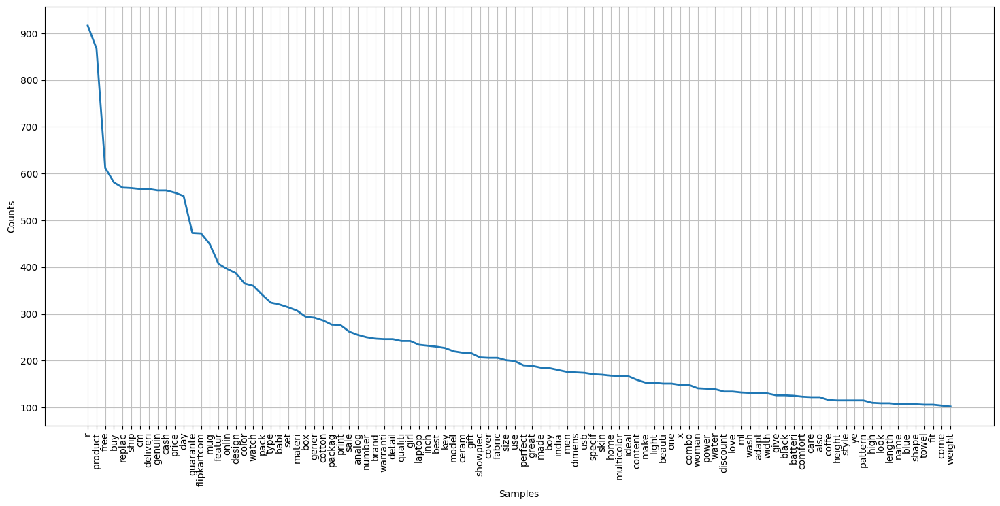

In [20]:
from nltk.tokenize import word_tokenize
# Fonction permettant de visualiser la fréquence des mots
def visualize_word_frequency(text):
    # Tokenisation du texte
    tokens = word_tokenize(text)
    # Création d'une distribution de fréquence de tokens
    freq_dist = nltk.FreqDist(tokens)
    # Visualisation de la distribution de la fréquence
    plt.figure(figsize=(18, 8))
    freq_dist.plot(100, cumulative=False)

# Visualisation de la distribution de fréquence des mots du texte nettoyé
visualize_word_frequency(df_data['cleaned_description'].str.cat(sep=' '))

#### TEST de la fonction de nettoyage de texte

In [21]:
def test_clean_text(text):
    # 1. Lowercase
    text = text.lower()

    # 2. Supprimer la ponctuation et les chiffres
    text = re.sub(r'[^\w\s]', '', text)
    text = re.sub(r'\d+', '', text)

    # 3. Tokenisation
    tokens = nltk.word_tokenize(text)

    # 4. Supression des stopwords
    tokens = [t for t in tokens if t not in stop_words]

    # 5. Stemming
    stemmer = PorterStemmer()
    tokens = [stemmer.stem(t) for t in tokens]

    # 6. Lemmatisation
    tokens = [lemmatizer.lemmatize(t) for t in tokens]

    # 7. Rassemblement des jetons
    return ' '.join(tokens)

In [22]:
test_text = "After finishing his work at the bank, John walked to the river bank to relax and watch the boats passing by."
cleaned = test_clean_text(test_text)
print(cleaned)


finish work bank john walk river bank relax watch boat pas


#### C - Bag of Words

In [23]:
# Optionnel : on limite le nombre de features pour éviter les textes trop longs
max_features = 1000

In [24]:
# Bag of Words
bow_vectorizer = CountVectorizer()
X_bow = bow_vectorizer.fit_transform(df_data['cleaned_description'])

# Vérification de la forme des données encodées
print("Shape of encoded data (Bag of Words):", X_bow.shape)

Shape of encoded data (Bag of Words): (1050, 4559)


In [25]:
print(bow_vectorizer.get_params())

{'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 1), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}


In [26]:
# Initialisation de 'CountVectorizer' avec la plage de bigrammes
count_vectorizer_Ngram = CountVectorizer(ngram_range=(2, 2))  # Utilisation de bigrams uniquement
X_bo2gram = count_vectorizer_Ngram.fit_transform(df_data['cleaned_description'])

# Vérification de la forme des données encodées
print("Shape of encoded data (Bag of Words):", X_bo2gram.shape)

Shape of encoded data (Bag of Words): (1050, 17995)


In [27]:
print(count_vectorizer_Ngram.get_params())

{'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (2, 2), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}


In [28]:
# Initialisation de 'CountVectorizer' avec la plage de trigrammes
count_vectorizer_Ngram = CountVectorizer(ngram_range=(3, 3))  # Utilisation de trigrammes uniquement
X_bo3gram = count_vectorizer_Ngram.fit_transform(df_data['cleaned_description'])

# Vérification de la forme des données encodées
print("Shape of encoded data (Bag of Words):", X_bo3gram.shape)

Shape of encoded data (Bag of Words): (1050, 23231)


In [29]:
print(count_vectorizer_Ngram.get_params())

{'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (3, 3), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}


##### A - t-SNE BoW **unigram**

In [30]:
from sklearn.manifold import TSNE

In [31]:
# Création d'un modèle t-SNE à 2 composantes (pour une visualisation en 2D)
tsne = TSNE(n_components=2, random_state=42)

# Ajustement du modèle t-SNE aux caractéristiques du texte.
text_features_reduced = tsne.fit_transform(X_bow.toarray())

In [32]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, adjusted_rand_score, davies_bouldin_score

In [33]:
n_cluster = int(nunique_top_categories)
kmeans = KMeans(n_clusters=n_cluster, random_state=42)
cluster_labels = kmeans.fit_predict(text_features_reduced)

In [34]:
unique_labels, label_counts = np.unique(cluster_labels, return_counts=True)
# Affiche le compte de chaque cluster étiqueté
for label, count in zip(unique_labels, label_counts):
    print(f'CLUSTER {label} contains {count} products')

CLUSTER 0 contains 136 products
CLUSTER 1 contains 232 products
CLUSTER 2 contains 86 products
CLUSTER 3 contains 138 products
CLUSTER 4 contains 139 products
CLUSTER 5 contains 215 products
CLUSTER 6 contains 104 products


In [35]:
df_data['tsne_unigram'] = cluster_labels

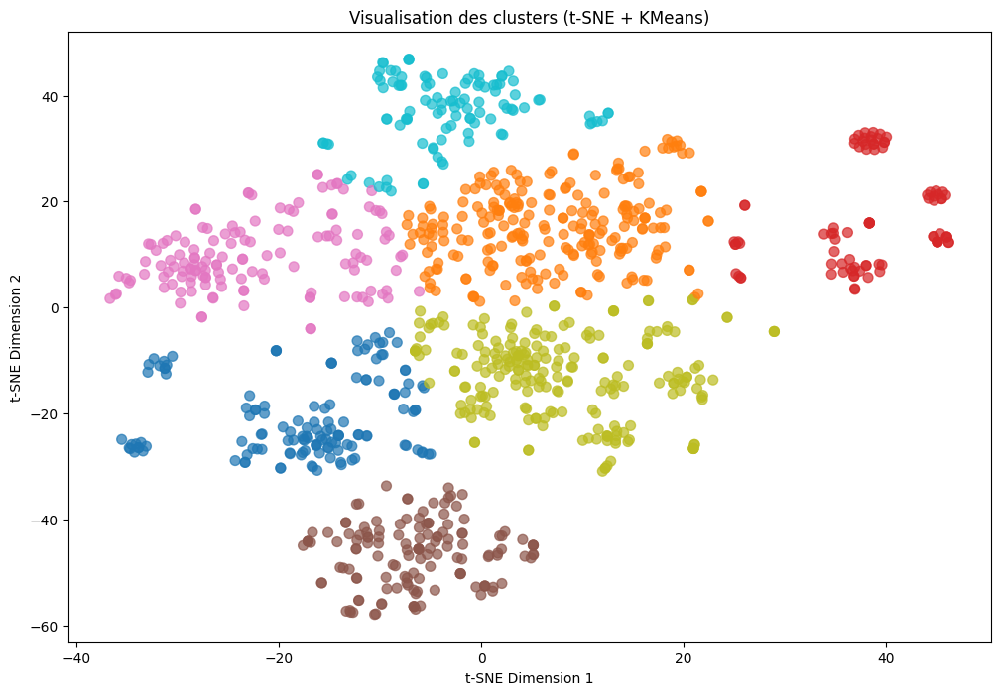

In [36]:
plt.figure(figsize=(12, 8))

# Scatter plot des points
plt.scatter(
    text_features_reduced[:, 0],
    text_features_reduced[:, 1],
    c=cluster_labels,
    cmap='tab10',
    alpha=0.7,
    s=50,
)

plt.title("Visualisation des clusters (t-SNE + KMeans)")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()


In [37]:
t_sne_silh_X_bow = silhouette_score(text_features_reduced, cluster_labels)
print(f"Silhouette Score: {t_sne_silh_X_bow}")

Silhouette Score: 0.4711293876171112


In [38]:
t_sne_dbi_X_bow = davies_bouldin_score(text_features_reduced, cluster_labels)
print(f"Davies-Bouldin Index: {t_sne_dbi_X_bow}")

Davies-Bouldin Index: 0.6888312851931707


In [39]:
t_sne_ari_X_bow = adjusted_rand_score(df_data['top_category'], df_data['tsne_unigram'])
print("Adjusted Rand Index:", t_sne_ari_X_bow)

Adjusted Rand Index: 0.3845198446927153


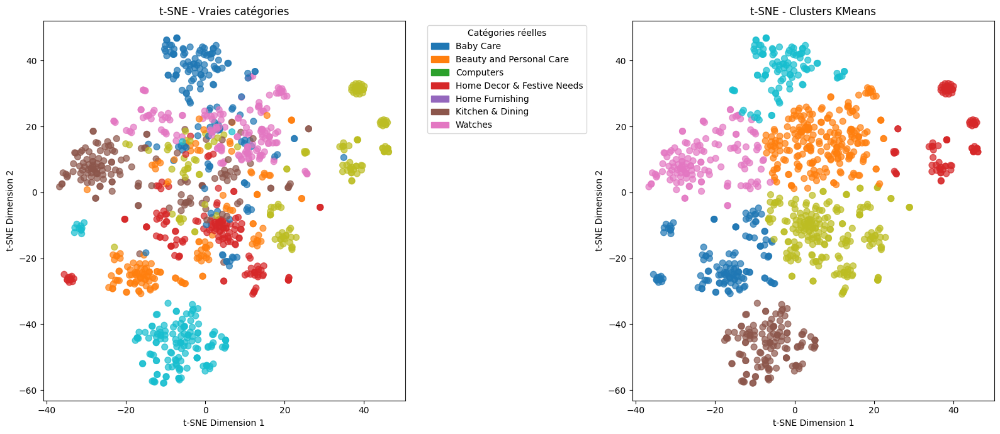

In [40]:
# Encodage des catégories réelles en entiers pour les couleurs
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
true_labels = le.fit_transform(df_data['top_category'])

# Palette de couleurs (même nombre de couleurs que de catégories)
palette = sns.color_palette("tab10", len(le.classes_))

# Création de la figure avec 2 sous-graphiques
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

scatter1 = axes[0].scatter(
    text_features_reduced[:, 0],
    text_features_reduced[:, 1],
    c=true_labels,
    cmap="tab10",
    alpha=0.7,
    s=50
)
axes[0].set_title("t-SNE - Vraies catégories")
axes[0].set_xlabel("t-SNE Dimension 1")
axes[0].set_ylabel("t-SNE Dimension 2")

# Graphe de droite : clusters KMeans
scatter2 = axes[1].scatter(
    text_features_reduced[:, 0],
    text_features_reduced[:, 1],
    c=cluster_labels,
    cmap="tab10",
    alpha=0.7,
    s=50
)
axes[1].set_title("t-SNE - Clusters KMeans")
axes[1].set_xlabel("t-SNE Dimension 1")
axes[1].set_ylabel("t-SNE Dimension 2")

# Légende
import matplotlib.patches as mpatches
patches = [
    mpatches.Patch(color=palette[i], label=le.classes_[i])
    for i in range(len(le.classes_))
]
axes[0].legend(
    handles=patches,
    title="Catégories réelles",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

fig.tight_layout()
plt.show()

In [41]:
'''import itertools

best_accuracy = 0.0
best_mapping = {}

# Test various combinations of cluster_category_mapping
for label_combination in itertools.permutations(unique_top_categories):
    mapping = {label: category for label, category in zip(unique_labels, label_combination)}
    df_data['predicted_category'] = df_data['top_category_cluster'].map(mapping)
    accuracy = np.mean(df_data['top_category'] == df_data['predicted_category'])
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_mapping = mapping

print("Best Mapping: ", best_mapping)
print("Best Accuracy:", best_accuracy)'''

'import itertools\n\nbest_accuracy = 0.0\nbest_mapping = {}\n\n# Test various combinations of cluster_category_mapping\nfor label_combination in itertools.permutations(unique_top_categories):\n    mapping = {label: category for label, category in zip(unique_labels, label_combination)}\n    df_data[\'predicted_category\'] = df_data[\'top_category_cluster\'].map(mapping)\n    accuracy = np.mean(df_data[\'top_category\'] == df_data[\'predicted_category\'])\n    if accuracy > best_accuracy:\n        best_accuracy = accuracy\n        best_mapping = mapping\n\nprint("Best Mapping: ", best_mapping)\nprint("Best Accuracy:", best_accuracy)'

##### PCA BoW unigram

In [42]:
from sklearn.decomposition import PCA

In [43]:
# Bag of Words → 2D
pca_bow = PCA(n_components=2)
X_bow_2D = pca_bow.fit_transform(X_bow.toarray())

In [44]:
kmeans = KMeans(n_clusters=n_cluster, random_state=42)
cluster_labels = kmeans.fit_predict(X_bow_2D)

In [45]:
unique_labels, label_counts = np.unique(cluster_labels, return_counts=True)
# Affiche le compte de chaque cluster étiqueté
for label, count in zip(unique_labels, label_counts):
    print(f'CLUSTER {label} contains {count} products')

CLUSTER 0 contains 577 products
CLUSTER 1 contains 43 products
CLUSTER 2 contains 28 products
CLUSTER 3 contains 149 products
CLUSTER 4 contains 213 products
CLUSTER 5 contains 31 products
CLUSTER 6 contains 9 products


In [46]:
df_data['pca_unigram'] = cluster_labels

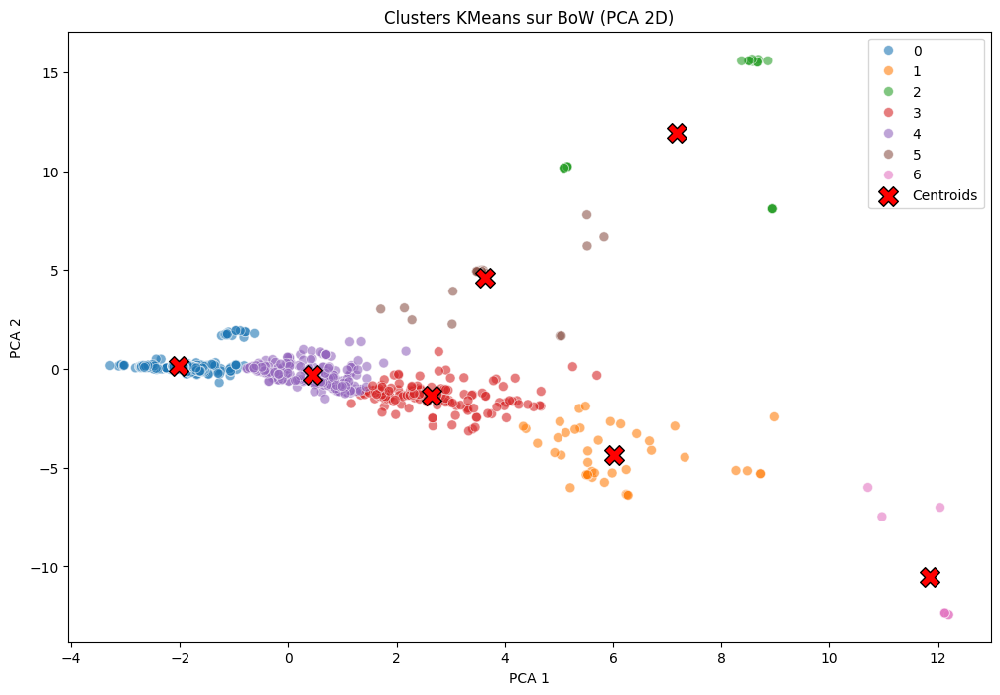

In [47]:
# Récupérer les centroïdes projetés en 2D
centers_2D = kmeans.cluster_centers_

plt.figure(figsize=(12, 8))

# Nuage de points
sns.scatterplot(
    x=X_bow_2D[:, 0],
    y=X_bow_2D[:, 1],
    hue=cluster_labels,
    palette="tab10",
    alpha=0.6,
    s=50,
    legend="full"
)

# Centroïdes en rouge
plt.scatter(
    centers_2D[:, 0],
    centers_2D[:, 1],
    c="red",
    marker="X",
    s=200,
    edgecolor="black",
    label="Centroids"
)

plt.title("Clusters KMeans sur BoW (PCA 2D)")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.legend()
plt.show()

In [48]:
pca_silh_X_bow = silhouette_score(X_bow_2D, cluster_labels)
print(f"Silhouette Score: {pca_silh_X_bow}")

Silhouette Score: 0.6368506779012558


In [49]:
pca_dbi_X_bow = davies_bouldin_score(X_bow_2D, cluster_labels)
print(f"Davies-Bouldin Index: {pca_dbi_X_bow}")

Davies-Bouldin Index: 0.5690957695117339


In [50]:
pca_ari_X_bow = adjusted_rand_score(df_data['top_category'], df_data['pca_unigram'])
print("Adjusted Rand Index:", pca_ari_X_bow)

Adjusted Rand Index: 0.04519110173187858


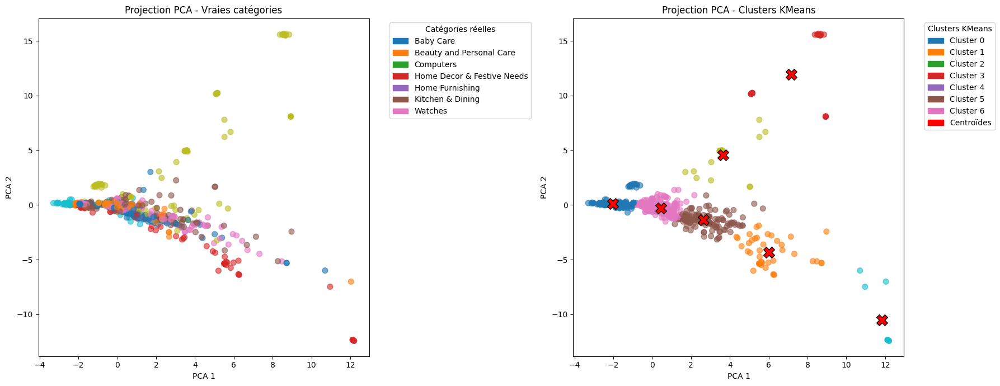

In [51]:
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Graphe de gauche : vraies catégories
scatter1 = axes[0].scatter(
    X_bow_2D[:, 0],
    X_bow_2D[:, 1],
    c=true_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

axes[0].set_title("Projection PCA - Vraies catégories")
axes[0].set_xlabel("PCA 1")
axes[0].set_ylabel("PCA 2")

# Graphe de droite : clusters KMeans + centroïdes
scatter2 = axes[1].scatter(
    X_bow_2D[:, 0],
    X_bow_2D[:, 1],
    c=cluster_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

# Ajout des centroïdes en rouge
axes[1].scatter(
    centers_2D[:, 0],
    centers_2D[:, 1],
    c="red",
    marker="X",
    s=200,
    edgecolor="black",
    label="Centroïdes"
)

axes[1].set_title("Projection PCA - Clusters KMeans")
axes[1].set_xlabel("PCA 1")
axes[1].set_ylabel("PCA 2")

# Légende pour les vraies catégories (à gauche)
legend1 = axes[0].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=cat)
        for i, cat in enumerate(le.classes_)
    ],
    title="Catégories réelles",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

# Légende pour les clusters (à droite)
legend2 = axes[1].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=f"Cluster {i}")
        for i in range(n_cluster)
    ] + [mpatches.Patch(color="red", label="Centroïdes")],
    title="Clusters KMeans",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

fig.tight_layout()
plt.show()

##### t-SNE BoW **bigram**

In [52]:
# Créer un modèle t-SNE à 2 composantes (pour une visualisation en 2D)
tsne = TSNE(n_components=2, random_state=42)

# Ajustez le modèle t-SNE aux caractéristiques du texte
text_features_reduced = tsne.fit_transform(X_bo2gram.toarray())

In [53]:
n_cluster = int(nunique_top_categories)
kmeans = KMeans(n_clusters=n_cluster, random_state=42)
cluster_labels = kmeans.fit_predict(text_features_reduced)

In [54]:
unique_labels, label_counts = np.unique(cluster_labels, return_counts=True)
# Affiche le compte par cluster étiqueté
for label, count in zip(unique_labels, label_counts):
    print(f'CLUSTER {label} contains {count} products')

CLUSTER 0 contains 127 products
CLUSTER 1 contains 200 products
CLUSTER 2 contains 102 products
CLUSTER 3 contains 127 products
CLUSTER 4 contains 252 products
CLUSTER 5 contains 106 products
CLUSTER 6 contains 136 products


In [55]:
df_data['tsne_bigram'] = cluster_labels

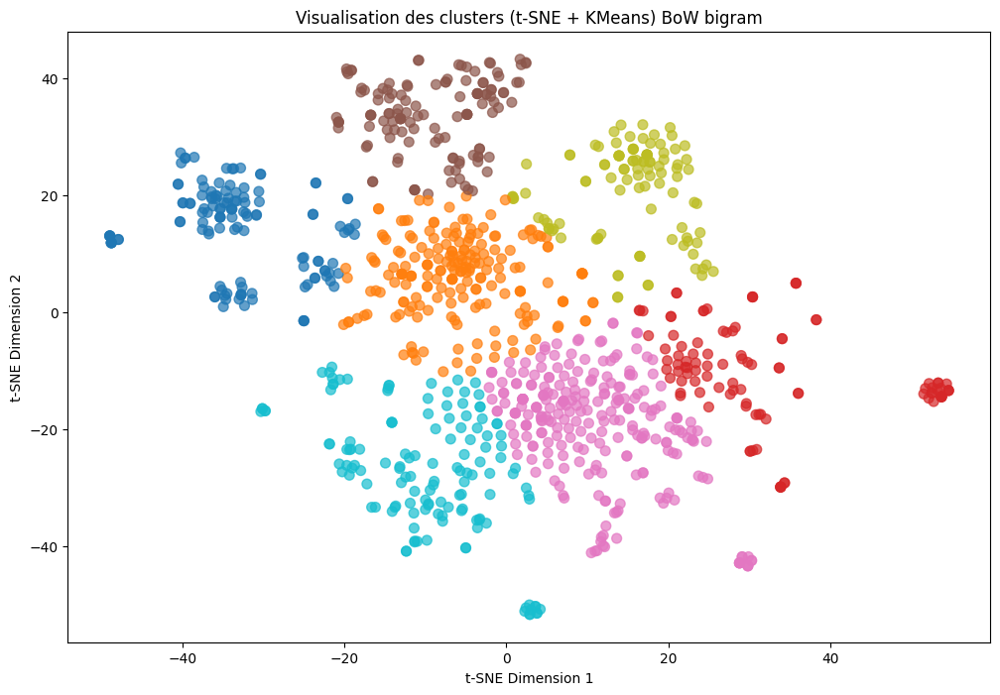

In [56]:
plt.figure(figsize=(12, 8))

# Scatter plot des points
plt.scatter(
    text_features_reduced[:, 0],
    text_features_reduced[:, 1],
    c=cluster_labels,
    cmap='tab10',
    alpha=0.7,
    s=50,
)

plt.title("Visualisation des clusters (t-SNE + KMeans) BoW bigram")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()

In [57]:
t_sne_silh_X_bow2gram = silhouette_score(text_features_reduced, cluster_labels)
print(f"Silhouette Score: {t_sne_silh_X_bow2gram}")

Silhouette Score: 0.4069176912307739


In [58]:
t_sne_dbi_X_bow2gram = davies_bouldin_score(text_features_reduced, cluster_labels)
print(f"Davies-Bouldin Index: {t_sne_dbi_X_bow2gram}")

Davies-Bouldin Index: 0.8093603394856365


In [59]:
t_sne_ari_X_bow2gram = adjusted_rand_score(df_data['top_category'], df_data['tsne_bigram'])
print("Adjusted Rand Index:", t_sne_ari_X_bow2gram)

Adjusted Rand Index: 0.3001456421209148


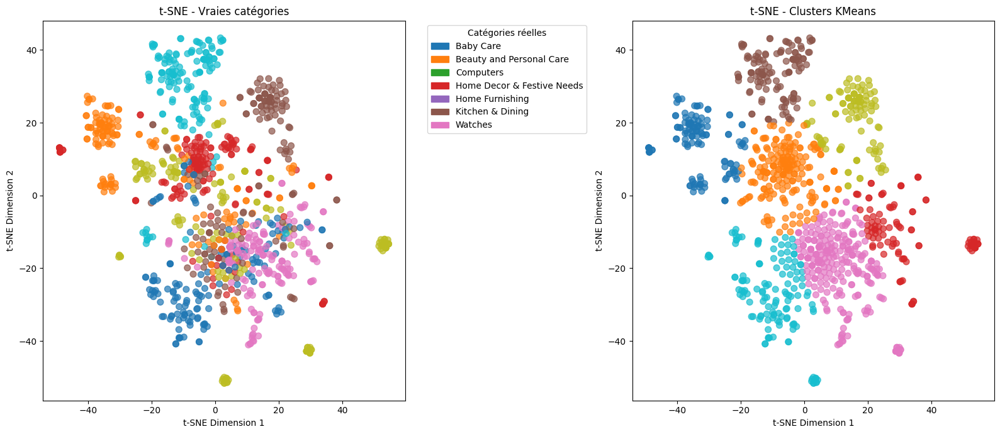

In [60]:
# Palette de couleurs (même nombre de couleurs que de catégories)
palette = sns.color_palette("tab10", len(le.classes_))

# Création de la figure avec 2 sous-graphiques
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

scatter1 = axes[0].scatter(
    text_features_reduced[:, 0],
    text_features_reduced[:, 1],
    c=true_labels,
    cmap="tab10",
    alpha=0.7,
    s=50
)
axes[0].set_title("t-SNE - Vraies catégories")
axes[0].set_xlabel("t-SNE Dimension 1")
axes[0].set_ylabel("t-SNE Dimension 2")

# Graphe de droite : clusters KMeans
scatter2 = axes[1].scatter(
    text_features_reduced[:, 0],
    text_features_reduced[:, 1],
    c=cluster_labels,
    cmap="tab10",
    alpha=0.7,
    s=50
)
axes[1].set_title("t-SNE - Clusters KMeans")
axes[1].set_xlabel("t-SNE Dimension 1")
axes[1].set_ylabel("t-SNE Dimension 2")

# Légende
import matplotlib.patches as mpatches
patches = [
    mpatches.Patch(color=palette[i], label=le.classes_[i])
    for i in range(len(le.classes_))
]
axes[0].legend(
    handles=patches,
    title="Catégories réelles",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

fig.tight_layout()
plt.show()

##### PCA BoW **bigram**

In [61]:
# Bag of Words → 2D
pca_bow = PCA(n_components=2)
X_bow_2D = pca_bow.fit_transform(X_bo2gram.toarray())

In [62]:
kmeans = KMeans(n_clusters=n_cluster, random_state=42)
cluster_labels = kmeans.fit_predict(X_bow_2D)

In [63]:
unique_labels, label_counts = np.unique(cluster_labels, return_counts=True)
# Affiche le compte pour chaque cluster étiqueté
for label, count in zip(unique_labels, label_counts):
    print(f'CLUSTER {label} contains {count} products')

CLUSTER 0 contains 469 products
CLUSTER 1 contains 160 products
CLUSTER 2 contains 11 products
CLUSTER 3 contains 21 products
CLUSTER 4 contains 96 products
CLUSTER 5 contains 17 products
CLUSTER 6 contains 276 products


In [64]:
df_data['pca_bigram'] = cluster_labels

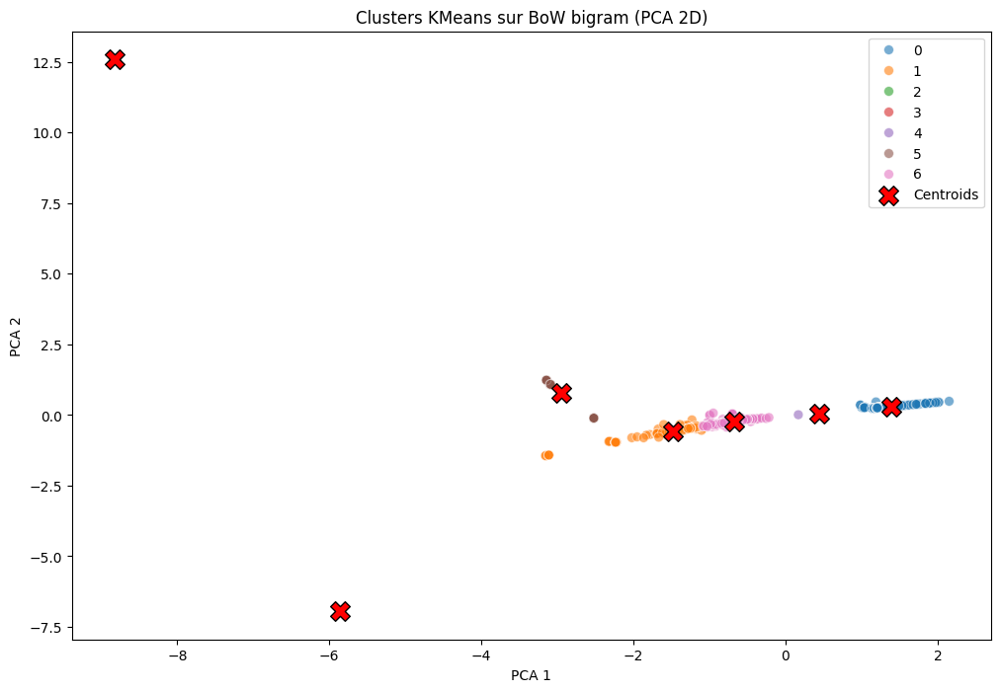

In [65]:
# Récupérer les centroïdes projetés en 2D
centers_2D = kmeans.cluster_centers_

plt.figure(figsize=(12, 8))

# Nuage de points
sns.scatterplot(
    x=X_bow_2D[:, 0],
    y=X_bow_2D[:, 1],
    hue=cluster_labels,
    palette="tab10",
    alpha=0.6,
    s=50,
    legend="full"
)

# Centroïdes en rouge
plt.scatter(
    centers_2D[:, 0],
    centers_2D[:, 1],
    c="red",
    marker="X",
    s=200,
    edgecolor="black",
    label="Centroids"
)

plt.title("Clusters KMeans sur BoW bigram (PCA 2D)")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.legend()
plt.show()

In [66]:
pca_silh_X_bow2gram = silhouette_score(X_bow_2D, cluster_labels)
print(f"Silhouette Score: {pca_silh_X_bow2gram}")

Silhouette Score: 0.6847717946449893


In [67]:
pca_dbi_X_bow2gram = davies_bouldin_score(X_bow_2D, cluster_labels)
print(f"Davies-Bouldin Index: {pca_dbi_X_bow2gram}")

Davies-Bouldin Index: 0.32978345153550415


In [68]:
pca_ari_X_bow2gram = adjusted_rand_score(df_data['top_category'], df_data['pca_bigram'])
print("Adjusted Rand Index:", pca_ari_X_bow2gram)

Adjusted Rand Index: 0.11860181508670829


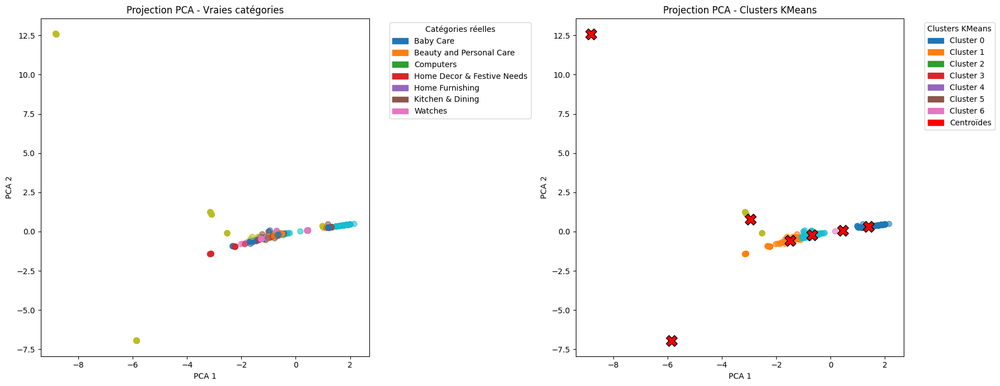

In [69]:
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Graphe de gauche : vraies catégories
scatter1 = axes[0].scatter(
    X_bow_2D[:, 0],
    X_bow_2D[:, 1],
    c=true_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

axes[0].set_title("Projection PCA - Vraies catégories")
axes[0].set_xlabel("PCA 1")
axes[0].set_ylabel("PCA 2")

# Graphe de droite : clusters KMeans + centroïdes
scatter2 = axes[1].scatter(
    X_bow_2D[:, 0],
    X_bow_2D[:, 1],
    c=cluster_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

# Ajouter les centroïdes en rouge
axes[1].scatter(
    centers_2D[:, 0],
    centers_2D[:, 1],
    c="red",
    marker="X",
    s=200,
    edgecolor="black",
    label="Centroïdes"
)

axes[1].set_title("Projection PCA - Clusters KMeans")
axes[1].set_xlabel("PCA 1")
axes[1].set_ylabel("PCA 2")

# Légende pour les vraies catégories (à gauche)
legend1 = axes[0].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=cat)
        for i, cat in enumerate(le.classes_)
    ],
    title="Catégories réelles",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

# Légende pour les clusters (à droite)
legend2 = axes[1].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=f"Cluster {i}")
        for i in range(n_cluster)
    ] + [mpatches.Patch(color="red", label="Centroïdes")],
    title="Clusters KMeans",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

fig.tight_layout()
plt.show()

##### t-SNE BoW **trigram**

In [70]:
# Création d'un modèle t-SNE à 2 composantes (pour une visualisation en 2D)
tsne = TSNE(n_components=2, random_state=42)

# Ajuste le modèle t-SNE aux caractéristiques du texte
text_features_reduced = tsne.fit_transform(X_bo3gram.toarray())

In [71]:
kmeans = KMeans(n_clusters=n_cluster, random_state=42)
cluster_labels = kmeans.fit_predict(text_features_reduced)

In [72]:
unique_labels, label_counts = np.unique(cluster_labels, return_counts=True)
# Affiche le compte pour chaque cluster étiqueté
for label, count in zip(unique_labels, label_counts):
    print(f'CLUSTER {label} contains {count} products')

CLUSTER 0 contains 232 products
CLUSTER 1 contains 247 products
CLUSTER 2 contains 85 products
CLUSTER 3 contains 187 products
CLUSTER 4 contains 98 products
CLUSTER 5 contains 56 products
CLUSTER 6 contains 145 products


In [73]:
df_data['tsne_trigram'] = cluster_labels

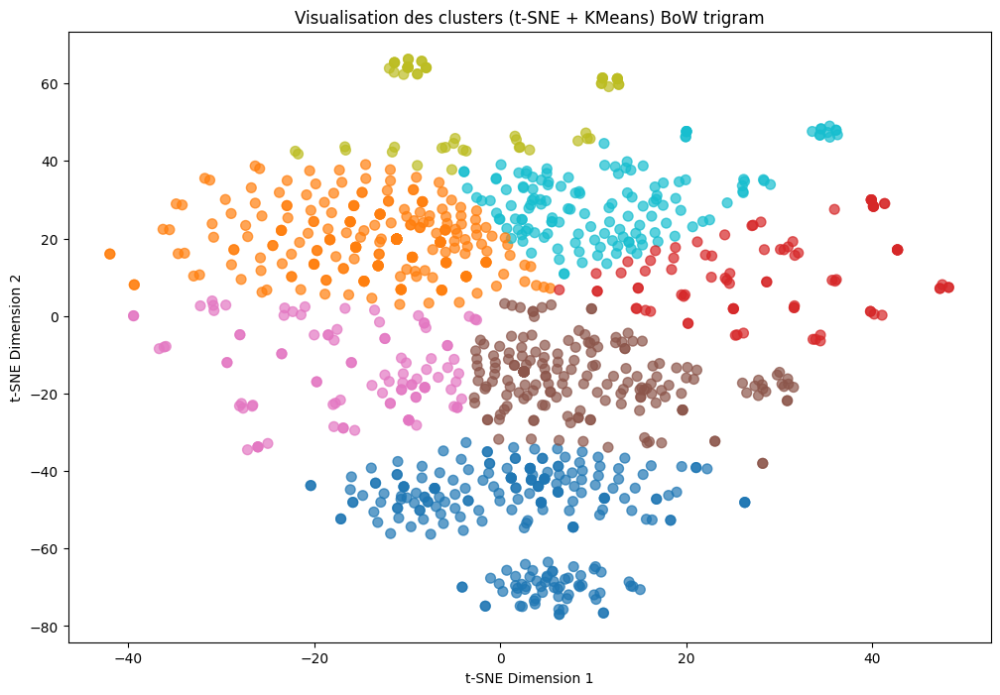

In [74]:
plt.figure(figsize=(12, 8))

# Scatter plot des points
plt.scatter(
    text_features_reduced[:, 0],
    text_features_reduced[:, 1],
    c=cluster_labels,
    cmap='tab10',
    alpha=0.7,
    s=50,
)

plt.title("Visualisation des clusters (t-SNE + KMeans) BoW trigram")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()

In [75]:
t_sne_silh_X_bow3gram = silhouette_score(text_features_reduced, cluster_labels)
print(f"Silhouette Score: {t_sne_silh_X_bow3gram}")

Silhouette Score: 0.38352635502815247


In [76]:
t_sne_dbi_X_bow3gram = davies_bouldin_score(text_features_reduced, cluster_labels)
print(f"Davies-Bouldin Index: {t_sne_dbi_X_bow3gram}")

Davies-Bouldin Index: 0.9034077855349295


In [77]:
t_sne_ari_X_bow3gram = adjusted_rand_score(df_data['top_category'], df_data['tsne_trigram'])
print("Adjusted Rand Index:", t_sne_ari_X_bow3gram)

Adjusted Rand Index: 0.16168211547109143


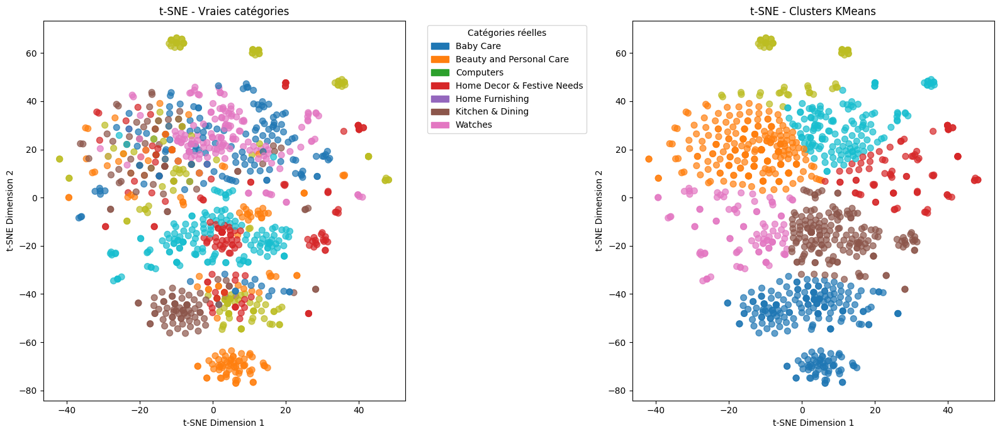

In [78]:
# Palette de couleurs (même nombre de couleurs que de catégories)
palette = sns.color_palette("tab10", len(le.classes_))

# Création de la figure avec 2 sous-graphiques
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

scatter1 = axes[0].scatter(
    text_features_reduced[:, 0],
    text_features_reduced[:, 1],
    c=true_labels,
    cmap="tab10",
    alpha=0.7,
    s=50
)
axes[0].set_title("t-SNE - Vraies catégories")
axes[0].set_xlabel("t-SNE Dimension 1")
axes[0].set_ylabel("t-SNE Dimension 2")

# Graphe de droite : clusters KMeans
scatter2 = axes[1].scatter(
    text_features_reduced[:, 0],
    text_features_reduced[:, 1],
    c=cluster_labels,
    cmap="tab10",
    alpha=0.7,
    s=50
)
axes[1].set_title("t-SNE - Clusters KMeans")
axes[1].set_xlabel("t-SNE Dimension 1")
axes[1].set_ylabel("t-SNE Dimension 2")

# Légende
import matplotlib.patches as mpatches
patches = [
    mpatches.Patch(color=palette[i], label=le.classes_[i])
    for i in range(len(le.classes_))
]
axes[0].legend(
    handles=patches,
    title="Catégories réelles",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

fig.tight_layout()
plt.show()

##### PCA BoW trigram

In [79]:
# Bag of Words → 2D
pca_bow = PCA(n_components=2)
X_bow_2D = pca_bow.fit_transform(X_bo3gram.toarray())

In [80]:
kmeans = KMeans(n_clusters=n_cluster, random_state=42)
cluster_labels = kmeans.fit_predict(X_bow_2D)

In [81]:
unique_labels, label_counts = np.unique(cluster_labels, return_counts=True)
# Affiche le compte pour chaque cluster étiqueté
for label, count in zip(unique_labels, label_counts):
    print(f'CLUSTER {label} contains {count} products')

CLUSTER 0 contains 335 products
CLUSTER 1 contains 11 products
CLUSTER 2 contains 21 products
CLUSTER 3 contains 437 products
CLUSTER 4 contains 95 products
CLUSTER 5 contains 17 products
CLUSTER 6 contains 134 products


In [82]:
df_data['pca_trigram'] = cluster_labels

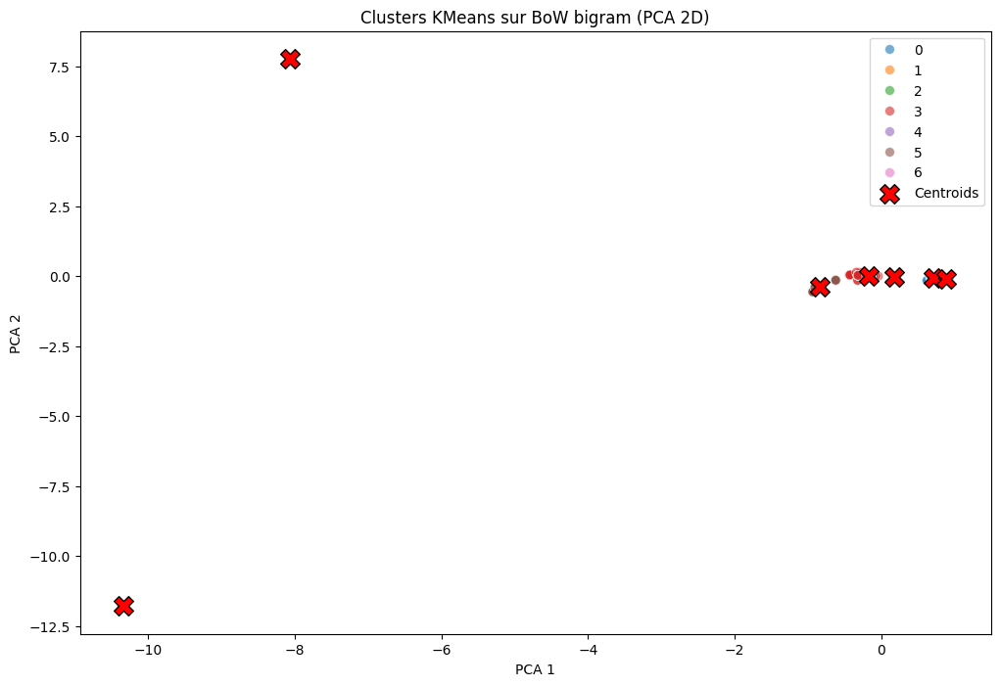

In [83]:
# Récupérer les centroïdes projetés en 2D
centers_2D = kmeans.cluster_centers_

plt.figure(figsize=(12, 8))

# Nuage de points
sns.scatterplot(
    x=X_bow_2D[:, 0],
    y=X_bow_2D[:, 1],
    hue=cluster_labels,
    palette="tab10",
    alpha=0.6,
    s=50,
    legend="full"
)

# Centroïdes en rouge
plt.scatter(
    centers_2D[:, 0],
    centers_2D[:, 1],
    c="red",
    marker="X",
    s=200,
    edgecolor="black",
    label="Centroids"
)

plt.title("Clusters KMeans sur BoW bigram (PCA 2D)")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.legend()
plt.show()

In [84]:
pca_silh_X_bow3gram = silhouette_score(X_bow_2D, cluster_labels)
print(f"Silhouette Score: {pca_silh_X_bow3gram}")

Silhouette Score: 0.8512683487504786


In [85]:
pca_dbi_X_bow3gram = davies_bouldin_score(X_bow_2D, cluster_labels)
print(f"Davies-Bouldin Index: {pca_dbi_X_bow3gram}")

Davies-Bouldin Index: 0.20314997443277624


In [86]:
pca_ari_X_bow3gram = adjusted_rand_score(df_data['top_category'], df_data['pca_trigram'])
print("Adjusted Rand Index:", pca_ari_X_bow3gram)

Adjusted Rand Index: 0.18984205750545363


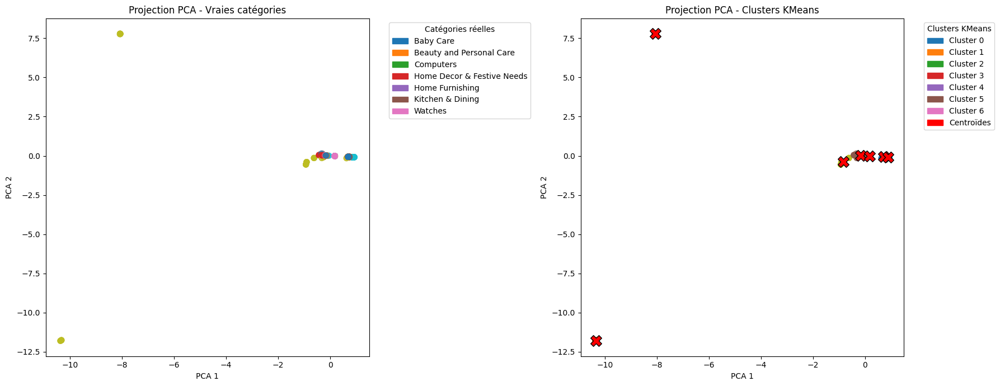

In [87]:
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Graphe de gauche : vraies catégories
scatter1 = axes[0].scatter(
    X_bow_2D[:, 0],
    X_bow_2D[:, 1],
    c=true_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

axes[0].set_title("Projection PCA - Vraies catégories")
axes[0].set_xlabel("PCA 1")
axes[0].set_ylabel("PCA 2")

# Graphe de droite : clusters KMeans + centroïdes
scatter2 = axes[1].scatter(
    X_bow_2D[:, 0],
    X_bow_2D[:, 1],
    c=cluster_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

# Ajouter les centroïdes en rouge
axes[1].scatter(
    centers_2D[:, 0],
    centers_2D[:, 1],
    c="red",
    marker="X",
    s=200,
    edgecolor="black",
    label="Centroïdes"
)

axes[1].set_title("Projection PCA - Clusters KMeans")
axes[1].set_xlabel("PCA 1")
axes[1].set_ylabel("PCA 2")

# Légende pour les vraies catégories (à gauche)
legend1 = axes[0].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=cat)
        for i, cat in enumerate(le.classes_)
    ],
    title="Catégories réelles",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

# Légende pour les clusters (à droite)
legend2 = axes[1].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=f"Cluster {i}")
        for i in range(n_cluster)
    ] + [mpatches.Patch(color="red", label="Centroïdes")],
    title="Clusters KMeans",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

fig.tight_layout()
plt.show()

##### TF-IDF t-sne **uni+bigram**

In [88]:
# TF-IDF
tfidf_vectorizer = TfidfVectorizer(
    ngram_range=(1, 2),     # unigramme + bigramme
    max_df=0.8,             # ignore les termes trop fréquents
    min_df=5,               # ignore les termes trop rares
    stop_words='english'    # filtre de base
)
X_tfidf = tfidf_vectorizer.fit_transform(df_data['cleaned_description'])

In [89]:
# Création d'un modèle t-SNE à 2 composantes (pour une visualisation en 2D)
tsne = TSNE(n_components=2, random_state=42)

# Ajuste le modèle t-SNE aux caractéristiques du texte
text_features_reduced = tsne.fit_transform(X_tfidf.toarray())

In [90]:
kmeans = KMeans(n_clusters=n_cluster, random_state=42)
cluster_labels = kmeans.fit_predict(text_features_reduced)

In [91]:
unique_labels, label_counts = np.unique(cluster_labels, return_counts=True)
# Affiche le compte pour chaque cluster étiqueté
for label, count in zip(unique_labels, label_counts):
    print(f'CLUSTER {label} contains {count} products')

CLUSTER 0 contains 199 products
CLUSTER 1 contains 117 products
CLUSTER 2 contains 79 products
CLUSTER 3 contains 113 products
CLUSTER 4 contains 149 products
CLUSTER 5 contains 219 products
CLUSTER 6 contains 174 products


In [92]:
df_data['tsne_Xtfidf2gram'] = cluster_labels

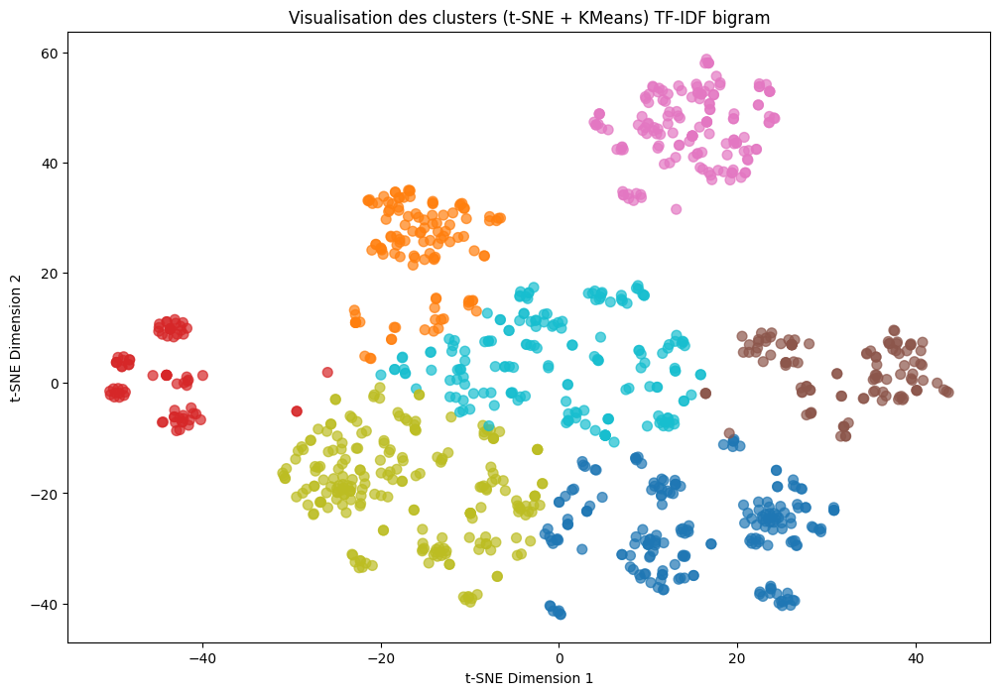

In [93]:
plt.figure(figsize=(12, 8))

# Scatter plot des points
plt.scatter(
    text_features_reduced[:, 0],
    text_features_reduced[:, 1],
    c=cluster_labels,
    cmap='tab10',
    alpha=0.7,
    s=50,
)

plt.title("Visualisation des clusters (t-SNE + KMeans) TF-IDF bigram")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()

In [94]:
t_sne_silh_X_tfidf2gram = silhouette_score(text_features_reduced, cluster_labels)
print(f"Silhouette Score: {t_sne_silh_X_tfidf2gram}")

Silhouette Score: 0.503137469291687


In [95]:
t_sne_dbi_X_tfidf2gram = davies_bouldin_score(text_features_reduced, cluster_labels)
print(f"Davies-Bouldin Index: {t_sne_dbi_X_tfidf2gram}")

Davies-Bouldin Index: 0.6497712092330847


In [96]:
t_sne_ari_X_tfidf2gram = adjusted_rand_score(df_data['top_category'], df_data['tsne_Xtfidf2gram'])
print("Adjusted Rand Index:", t_sne_ari_X_tfidf2gram)

Adjusted Rand Index: 0.4476399069170037


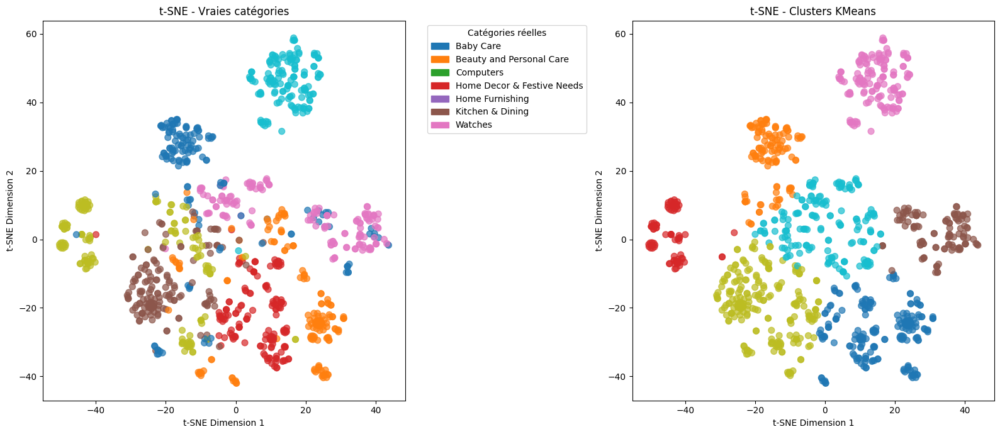

In [97]:
# Palette de couleurs (même nombre de couleurs que de catégories)
palette = sns.color_palette("tab10", len(le.classes_))

# Création de la figure avec 2 sous-graphiques
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

scatter1 = axes[0].scatter(
    text_features_reduced[:, 0],
    text_features_reduced[:, 1],
    c=true_labels,
    cmap="tab10",
    alpha=0.7,
    s=50
)
axes[0].set_title("t-SNE - Vraies catégories")
axes[0].set_xlabel("t-SNE Dimension 1")
axes[0].set_ylabel("t-SNE Dimension 2")

# Graphe de droite : clusters KMeans
scatter2 = axes[1].scatter(
    text_features_reduced[:, 0],
    text_features_reduced[:, 1],
    c=cluster_labels,
    cmap="tab10",
    alpha=0.7,
    s=50
)
axes[1].set_title("t-SNE - Clusters KMeans")
axes[1].set_xlabel("t-SNE Dimension 1")
axes[1].set_ylabel("t-SNE Dimension 2")

# Légende
import matplotlib.patches as mpatches
patches = [
    mpatches.Patch(color=palette[i], label=le.classes_[i])
    for i in range(len(le.classes_))
]
axes[0].legend(
    handles=patches,
    title="Catégories réelles",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

fig.tight_layout()
plt.show()

##### PCA TF-IDF **uni+bigram**

In [98]:
# Bag of Words → 2D
pca_bow = PCA(n_components=2)
X_bow_2D = pca_bow.fit_transform(X_tfidf.toarray())

In [99]:
kmeans = KMeans(n_clusters=n_cluster, random_state=42)
cluster_labels = kmeans.fit_predict(X_bow_2D)

In [100]:
unique_labels, label_counts = np.unique(cluster_labels, return_counts=True)
# Affiche le compte pour chaque cluster étiqueté
for label, count in zip(unique_labels, label_counts):
    print(f'CLUSTER {label} contains {count} products')

CLUSTER 0 contains 78 products
CLUSTER 1 contains 483 products
CLUSTER 2 contains 65 products
CLUSTER 3 contains 165 products
CLUSTER 4 contains 72 products
CLUSTER 5 contains 130 products
CLUSTER 6 contains 57 products


In [101]:
df_data['pca_X_tfidf2gram'] = cluster_labels

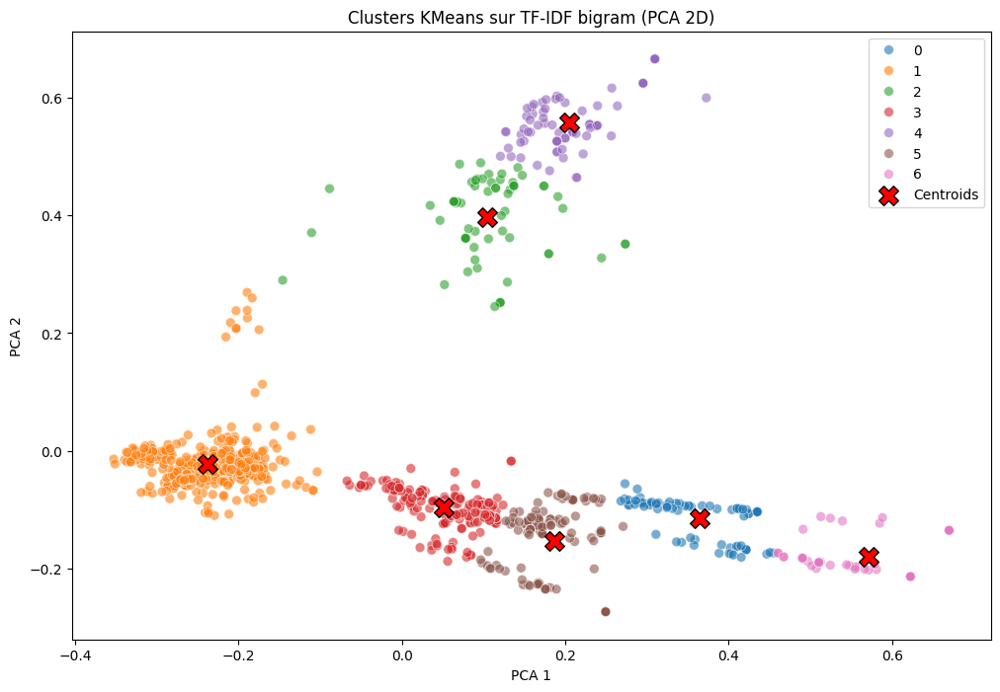

In [102]:
# Récupérer les centroïdes projetés en 2D
centers_2D = kmeans.cluster_centers_

plt.figure(figsize=(12, 8))

# Nuage de points
sns.scatterplot(
    x=X_bow_2D[:, 0],
    y=X_bow_2D[:, 1],
    hue=cluster_labels,
    palette="tab10",
    alpha=0.6,
    s=50,
    legend="full"
)

# Centroïdes en rouge
plt.scatter(
    centers_2D[:, 0],
    centers_2D[:, 1],
    c="red",
    marker="X",
    s=200,
    edgecolor="black",
    label="Centroids"
)

plt.title("Clusters KMeans sur TF-IDF bigram (PCA 2D)")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.legend()
plt.show()

In [103]:
pca_silh_X_tfidf2gram = silhouette_score(X_bow_2D, cluster_labels)
print(f"Silhouette Score: {pca_silh_X_tfidf2gram}")

Silhouette Score: 0.6028587641208583


In [104]:
pca_dbi_X_tfidf2gram = davies_bouldin_score(X_bow_2D, cluster_labels)
print(f"Davies-Bouldin Index: {pca_dbi_X_tfidf2gram}")

Davies-Bouldin Index: 0.6810296920213273


In [105]:
pca_ari_X_tfidf2gram = adjusted_rand_score(df_data['top_category'], df_data['pca_X_tfidf2gram'])
print("Adjusted Rand Index:", pca_ari_X_tfidf2gram)

Adjusted Rand Index: 0.10971939654709355


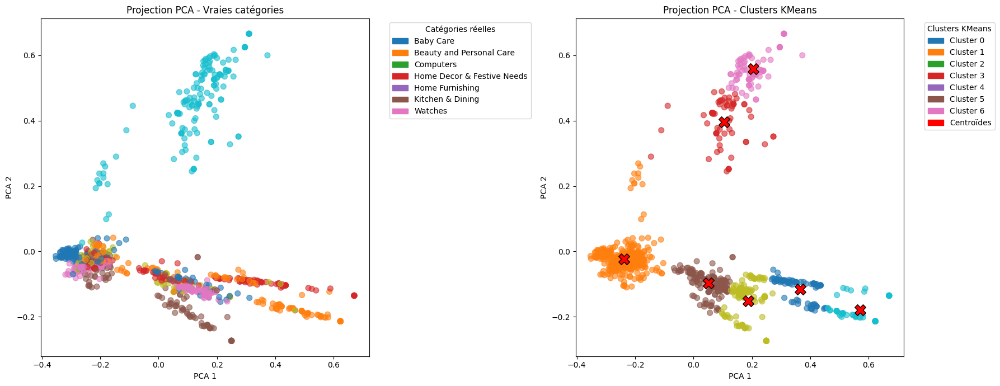

In [106]:
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Graphe de gauche : vraies catégories
scatter1 = axes[0].scatter(
    X_bow_2D[:, 0],
    X_bow_2D[:, 1],
    c=true_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

axes[0].set_title("Projection PCA - Vraies catégories")
axes[0].set_xlabel("PCA 1")
axes[0].set_ylabel("PCA 2")

# Graphe de droite : clusters KMeans + centroïdes
scatter2 = axes[1].scatter(
    X_bow_2D[:, 0],
    X_bow_2D[:, 1],
    c=cluster_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

# Ajouter les centroïdes en rouge
axes[1].scatter(
    centers_2D[:, 0],
    centers_2D[:, 1],
    c="red",
    marker="X",
    s=200,
    edgecolor="black",
    label="Centroïdes"
)

axes[1].set_title("Projection PCA - Clusters KMeans")
axes[1].set_xlabel("PCA 1")
axes[1].set_ylabel("PCA 2")

# Légende pour les vraies catégories (à gauche)
legend1 = axes[0].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=cat)
        for i, cat in enumerate(le.classes_)
    ],
    title="Catégories réelles",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

# Légende pour les clusters (à droite)
legend2 = axes[1].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=f"Cluster {i}")
        for i in range(n_cluster)
    ] + [mpatches.Patch(color="red", label="Centroïdes")],
    title="Clusters KMeans",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

fig.tight_layout()
plt.show()

##### t-SNE TF-IDF bigram only

In [107]:
# TF-IDF
tfidf_vectorizer = TfidfVectorizer(
    ngram_range=(2, 2),     # bigrammme seulement
    max_df=0.8,             # ignore les termes trop fréquents
    min_df=5,               # ignore les termes trop rares
    stop_words='english'    # filtre de base
)
X_tfidf = tfidf_vectorizer.fit_transform(df_data['cleaned_description'])

In [108]:
# Création d'un modèle t-SNE à 2 composantes (pour une visualisation en 2D)
tsne = TSNE(n_components=2, random_state=42)

# Ajuste le modèle t-SNE aux caractéristiques du texte
text_features_reduced = tsne.fit_transform(X_tfidf.toarray())

In [109]:
kmeans = KMeans(n_clusters=n_cluster, random_state=42)
cluster_labels = kmeans.fit_predict(text_features_reduced)

In [110]:
unique_labels, label_counts = np.unique(cluster_labels, return_counts=True)
# Affiche le compte pour chaque cluster étiqueté
for label, count in zip(unique_labels, label_counts):
    print(f'CLUSTER {label} contains {count} products')

CLUSTER 0 contains 148 products
CLUSTER 1 contains 150 products
CLUSTER 2 contains 138 products
CLUSTER 3 contains 208 products
CLUSTER 4 contains 164 products
CLUSTER 5 contains 139 products
CLUSTER 6 contains 103 products


In [111]:
df_data['tsne_Xtfidf2gramonly'] = cluster_labels

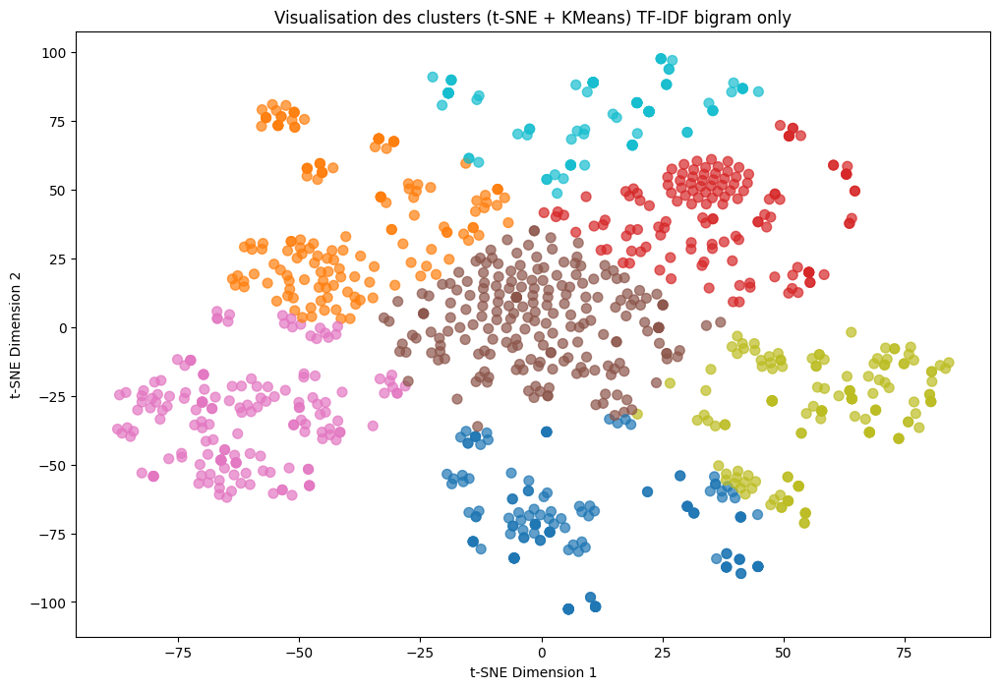

In [112]:
plt.figure(figsize=(12, 8))

# Scatter plot des points
plt.scatter(
    text_features_reduced[:, 0],
    text_features_reduced[:, 1],
    c=cluster_labels,
    cmap='tab10',
    alpha=0.7,
    s=50,
)

plt.title("Visualisation des clusters (t-SNE + KMeans) TF-IDF bigram only")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()

In [113]:
t_sne_silh_X_tfidf2gramonly = silhouette_score(text_features_reduced, cluster_labels)
print(f"Silhouette Score: {t_sne_silh_X_tfidf2gramonly}")

Silhouette Score: 0.4260835647583008


In [114]:
t_sne_dbi_X_tfidf2gramonly = davies_bouldin_score(text_features_reduced, cluster_labels)
print(f"Davies-Bouldin Index: {t_sne_dbi_X_tfidf2gramonly}")

Davies-Bouldin Index: 0.7743233172652932


In [115]:
t_sne_ari_X_tfidf2gramonly = adjusted_rand_score(df_data['top_category'], df_data['tsne_Xtfidf2gramonly'])
print("Adjusted Rand Index:", t_sne_ari_X_tfidf2gramonly)

Adjusted Rand Index: 0.33999905320576135


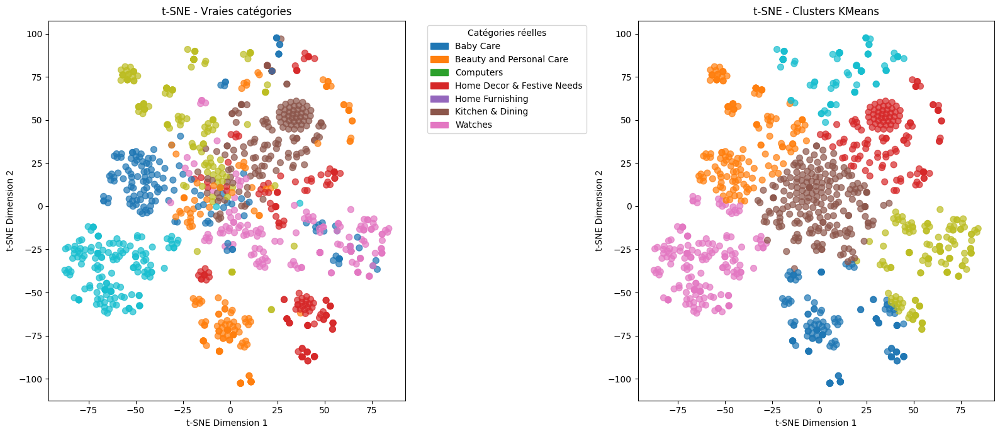

In [116]:
# Palette de couleurs (même nombre de couleurs que de catégories)
palette = sns.color_palette("tab10", len(le.classes_))

# Création de la figure avec 2 sous-graphiques
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

scatter1 = axes[0].scatter(
    text_features_reduced[:, 0],
    text_features_reduced[:, 1],
    c=true_labels,
    cmap="tab10",
    alpha=0.7,
    s=50
)
axes[0].set_title("t-SNE - Vraies catégories")
axes[0].set_xlabel("t-SNE Dimension 1")
axes[0].set_ylabel("t-SNE Dimension 2")

# Graphe de droite : clusters KMeans
scatter2 = axes[1].scatter(
    text_features_reduced[:, 0],
    text_features_reduced[:, 1],
    c=cluster_labels,
    cmap="tab10",
    alpha=0.7,
    s=50
)
axes[1].set_title("t-SNE - Clusters KMeans")
axes[1].set_xlabel("t-SNE Dimension 1")
axes[1].set_ylabel("t-SNE Dimension 2")

# Légende
import matplotlib.patches as mpatches
patches = [
    mpatches.Patch(color=palette[i], label=le.classes_[i])
    for i in range(len(le.classes_))
]
axes[0].legend(
    handles=patches,
    title="Catégories réelles",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

fig.tight_layout()
plt.show()

##### PCA TF-IDF bigram only

In [117]:
# Bag of Words → 2D
pca_bow = PCA(n_components=2)
X_bow_2D = pca_bow.fit_transform(X_tfidf.toarray())

In [118]:
kmeans = KMeans(n_clusters=n_cluster, random_state=42)
cluster_labels = kmeans.fit_predict(X_bow_2D)

In [119]:
unique_labels, label_counts = np.unique(cluster_labels, return_counts=True)
# Affiche le compte pour chaque cluster étiqueté
for label, count in zip(unique_labels, label_counts):
    print(f'CLUSTER {label} contains {count} products')

CLUSTER 0 contains 71 products
CLUSTER 1 contains 472 products
CLUSTER 2 contains 48 products
CLUSTER 3 contains 234 products
CLUSTER 4 contains 94 products
CLUSTER 5 contains 55 products
CLUSTER 6 contains 76 products


In [120]:
df_data['pca_X_tfidf2gramonly'] = cluster_labels

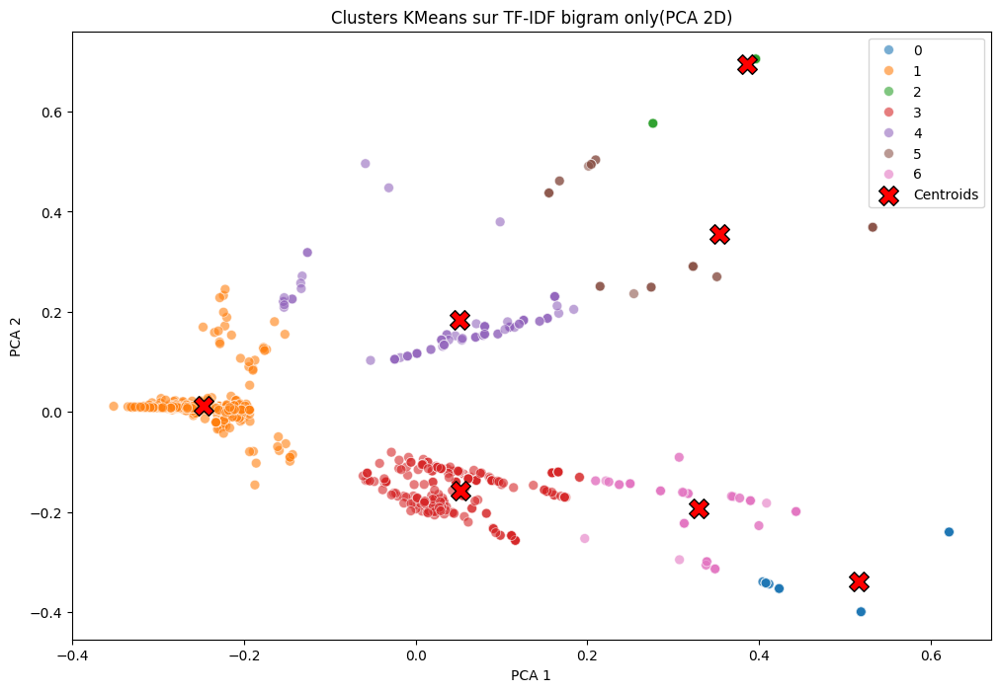

In [121]:
# Récupérer les centroïdes projetés en 2D
centers_2D = kmeans.cluster_centers_

plt.figure(figsize=(12, 8))

# Nuage de points
sns.scatterplot(
    x=X_bow_2D[:, 0],
    y=X_bow_2D[:, 1],
    hue=cluster_labels,
    palette="tab10",
    alpha=0.6,
    s=50,
    legend="full"
)

# Centroïdes en rouge
plt.scatter(
    centers_2D[:, 0],
    centers_2D[:, 1],
    c="red",
    marker="X",
    s=200,
    edgecolor="black",
    label="Centroids"
)

plt.title("Clusters KMeans sur TF-IDF bigram only(PCA 2D)")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.legend()
plt.show()

In [122]:
pca_silh_X_tfidf2gramonly = silhouette_score(X_bow_2D, cluster_labels)
print(f"Silhouette Score: {pca_silh_X_tfidf2gramonly}")

Silhouette Score: 0.688721114017163


In [123]:
pca_dbi_X_tfidf2gramonly = davies_bouldin_score(X_bow_2D, cluster_labels)
print(f"Davies-Bouldin Index: {pca_dbi_X_tfidf2gramonly}")

Davies-Bouldin Index: 0.6227640725083565


In [124]:
pca_ari_X_tfidf2gramonly = adjusted_rand_score(df_data['top_category'], df_data['pca_X_tfidf2gramonly'])
print("Adjusted Rand Index:", pca_ari_X_tfidf2gramonly)

Adjusted Rand Index: 0.149516061754978


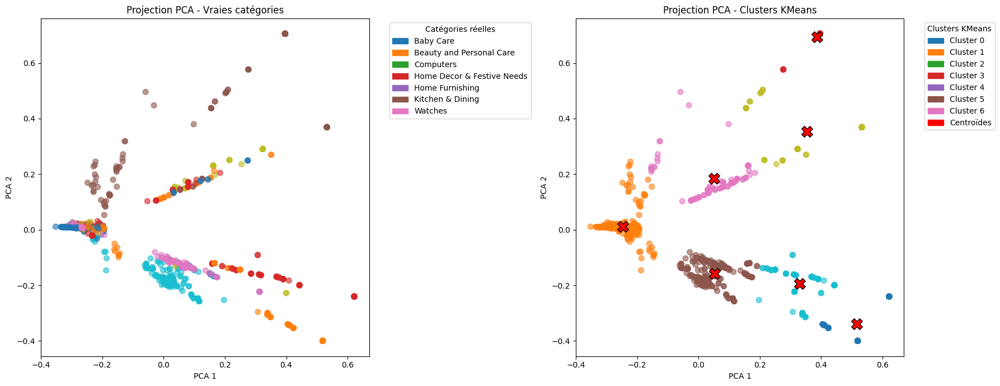

In [125]:
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Graphe de gauche : vraies catégories
scatter1 = axes[0].scatter(
    X_bow_2D[:, 0],
    X_bow_2D[:, 1],
    c=true_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

axes[0].set_title("Projection PCA - Vraies catégories")
axes[0].set_xlabel("PCA 1")
axes[0].set_ylabel("PCA 2")

# Graphe de droite : clusters KMeans + centroïdes
scatter2 = axes[1].scatter(
    X_bow_2D[:, 0],
    X_bow_2D[:, 1],
    c=cluster_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

# Ajouter les centroïdes en rouge
axes[1].scatter(
    centers_2D[:, 0],
    centers_2D[:, 1],
    c="red",
    marker="X",
    s=200,
    edgecolor="black",
    label="Centroïdes"
)

axes[1].set_title("Projection PCA - Clusters KMeans")
axes[1].set_xlabel("PCA 1")
axes[1].set_ylabel("PCA 2")

# Légende pour les vraies catégories (à gauche)
legend1 = axes[0].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=cat)
        for i, cat in enumerate(le.classes_)
    ],
    title="Catégories réelles",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

# Légende pour les clusters (à droite)
legend2 = axes[1].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=f"Cluster {i}")
        for i in range(n_cluster)
    ] + [mpatches.Patch(color="red", label="Centroïdes")],
    title="Clusters KMeans",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

fig.tight_layout()
plt.show()

##### t-SNE TF-IDF uni-trigram

In [126]:
# TF-IDF
tfidf_vectorizer = TfidfVectorizer(
    ngram_range=(1, 3),     # bigrams only
    max_df=0.8,             # ignorer les termes trop fréquents
    min_df=5,               # ignorer les termes trop rares
    stop_words='english'    # filtre de base
)
X_tfidf = tfidf_vectorizer.fit_transform(df_data['cleaned_description'])

In [127]:
# Création d'un modèle t-SNE à 2 composantes (pour une visualisation en 2D)
tsne = TSNE(n_components=2, random_state=42)

# Ajuste le modèle t-SNE aux caractéristiques du texte
text_features_reduced = tsne.fit_transform(X_tfidf.toarray())

In [128]:
kmeans = KMeans(n_clusters=n_cluster, random_state=42)
cluster_labels = kmeans.fit_predict(text_features_reduced)

In [129]:
unique_labels, label_counts = np.unique(cluster_labels, return_counts=True)
# Affiche le compte pour chaque cluster étiqueté
for label, count in zip(unique_labels, label_counts):
    print(f'CLUSTER {label} contains {count} products')

CLUSTER 0 contains 171 products
CLUSTER 1 contains 116 products
CLUSTER 2 contains 76 products
CLUSTER 3 contains 220 products
CLUSTER 4 contains 150 products
CLUSTER 5 contains 189 products
CLUSTER 6 contains 128 products


In [130]:
df_data['tsne_Xtfidf3gram'] = cluster_labels

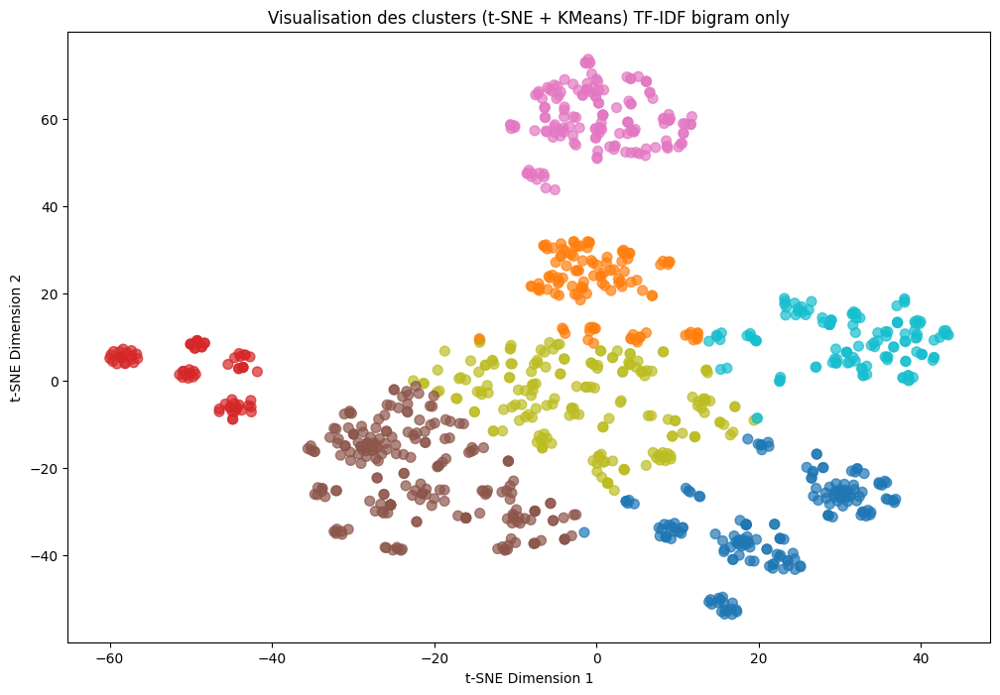

In [131]:
plt.figure(figsize=(12, 8))

# Scatter plot des points
plt.scatter(
    text_features_reduced[:, 0],
    text_features_reduced[:, 1],
    c=cluster_labels,
    cmap='tab10',
    alpha=0.7,
    s=50,
)

plt.title("Visualisation des clusters (t-SNE + KMeans) TF-IDF bigram only")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()

In [132]:
t_sne_silh_X_tfidf3gram = silhouette_score(text_features_reduced, cluster_labels)
print(f"Silhouette Score: {t_sne_silh_X_tfidf3gram}")

Silhouette Score: 0.5119621753692627


In [133]:
t_sne_dbi_X_tfidf3gram = davies_bouldin_score(text_features_reduced, cluster_labels)
print(f"Davies-Bouldin Index: {t_sne_dbi_X_tfidf3gram}")

Davies-Bouldin Index: 0.6901216174012349


In [134]:
t_sne_ari_X_tfidf3gram = adjusted_rand_score(df_data['top_category'], df_data['tsne_Xtfidf3gram'])
print("Adjusted Rand Index:", t_sne_ari_X_tfidf3gram)

Adjusted Rand Index: 0.42599873461644144


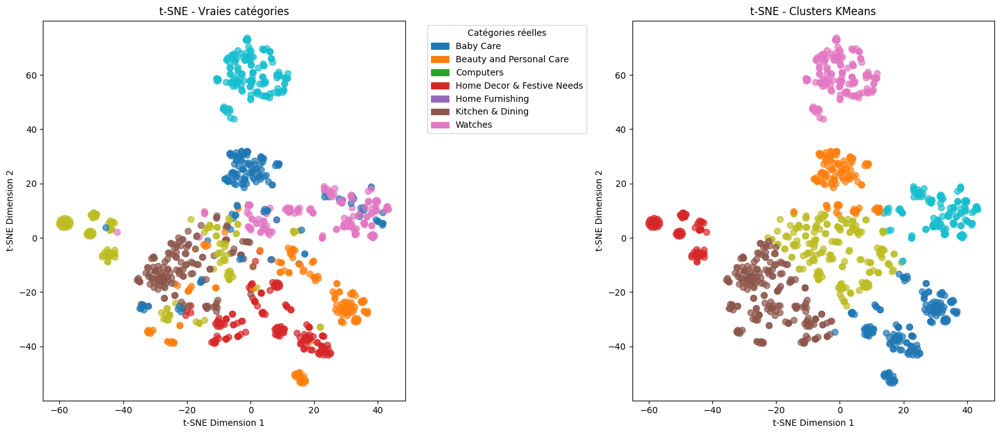

In [135]:
# Palette de couleurs (même nombre de couleurs que de catégories)
palette = sns.color_palette("tab10", len(le.classes_))

# Création de la figure avec 2 sous-graphiques
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

scatter1 = axes[0].scatter(
    text_features_reduced[:, 0],
    text_features_reduced[:, 1],
    c=true_labels,
    cmap="tab10",
    alpha=0.7,
    s=50
)
axes[0].set_title("t-SNE - Vraies catégories")
axes[0].set_xlabel("t-SNE Dimension 1")
axes[0].set_ylabel("t-SNE Dimension 2")

# Graphe de droite : clusters KMeans
scatter2 = axes[1].scatter(
    text_features_reduced[:, 0],
    text_features_reduced[:, 1],
    c=cluster_labels,
    cmap="tab10",
    alpha=0.7,
    s=50
)
axes[1].set_title("t-SNE - Clusters KMeans")
axes[1].set_xlabel("t-SNE Dimension 1")
axes[1].set_ylabel("t-SNE Dimension 2")

# Légende
import matplotlib.patches as mpatches
patches = [
    mpatches.Patch(color=palette[i], label=le.classes_[i])
    for i in range(len(le.classes_))
]
axes[0].legend(
    handles=patches,
    title="Catégories réelles",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

fig.tight_layout()
plt.show()

##### PCA TF-IDF **trigram**

In [136]:
# Bag of Words → 2D
pca_bow = PCA(n_components=2)
X_bow_2D = pca_bow.fit_transform(X_tfidf.toarray())

In [137]:
kmeans = KMeans(n_clusters=n_cluster, random_state=42)
cluster_labels = kmeans.fit_predict(X_bow_2D)

In [138]:
unique_labels, label_counts = np.unique(cluster_labels, return_counts=True)
# Affiche le compte pour chaque cluster étiqueté
for label, count in zip(unique_labels, label_counts):
    print(f'CLUSTER {label} contains {count} products')

CLUSTER 0 contains 118 products
CLUSTER 1 contains 233 products
CLUSTER 2 contains 136 products
CLUSTER 3 contains 128 products
CLUSTER 4 contains 106 products
CLUSTER 5 contains 78 products
CLUSTER 6 contains 251 products


In [139]:
df_data['pca_X_tfidf3gram'] = cluster_labels

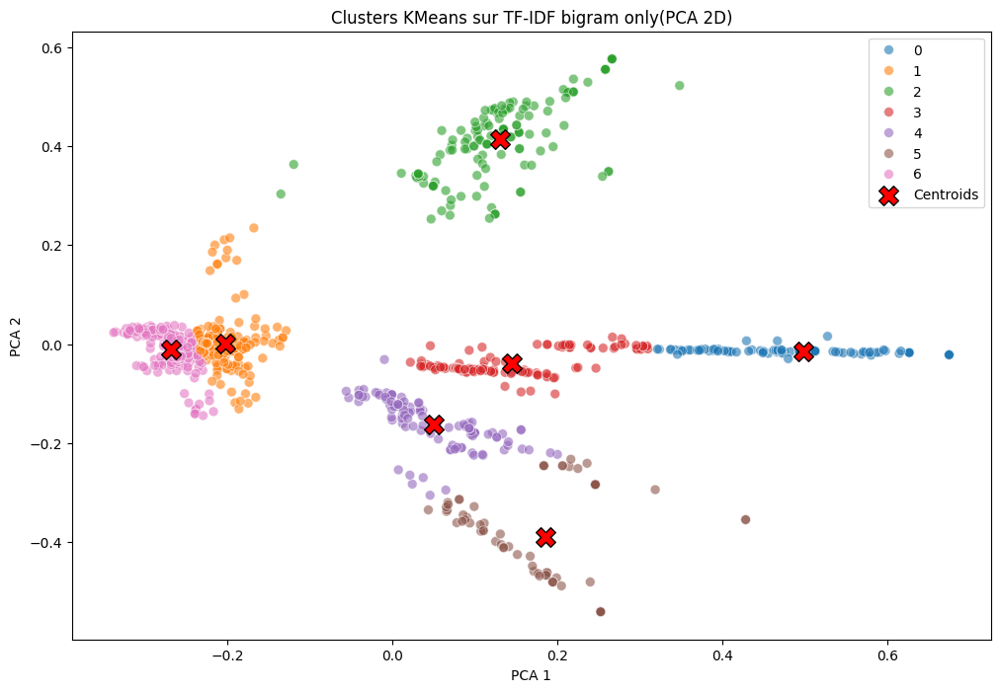

In [140]:
# Récupérer les centroïdes projetés en 2D
centers_2D = kmeans.cluster_centers_

plt.figure(figsize=(12, 8))

# Nuage de points
sns.scatterplot(
    x=X_bow_2D[:, 0],
    y=X_bow_2D[:, 1],
    hue=cluster_labels,
    palette="tab10",
    alpha=0.6,
    s=50,
    legend="full"
)

# Centroïdes en rouge
plt.scatter(
    centers_2D[:, 0],
    centers_2D[:, 1],
    c="red",
    marker="X",
    s=200,
    edgecolor="black",
    label="Centroids"
)

plt.title("Clusters KMeans sur TF-IDF bigram only(PCA 2D)")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.legend()
plt.show()

In [141]:
pca_silh_X_tfidf3gram = silhouette_score(X_bow_2D, cluster_labels)
print(f"Silhouette Score: {pca_silh_X_tfidf3gram}")

Silhouette Score: 0.46490243747585586


In [142]:
pca_dbi_X_tfidf3gram = davies_bouldin_score(X_bow_2D, cluster_labels)
print(f"Davies-Bouldin Index: {pca_dbi_X_tfidf3gram}")

Davies-Bouldin Index: 0.7761922186973879


In [143]:
pca_ari_X_tfidf3gram = adjusted_rand_score(df_data['top_category'], df_data['pca_X_tfidf2gramonly'])
print("Adjusted Rand Index:", pca_ari_X_tfidf3gram)

Adjusted Rand Index: 0.149516061754978


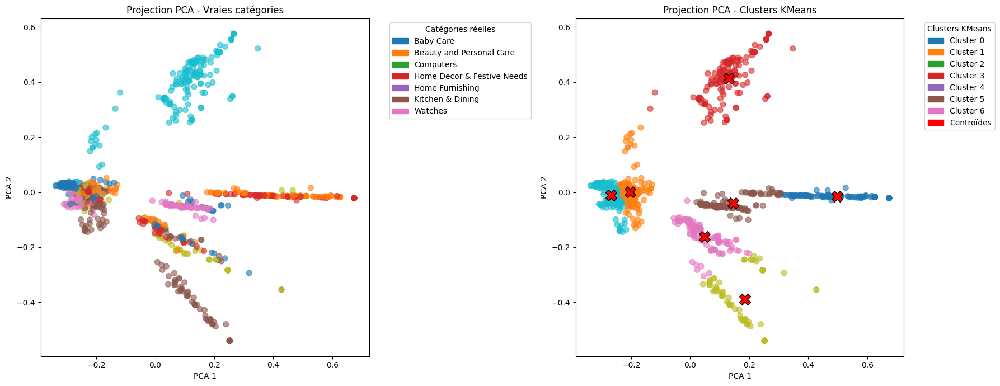

In [144]:
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Graphe de gauche : vraies catégories
scatter1 = axes[0].scatter(
    X_bow_2D[:, 0],
    X_bow_2D[:, 1],
    c=true_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

axes[0].set_title("Projection PCA - Vraies catégories")
axes[0].set_xlabel("PCA 1")
axes[0].set_ylabel("PCA 2")

# Graphe de droite : clusters KMeans + centroïdes
scatter2 = axes[1].scatter(
    X_bow_2D[:, 0],
    X_bow_2D[:, 1],
    c=cluster_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

# Ajouter les centroïdes en rouge
axes[1].scatter(
    centers_2D[:, 0],
    centers_2D[:, 1],
    c="red",
    marker="X",
    s=200,
    edgecolor="black",
    label="Centroïdes"
)

axes[1].set_title("Projection PCA - Clusters KMeans")
axes[1].set_xlabel("PCA 1")
axes[1].set_ylabel("PCA 2")

# Légende pour les vraies catégories (à gauche)
legend1 = axes[0].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=cat)
        for i, cat in enumerate(le.classes_)
    ],
    title="Catégories réelles",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

# Légende pour les clusters (à droite)
legend2 = axes[1].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=f"Cluster {i}")
        for i in range(n_cluster)
    ] + [mpatches.Patch(color="red", label="Centroïdes")],
    title="Clusters KMeans",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

fig.tight_layout()
plt.show()

#### Etape 2: Embeddings avancés

Voici notre parcours :

🔸 Word2Vec

🔸 USE (Universal Sentence Encoder)

🔸 BERT

Pour chacun, on fera :

Chargement du modèle

Vectorisation des descriptions

Réduction de dimension (PCA/t-SNE)

Visualisation 2D avec couleurs par catégorie

##### t-SNE Word2Vec 

In [145]:
from gensim.models import Word2Vec

##### Préparation du corpus tokenisé

In [146]:
def tokenize(text):
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)
    text = re.sub(r'\d+', '', text)
    tokens = nltk.word_tokenize(text)
    tokens = [t for t in tokens if t not in stop_words]
    tokens = [lemmatizer.lemmatize(t) for t in tokens]
    return tokens

In [147]:
df_data['tokens'] = df_data['description'].apply(tokenize)

In [148]:
# Corpus = liste de listes de tokens
corpus = df_data['tokens'].tolist()

# Entraînement
w2v_model = Word2Vec(
    sentences=corpus,
    vector_size=100,  # taille des vecteurs
    window=5,
    min_count=0.2,
    workers=4,
    sg=1  # skip-gram (sg=1) ou CBOW (sg=0)
)

In [149]:
print(corpus)

[['key', 'feature', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtainelegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'cm', 'height', 'pack', 'price', 'r', 'curtain', 'enhances', 'look', 'interiorsthis', 'curtain', 'made', 'high', 'quality', 'polyester', 'fabricit', 'feature', 'eyelet', 'style', 'stitch', 'metal', 'ringit', 'make', 'room', 'environment', 'romantic', 'lovingthis', 'curtain', 'ant', 'wrinkle', 'anti', 'shrinkage', 'elegant', 'apparancegive', 'home', 'bright', 'modernistic', 'appeal', 'design', 'surreal', 'attention', 'sure', 'steal', 'heart', 'contemporary', 'eyelet', 'valance', 'curtain', 'slide', 'smoothly', 'draw', 'apart', 'first', 'thing', 'morning', 'welcome', 'bright', 'sun', 'ray', 'want', 'wish', 'good', 'morning', 'whole', 'world', 'draw', 'close', 'evening', 'create', 'special', 'moment', 'joyous', 'beauty', 'given', 'soothing', 'print', 'bring', 'home', 'elegant', 'curtain', 'softl

In [150]:
def get_sentence_vector(tokens, model):
    vectors = [model.wv[word] for word in tokens if word in model.wv]
    if len(vectors) > 0:
        return np.mean(vectors, axis=0)
    else:
        return np.zeros(model.vector_size)

df_data['w2v_vector'] = df_data['tokens'].apply(lambda x: get_sentence_vector(x, w2v_model))
X_w2v = np.stack(df_data['w2v_vector'].values)

In [151]:
# Création d'un modèle t-SNE à 2 composantes (pour une visualisation en 2D)
tsne = TSNE(n_components=2, random_state=42)

X_w2v_2D = tsne.fit_transform(X_w2v)

print(X_w2v_2D.shape)

(1050, 2)


In [152]:
kmeans = KMeans(n_clusters=n_cluster, random_state=42)
cluster_labels = kmeans.fit_predict(X_w2v_2D)

In [153]:
unique_labels, label_counts = np.unique(cluster_labels, return_counts=True)
# Affiche le compte pour chaque cluster étiqueté
for label, count in zip(unique_labels, label_counts):
    print(f'CLUSTER {label} contains {count} products')

CLUSTER 0 contains 154 products
CLUSTER 1 contains 277 products
CLUSTER 2 contains 134 products
CLUSTER 3 contains 91 products
CLUSTER 4 contains 185 products
CLUSTER 5 contains 44 products
CLUSTER 6 contains 165 products


In [154]:
df_data['tsne_X_w2v'] = cluster_labels

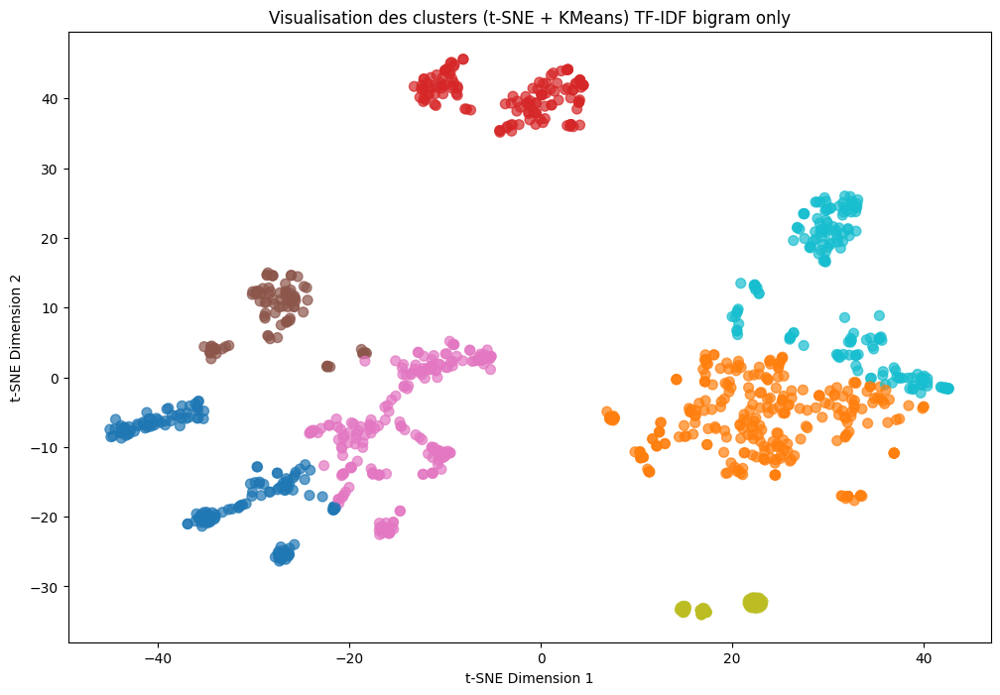

In [155]:
plt.figure(figsize=(12, 8))

# Scatter plot des points
plt.scatter(
    X_w2v_2D[:, 0],
    X_w2v_2D[:, 1],
    c=cluster_labels,
    cmap='tab10',
    alpha=0.7,
    s=50,
)

plt.title("Visualisation des clusters (t-SNE + KMeans) TF-IDF bigram only")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()

In [156]:
t_sne_silh_X_w2v = silhouette_score(X_w2v_2D, cluster_labels)
print(f"Silhouette Score: {t_sne_silh_X_w2v}")

Silhouette Score: 0.48802611231803894


In [157]:
t_sne_dbi_X_w2v = davies_bouldin_score(X_w2v_2D, cluster_labels)
print(f"Davies-Bouldin Index: {t_sne_dbi_X_w2v}")

Davies-Bouldin Index: 0.7321024965244634


In [158]:
t_sne_ari_X_w2v = adjusted_rand_score(df_data['top_category'], df_data['tsne_X_w2v'])
print("Adjusted Rand Index:", t_sne_ari_X_w2v)

Adjusted Rand Index: 0.2772432613857951


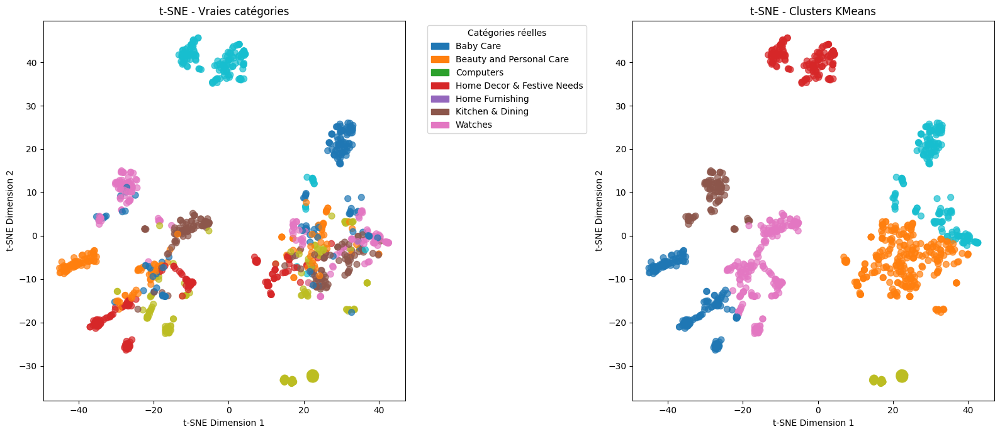

In [159]:
# Palette de couleurs (même nombre de couleurs que de catégories)
palette = sns.color_palette("tab10", len(le.classes_))

# Création de la figure avec 2 sous-graphiques
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

scatter1 = axes[0].scatter(
    X_w2v_2D[:, 0],
    X_w2v_2D[:, 1],
    c=true_labels,
    cmap="tab10",
    alpha=0.7,
    s=50
)
axes[0].set_title("t-SNE - Vraies catégories")
axes[0].set_xlabel("t-SNE Dimension 1")
axes[0].set_ylabel("t-SNE Dimension 2")

# Graphe de droite : clusters KMeans
scatter2 = axes[1].scatter(
    X_w2v_2D[:, 0],
    X_w2v_2D[:, 1],
    c=cluster_labels,
    cmap="tab10",
    alpha=0.7,
    s=50
)
axes[1].set_title("t-SNE - Clusters KMeans")
axes[1].set_xlabel("t-SNE Dimension 1")
axes[1].set_ylabel("t-SNE Dimension 2")

# Légende
import matplotlib.patches as mpatches
patches = [
    mpatches.Patch(color=palette[i], label=le.classes_[i])
    for i in range(len(le.classes_))
]
axes[0].legend(
    handles=patches,
    title="Catégories réelles",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

fig.tight_layout()
plt.show()

##### PCA Word2Vec

In [160]:
# Bag of Words → 2D
pca_w2v = PCA(n_components=2)
pca_X_w2v_2D = pca_bow.fit_transform(X_w2v)

In [161]:
kmeans = KMeans(n_clusters=n_cluster, random_state=42)
cluster_labels = kmeans.fit_predict(pca_X_w2v_2D)

In [162]:
unique_labels, label_counts = np.unique(cluster_labels, return_counts=True)
# Affiche le compte pour chaque cluster étiqueté
for label, count in zip(unique_labels, label_counts):
    print(f'CLUSTER {label} contains {count} products')

CLUSTER 0 contains 233 products
CLUSTER 1 contains 100 products
CLUSTER 2 contains 146 products
CLUSTER 3 contains 196 products
CLUSTER 4 contains 198 products
CLUSTER 5 contains 44 products
CLUSTER 6 contains 133 products


In [163]:
df_data['pca_X_w2v'] = cluster_labels

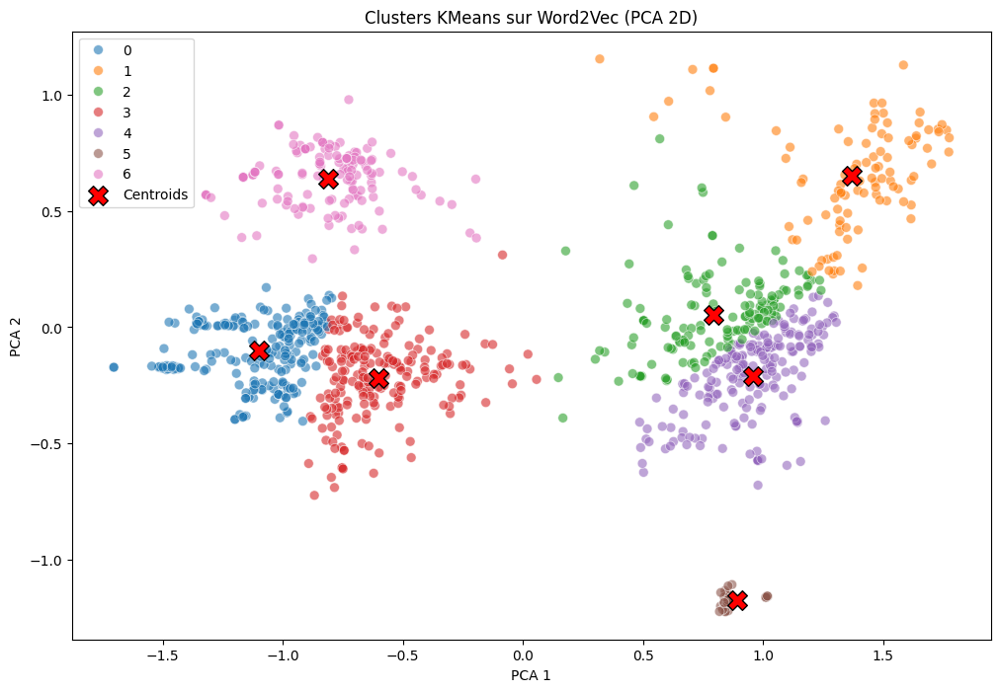

In [164]:
# Récupérer les centroïdes projetés en 2D
centers_2D = kmeans.cluster_centers_

plt.figure(figsize=(12, 8))

# Nuage de points
sns.scatterplot(
    x=pca_X_w2v_2D[:, 0],
    y=pca_X_w2v_2D[:, 1],
    hue=cluster_labels,
    palette="tab10",
    alpha=0.6,
    s=50,
    legend="full"
)

# Centroïdes en rouge
plt.scatter(
    centers_2D[:, 0],
    centers_2D[:, 1],
    c="red",
    marker="X",
    s=200,
    edgecolor="black",
    label="Centroids"
)

plt.title("Clusters KMeans sur Word2Vec (PCA 2D)")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.legend()
plt.show()

In [165]:
pca_silh_X_w2v = silhouette_score(pca_X_w2v_2D, cluster_labels)
print(f"Silhouette Score: {pca_silh_X_w2v}")

Silhouette Score: 0.4159380793571472


In [166]:
pca_dbi_X_w2v = davies_bouldin_score(pca_X_w2v_2D, cluster_labels)
print(f"Davies-Bouldin Index: {pca_dbi_X_w2v}")

Davies-Bouldin Index: 0.9177970953180276


In [167]:
pca_ari_X_w2v = adjusted_rand_score(df_data['top_category'], df_data['pca_X_w2v'])
print("Adjusted Rand Index:", pca_ari_X_w2v)

Adjusted Rand Index: 0.21735282657101987


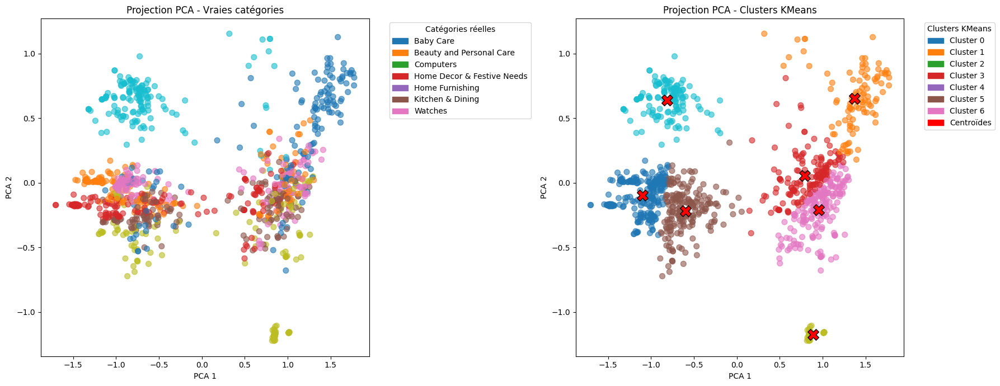

In [168]:
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Graphe de gauche : vraies catégories
scatter1 = axes[0].scatter(
    pca_X_w2v_2D[:, 0],
    pca_X_w2v_2D[:, 1],
    c=true_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

axes[0].set_title("Projection PCA - Vraies catégories")
axes[0].set_xlabel("PCA 1")
axes[0].set_ylabel("PCA 2")

# Graphe de droite : clusters KMeans + centroïdes
scatter2 = axes[1].scatter(
    pca_X_w2v_2D[:, 0],
    pca_X_w2v_2D[:, 1],
    c=cluster_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

# Ajouter les centroïdes en rouge
axes[1].scatter(
    centers_2D[:, 0],
    centers_2D[:, 1],
    c="red",
    marker="X",
    s=200,
    edgecolor="black",
    label="Centroïdes"
)

axes[1].set_title("Projection PCA - Clusters KMeans")
axes[1].set_xlabel("PCA 1")
axes[1].set_ylabel("PCA 2")

# Légende pour les vraies catégories (à gauche)
legend1 = axes[0].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=cat)
        for i, cat in enumerate(le.classes_)
    ],
    title="Catégories réelles",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

# Légende pour les clusters (à droite)
legend2 = axes[1].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=f"Cluster {i}")
        for i in range(n_cluster)
    ] + [mpatches.Patch(color="red", label="Centroïdes")],
    title="Clusters KMeans",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

fig.tight_layout()
plt.show()

##### t-SNE Word2Vec (CBOW)

In [169]:
# Corpus = liste de listes de tokens
corpus = df_data['tokens'].tolist()

# Entraînement
w2v_model = Word2Vec(
    sentences=corpus,
    vector_size=500,  # taille des vecteurs
    window=3,
    min_count=0.2,
    workers=4,
    sg=0  # skip-gram (sg=1) ou CBOW (sg=0)
)

In [170]:
df_data['w2v_vector'] = df_data['tokens'].apply(lambda x: get_sentence_vector(x, w2v_model))
X_w2v = np.stack(df_data['w2v_vector'].values)

In [171]:
# Création d'un modèle t-SNE à 2 composantes (pour une visualisation en 2D)
tsne = TSNE(n_components=2, random_state=42)

X_w2v_2D = tsne.fit_transform(X_w2v)

print(X_w2v_2D.shape)

(1050, 2)


In [172]:
kmeans = KMeans(n_clusters=n_cluster, random_state=42)
cluster_labels = kmeans.fit_predict(X_w2v_2D)

In [173]:
unique_labels, label_counts = np.unique(cluster_labels, return_counts=True)
# Affiche le compte pour chaque cluster étiqueté
for label, count in zip(unique_labels, label_counts):
    print(f'CLUSTER {label} contains {count} products')

CLUSTER 0 contains 132 products
CLUSTER 1 contains 228 products
CLUSTER 2 contains 178 products
CLUSTER 3 contains 125 products
CLUSTER 4 contains 101 products
CLUSTER 5 contains 156 products
CLUSTER 6 contains 130 products


In [174]:
df_data['tsne_X_cbow'] = cluster_labels

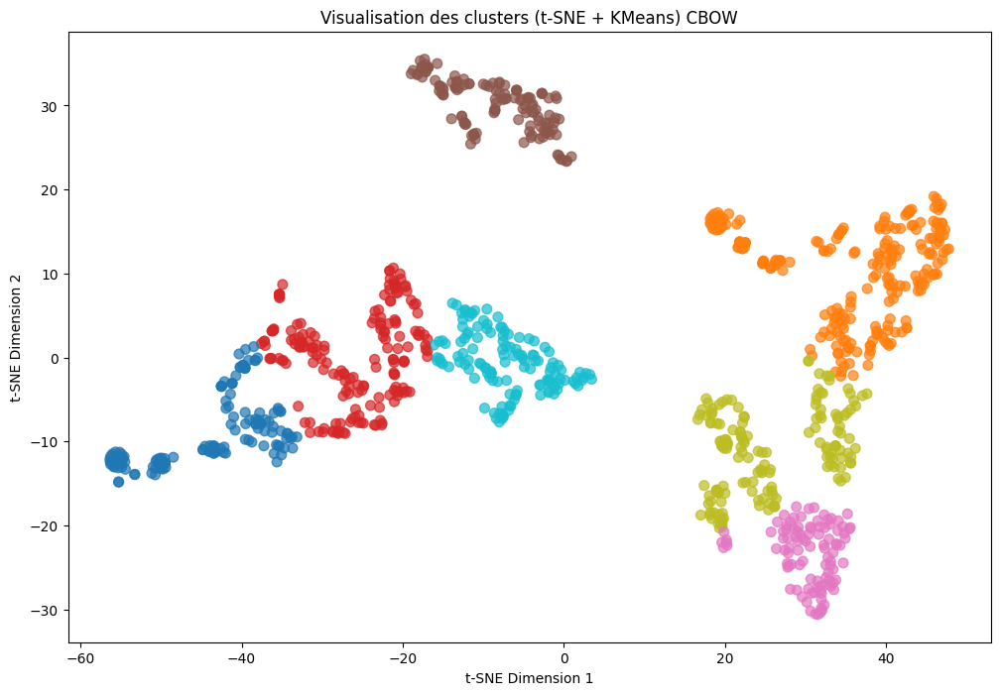

In [175]:
plt.figure(figsize=(12, 8))

# Scatter plot des points
plt.scatter(
    X_w2v_2D[:, 0],
    X_w2v_2D[:, 1],
    c=cluster_labels,
    cmap='tab10',
    alpha=0.7,
    s=50,
)

plt.title("Visualisation des clusters (t-SNE + KMeans) CBOW")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()

In [176]:
t_sne_silh_X_cbow = silhouette_score(X_w2v_2D, cluster_labels)
print(f"Silhouette Score: {t_sne_silh_X_cbow}")

Silhouette Score: 0.48730430006980896


In [177]:
t_sne_dbi_X_cbow = davies_bouldin_score(X_w2v_2D, cluster_labels)
print(f"Davies-Bouldin Index: {t_sne_dbi_X_cbow}")

Davies-Bouldin Index: 0.7369560963841081


In [178]:
t_sne_ari_X_cbow = adjusted_rand_score(df_data['top_category'], df_data['tsne_X_cbow'])
print("Adjusted Rand Index:", t_sne_ari_X_w2v)

Adjusted Rand Index: 0.2772432613857951


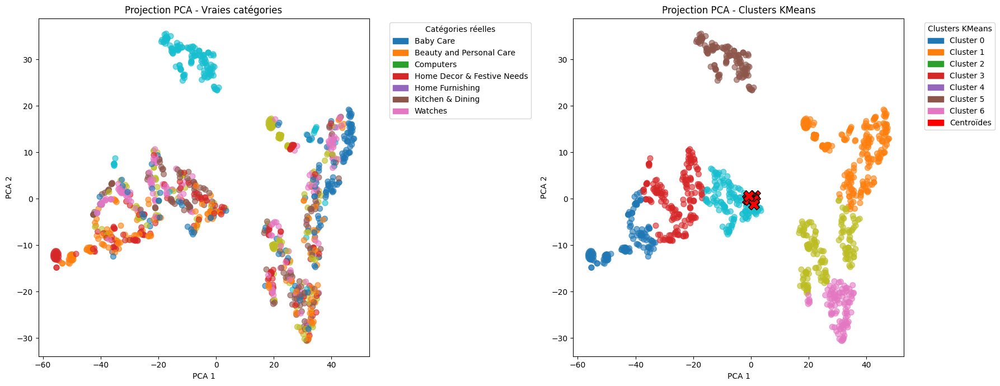

In [179]:
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Graphe de gauche : vraies catégories
scatter1 = axes[0].scatter(
    X_w2v_2D[:, 0],
    X_w2v_2D[:, 1],
    c=true_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

axes[0].set_title("Projection PCA - Vraies catégories")
axes[0].set_xlabel("PCA 1")
axes[0].set_ylabel("PCA 2")

# Graphe de droite : clusters KMeans + centroïdes
scatter2 = axes[1].scatter(
    X_w2v_2D[:, 0],
    X_w2v_2D[:, 1],
    c=cluster_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

# Ajouter les centroïdes en rouge
axes[1].scatter(
    centers_2D[:, 0],
    centers_2D[:, 1],
    c="red",
    marker="X",
    s=200,
    edgecolor="black",
    label="Centroïdes"
)

axes[1].set_title("Projection PCA - Clusters KMeans")
axes[1].set_xlabel("PCA 1")
axes[1].set_ylabel("PCA 2")

# Légende pour les vraies catégories (à gauche)
legend1 = axes[0].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=cat)
        for i, cat in enumerate(le.classes_)
    ],
    title="Catégories réelles",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

# Légende pour les clusters (à droite)
legend2 = axes[1].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=f"Cluster {i}")
        for i in range(n_cluster)
    ] + [mpatches.Patch(color="red", label="Centroïdes")],
    title="Clusters KMeans",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

fig.tight_layout()
plt.show()

##### PCA Word2Vec (CBOW)

In [180]:
# Bag of Words → 2D
pca_cbow = PCA(n_components=2)
pca_X_cbow_2D = pca_cbow.fit_transform(X_w2v)

In [181]:
kmeans = KMeans(n_clusters=n_cluster, random_state=42)
cluster_labels = kmeans.fit_predict(pca_X_cbow_2D)

In [182]:
unique_labels, label_counts = np.unique(cluster_labels, return_counts=True)
# Affiche le compte pour chaque cluster étiqueté
for label, count in zip(unique_labels, label_counts):
    print(f'CLUSTER {label} contains {count} products')

CLUSTER 0 contains 120 products
CLUSTER 1 contains 134 products
CLUSTER 2 contains 190 products
CLUSTER 3 contains 252 products
CLUSTER 4 contains 78 products
CLUSTER 5 contains 122 products
CLUSTER 6 contains 154 products


In [183]:
df_data['pca_X_cbow'] = cluster_labels

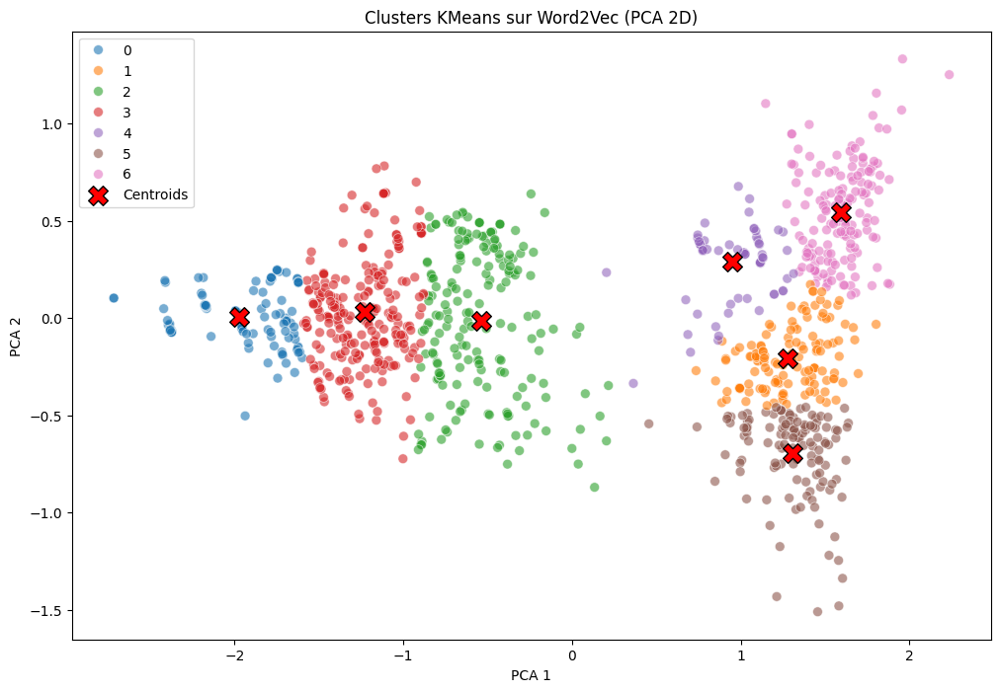

In [184]:
# Récupérer les centroïdes projetés en 2D
centers_2D = kmeans.cluster_centers_

plt.figure(figsize=(12, 8))

# Nuage de points
sns.scatterplot(
    x=pca_X_cbow_2D[:, 0],
    y=pca_X_cbow_2D[:, 1],
    hue=cluster_labels,
    palette="tab10",
    alpha=0.6,
    s=50,
    legend="full"
)

# Centroïdes en rouge
plt.scatter(
    centers_2D[:, 0],
    centers_2D[:, 1],
    c="red",
    marker="X",
    s=200,
    edgecolor="black",
    label="Centroids"
)

plt.title("Clusters KMeans sur Word2Vec (PCA 2D)")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.legend()
plt.show()

In [185]:
pca_silh_X_cbow = silhouette_score(pca_X_cbow_2D, cluster_labels)
print(f"Silhouette Score: {pca_silh_X_cbow}")

Silhouette Score: 0.38068652153015137


In [186]:
pca_dbi_X_cbow = davies_bouldin_score(pca_X_cbow_2D, cluster_labels)
print(f"Davies-Bouldin Index: {pca_dbi_X_cbow}")

Davies-Bouldin Index: 0.911368405953694


In [187]:
pca_ari_X_cbow = adjusted_rand_score(df_data['top_category'], df_data['pca_X_cbow'])
print("Adjusted Rand Index:", pca_ari_X_cbow)

Adjusted Rand Index: 0.1051357825189867


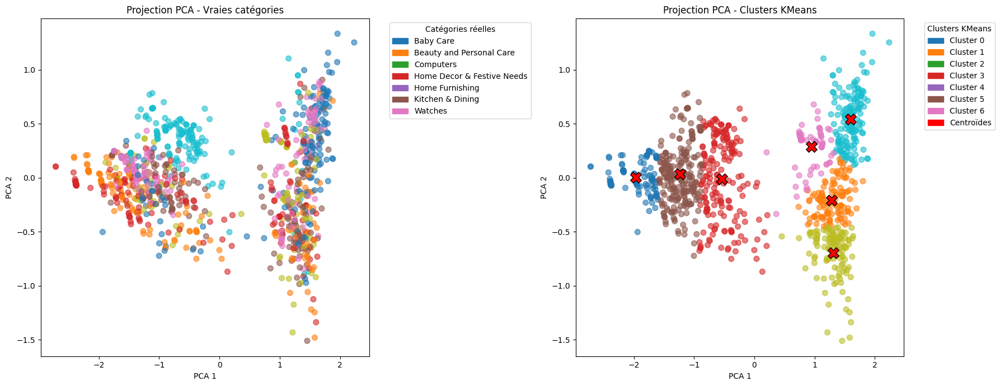

In [188]:
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Graphe de gauche : vraies catégories
scatter1 = axes[0].scatter(
    pca_X_cbow_2D[:, 0],
    pca_X_cbow_2D[:, 1],
    c=true_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

axes[0].set_title("Projection PCA - Vraies catégories")
axes[0].set_xlabel("PCA 1")
axes[0].set_ylabel("PCA 2")

# Graphe de droite : clusters KMeans + centroïdes
scatter2 = axes[1].scatter(
    pca_X_cbow_2D[:, 0],
    pca_X_cbow_2D[:, 1],
    c=cluster_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

# Ajouter les centroïdes en rouge
axes[1].scatter(
    centers_2D[:, 0],
    centers_2D[:, 1],
    c="red",
    marker="X",
    s=200,
    edgecolor="black",
    label="Centroïdes"
)

axes[1].set_title("Projection PCA - Clusters KMeans")
axes[1].set_xlabel("PCA 1")
axes[1].set_ylabel("PCA 2")

# Légende pour les vraies catégories (à gauche)
legend1 = axes[0].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=cat)
        for i, cat in enumerate(le.classes_)
    ],
    title="Catégories réelles",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

# Légende pour les clusters (à droite)
legend2 = axes[1].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=f"Cluster {i}")
        for i in range(n_cluster)
    ] + [mpatches.Patch(color="red", label="Centroïdes")],
    title="Clusters KMeans",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

fig.tight_layout()
plt.show()

##### t-SNE Universal Sentence Encoder (USE)

USE encode directement une phrase entière → pas besoin de faire la moyenne de vecteurs

Il capture des aspects syntaxiques, sémantiques et contextuels

Il est basé sur TensorFlow Hub, donc on doit l’importer depuis là

In [189]:
import tensorflow as tf
import tensorflow_hub as hub

print(tf.__version__)
print(hub.__version__)



2.20.0
0.16.1


In [190]:
import tensorflow_hub as hub
import tensorflow as tf

# Charger le modèle
use_model = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

pas besoin de tokens. On peut directement utiliser la description d’origine nettoyée

In [191]:
# Convertir en liste de phrases
sentences = df_data['description'].tolist()

# Créer les vecteurs avec USE
X_use = use_model(sentences)
X_use = X_use.numpy()  # Tensor → numpy array

In [192]:
# Création d'un modèle t-SNE à 2 composantes (pour une visualisation en 2D)
tsne = TSNE(n_components=2, random_state=42)

X_use_2D = tsne.fit_transform(X_use)

print(X_use_2D.shape)

(1050, 2)


In [193]:
kmeans = KMeans(n_clusters=n_cluster, random_state=42)
cluster_labels = kmeans.fit_predict(X_use_2D)

In [194]:
unique_labels, label_counts = np.unique(cluster_labels, return_counts=True)
# Affiche le compte pour chaque cluster étiqueté
for label, count in zip(unique_labels, label_counts):
    print(f'CLUSTER {label} contains {count} products')

CLUSTER 0 contains 161 products
CLUSTER 1 contains 211 products
CLUSTER 2 contains 149 products
CLUSTER 3 contains 119 products
CLUSTER 4 contains 95 products
CLUSTER 5 contains 165 products
CLUSTER 6 contains 150 products


In [195]:
df_data['tsne_X_use'] = cluster_labels

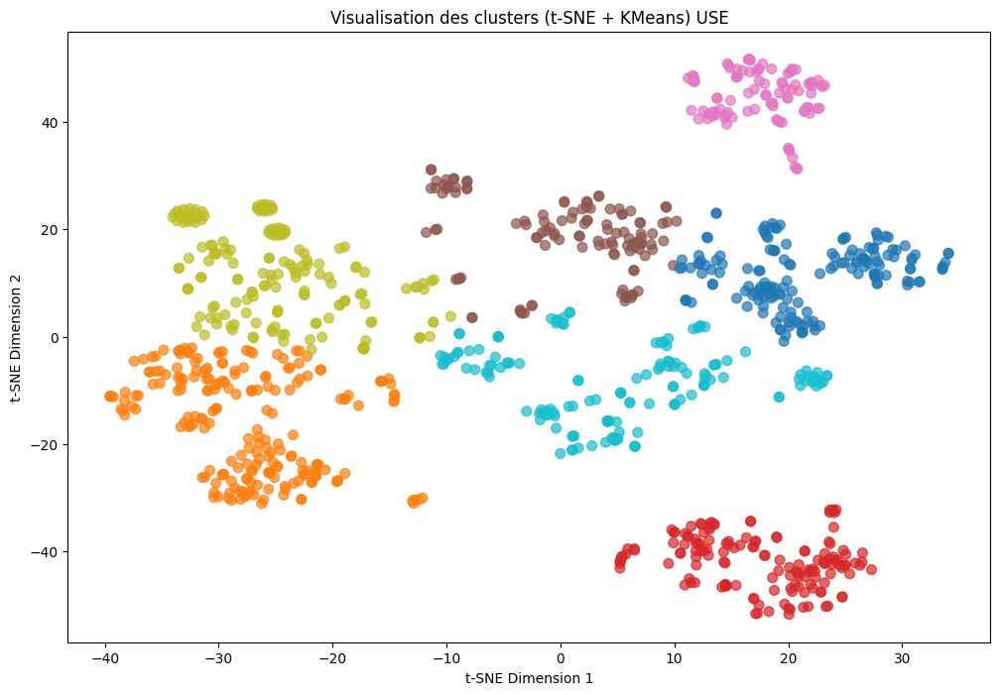

In [196]:
plt.figure(figsize=(12, 8))

# Scatter plot des points
plt.scatter(
    X_use_2D[:, 0],
    X_use_2D[:, 1],
    c=cluster_labels,
    cmap='tab10',
    alpha=0.7,
    s=50,
)

plt.title("Visualisation des clusters (t-SNE + KMeans) USE")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()

In [197]:
t_sne_silh_X_use = silhouette_score(X_use_2D, cluster_labels)
print(f"Silhouette Score: {t_sne_silh_X_use}")

Silhouette Score: 0.5201935768127441


In [198]:
t_sne_dbi_X_use = davies_bouldin_score(X_use_2D, cluster_labels)
print(f"Davies-Bouldin Index: {t_sne_dbi_X_use}")

Davies-Bouldin Index: 0.6436055865637004


In [199]:
t_sne_ari_X_use = adjusted_rand_score(df_data['top_category'], df_data['tsne_X_use'])
print("Adjusted Rand Index:", t_sne_ari_X_use)

Adjusted Rand Index: 0.4431293915215885


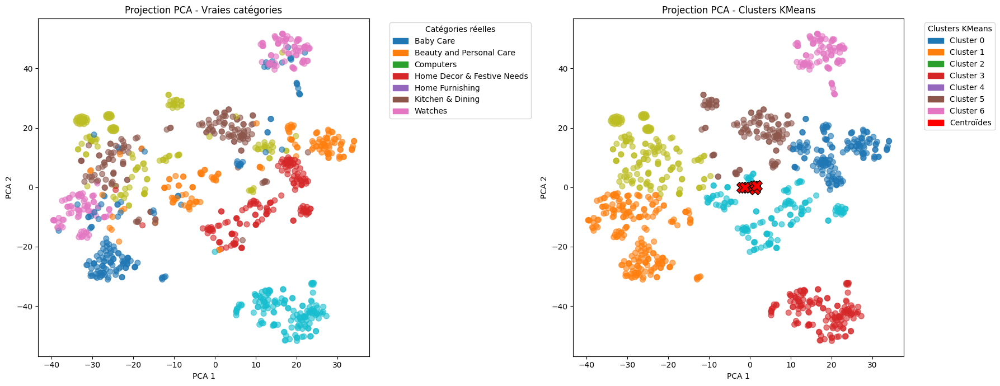

In [200]:
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Graphe de gauche : vraies catégories
scatter1 = axes[0].scatter(
    X_use_2D[:, 0],
    X_use_2D[:, 1],
    c=true_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

axes[0].set_title("Projection PCA - Vraies catégories")
axes[0].set_xlabel("PCA 1")
axes[0].set_ylabel("PCA 2")

# Graphe de droite : clusters KMeans + centroïdes
scatter2 = axes[1].scatter(
    X_use_2D[:, 0],
    X_use_2D[:, 1],
    c=cluster_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

# Ajouter les centroïdes en rouge
axes[1].scatter(
    centers_2D[:, 0],
    centers_2D[:, 1],
    c="red",
    marker="X",
    s=200,
    edgecolor="black",
    label="Centroïdes"
)

axes[1].set_title("Projection PCA - Clusters KMeans")
axes[1].set_xlabel("PCA 1")
axes[1].set_ylabel("PCA 2")

# Légende pour les vraies catégories (à gauche)
legend1 = axes[0].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=cat)
        for i, cat in enumerate(le.classes_)
    ],
    title="Catégories réelles",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

# Légende pour les clusters (à droite)
legend2 = axes[1].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=f"Cluster {i}")
        for i in range(n_cluster)
    ] + [mpatches.Patch(color="red", label="Centroïdes")],
    title="Clusters KMeans",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

fig.tight_layout()
plt.show()

##### PCA USE

In [201]:
# Bag of Words → 2D
pca_use = PCA(n_components=2)
pca_X_use_2D = pca_use.fit_transform(X_use)

In [202]:
kmeans = KMeans(n_clusters=n_cluster, random_state=42)
cluster_labels = kmeans.fit_predict(pca_X_use_2D)

In [203]:
unique_labels, label_counts = np.unique(cluster_labels, return_counts=True)
# Affiche le compte pour chaque cluster étiqueté
for label, count in zip(unique_labels, label_counts):
    print(f'CLUSTER {label} contains {count} products')

CLUSTER 0 contains 282 products
CLUSTER 1 contains 126 products
CLUSTER 2 contains 146 products
CLUSTER 3 contains 134 products
CLUSTER 4 contains 121 products
CLUSTER 5 contains 104 products
CLUSTER 6 contains 137 products


In [204]:
df_data['pca_X_use'] = cluster_labels

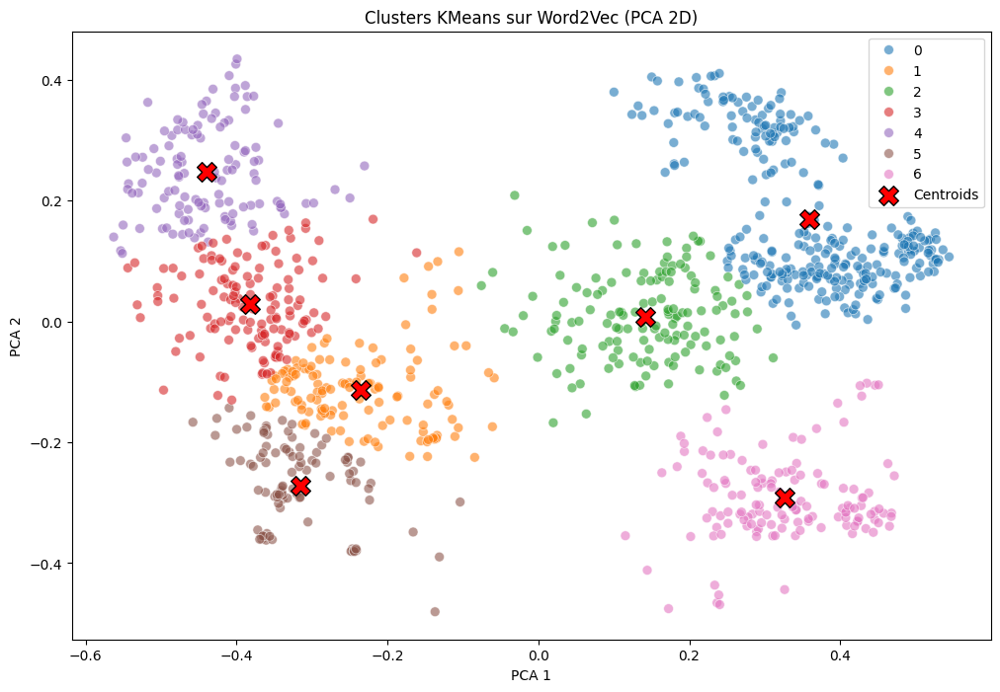

In [205]:
# Récupérer les centroïdes projetés en 2D
centers_2D = kmeans.cluster_centers_

plt.figure(figsize=(12, 8))

# Nuage de points
sns.scatterplot(
    x=pca_X_use_2D[:, 0],
    y=pca_X_use_2D[:, 1],
    hue=cluster_labels,
    palette="tab10",
    alpha=0.6,
    s=50,
    legend="full"
)

# Centroïdes en rouge
plt.scatter(
    centers_2D[:, 0],
    centers_2D[:, 1],
    c="red",
    marker="X",
    s=200,
    edgecolor="black",
    label="Centroids"
)

plt.title("Clusters KMeans sur Word2Vec (PCA 2D)")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.legend()
plt.show()

In [206]:
pca_silh_X_use = silhouette_score(pca_X_use_2D, cluster_labels)
print(f"Silhouette Score: {pca_silh_X_use}")

Silhouette Score: 0.4305839240550995


In [207]:
pca_dbi_X_use = davies_bouldin_score(pca_X_use_2D, cluster_labels)
print(f"Davies-Bouldin Index: {pca_dbi_X_use}")

Davies-Bouldin Index: 0.8372773339234912


In [208]:
pca_ari_X_use = adjusted_rand_score(df_data['top_category'], df_data['pca_X_use'])
print("Adjusted Rand Index:", pca_ari_X_use)

Adjusted Rand Index: 0.23545747116588975


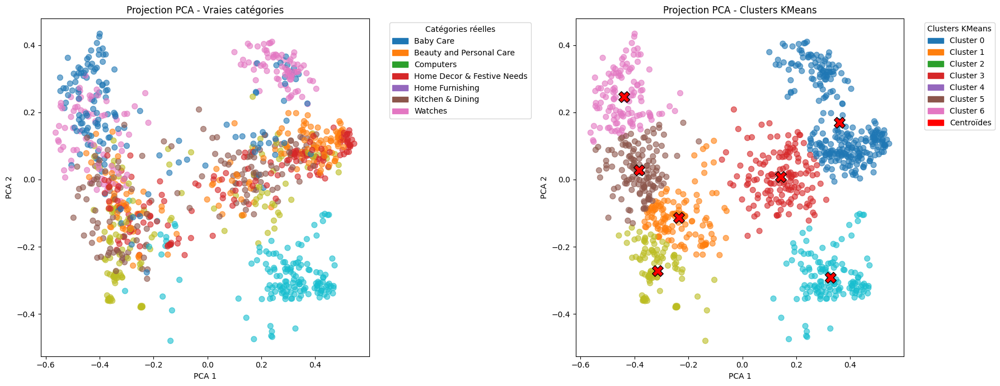

In [209]:
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Graphe de gauche : vraies catégories
scatter1 = axes[0].scatter(
    pca_X_use_2D[:, 0],
    pca_X_use_2D[:, 1],
    c=true_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

axes[0].set_title("Projection PCA - Vraies catégories")
axes[0].set_xlabel("PCA 1")
axes[0].set_ylabel("PCA 2")

# Graphe de droite : clusters KMeans + centroïdes
scatter2 = axes[1].scatter(
    pca_X_use_2D[:, 0],
    pca_X_use_2D[:, 1],
    c=cluster_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

# Ajouter les centroïdes en rouge
axes[1].scatter(
    centers_2D[:, 0],
    centers_2D[:, 1],
    c="red",
    marker="X",
    s=200,
    edgecolor="black",
    label="Centroïdes"
)

axes[1].set_title("Projection PCA - Clusters KMeans")
axes[1].set_xlabel("PCA 1")
axes[1].set_ylabel("PCA 2")

# Légende pour les vraies catégories (à gauche)
legend1 = axes[0].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=cat)
        for i, cat in enumerate(le.classes_)
    ],
    title="Catégories réelles",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

# Légende pour les clusters (à droite)
legend2 = axes[1].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=f"Cluster {i}")
        for i in range(n_cluster)
    ] + [mpatches.Patch(color="red", label="Centroïdes")],
    title="Clusters KMeans",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

fig.tight_layout()
plt.show()

##### t-SNE BERT (Biderectional Encoder Representations from Transformers)

In [210]:
# 1. Nettoyage MINIMAL pour BERT
def minimal_clean_for_bert(text):
    text = str(text)
    text = re.sub(r'\s+', ' ', text)  # Espaces multiples
    return text.strip()

In [211]:
texts_bert = df_data['description'].fillna('').apply(minimal_clean_for_bert).tolist()

In [212]:
from sentence_transformers import SentenceTransformer

model_bert = SentenceTransformer('all-MiniLM-L6-v2')

c:\Users\herbett\OneDrive - LEMKEN GmbH & Co.KG\Documents\Data_Science_OC\Classifier_automatiquement_biens_consommation\.venv_nlp\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [213]:
# Obtenir la matrice directement
X_bert = model_bert.encode(
    texts_bert,
    batch_size=32,
    show_progress_bar=True,
    convert_to_numpy=True,
    normalize_embeddings=True  # Normalisation L2 (aide pour K-Means)
)

print(f"Shape des embeddings: {X_bert.shape}")

Batches: 100%|██████████| 33/33 [00:31<00:00,  1.05it/s]

Shape des embeddings: (1050, 384)


In [214]:
# Création d'un modèle t-SNE à 2 composantes (pour une visualisation en 2D)
tsne = TSNE(n_components=2, random_state=42)

X_bert_2D = tsne.fit_transform(X_bert)

print(X_bert_2D.shape)

(1050, 2)


In [215]:
kmeans = KMeans(n_clusters=n_cluster, random_state=42)
cluster_labels = kmeans.fit_predict(X_bert_2D)

In [216]:
unique_labels, label_counts = np.unique(cluster_labels, return_counts=True)
# Affiche le compte pour chaque cluster étiqueté
for label, count in zip(unique_labels, label_counts):
    print(f'CLUSTER {label} contains {count} products')

CLUSTER 0 contains 151 products
CLUSTER 1 contains 173 products
CLUSTER 2 contains 155 products
CLUSTER 3 contains 170 products
CLUSTER 4 contains 98 products
CLUSTER 5 contains 119 products
CLUSTER 6 contains 184 products


In [217]:
df_data['tsne_X_bert'] = cluster_labels

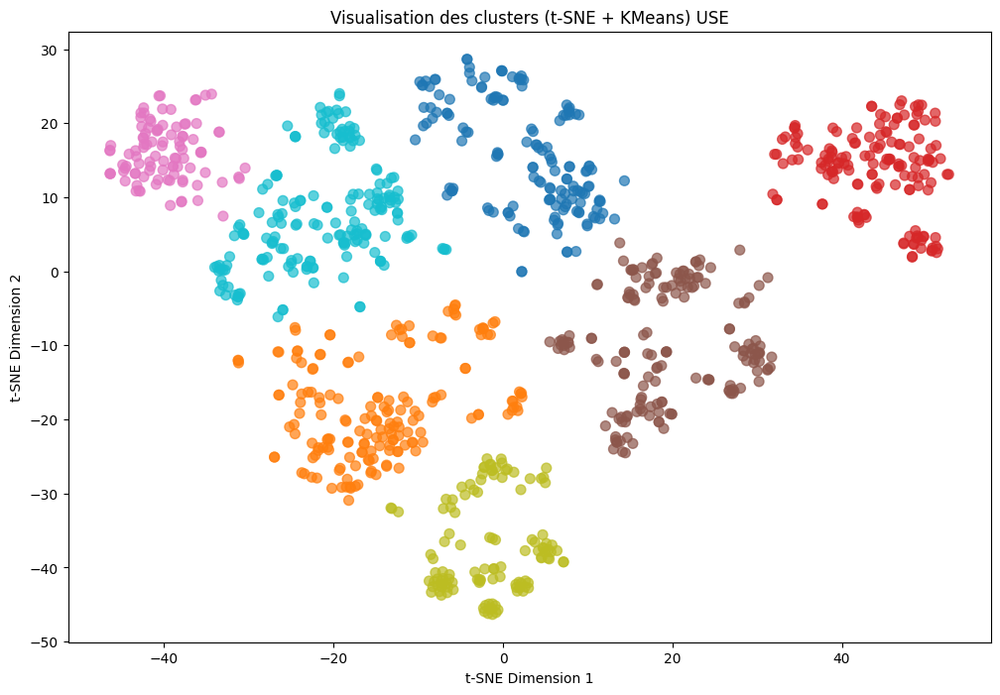

In [218]:
plt.figure(figsize=(12, 8))

# Scatter plot des points
plt.scatter(
    X_bert_2D[:, 0],
    X_bert_2D[:, 1],
    c=cluster_labels,
    cmap='tab10',
    alpha=0.7,
    s=50,
)

plt.title("Visualisation des clusters (t-SNE + KMeans) USE")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()

In [219]:
t_sne_silh_X_bert = silhouette_score(X_bert_2D, cluster_labels)
print(f"Silhouette Score: {t_sne_silh_X_bert}")

Silhouette Score: 0.5171938538551331


In [220]:
t_sne_dbi_X_bert = davies_bouldin_score(X_bert_2D, cluster_labels)
print(f"Davies-Bouldin Index: {t_sne_dbi_X_bert}")

Davies-Bouldin Index: 0.666477703477547


In [221]:
t_sne_ari_X_bert = adjusted_rand_score(df_data['top_category'], df_data['tsne_X_bert'])
print("Adjusted Rand Index:", t_sne_ari_X_use)

Adjusted Rand Index: 0.4431293915215885


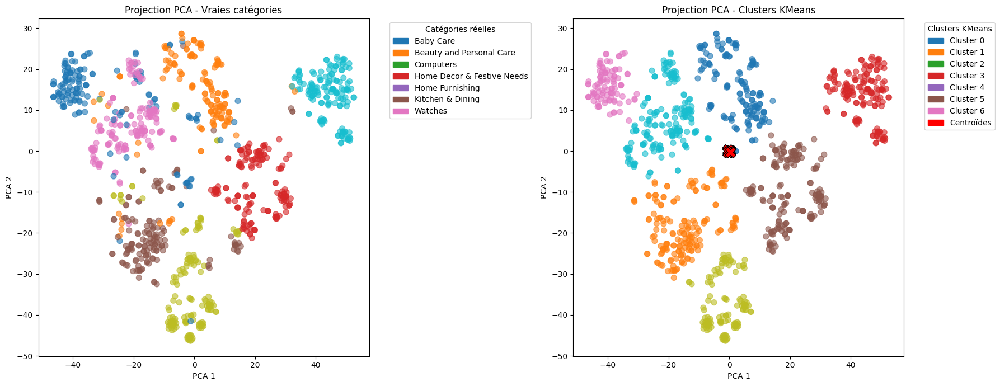

In [222]:
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Graphe de gauche : vraies catégories
scatter1 = axes[0].scatter(
    X_bert_2D[:, 0],
    X_bert_2D[:, 1],
    c=true_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

axes[0].set_title("Projection PCA - Vraies catégories")
axes[0].set_xlabel("PCA 1")
axes[0].set_ylabel("PCA 2")

# Graphe de droite : clusters KMeans + centroïdes
scatter2 = axes[1].scatter(
    X_bert_2D[:, 0],
    X_bert_2D[:, 1],
    c=cluster_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

# Ajouter les centroïdes en rouge
axes[1].scatter(
    centers_2D[:, 0],
    centers_2D[:, 1],
    c="red",
    marker="X",
    s=200,
    edgecolor="black",
    label="Centroïdes"
)

axes[1].set_title("Projection PCA - Clusters KMeans")
axes[1].set_xlabel("PCA 1")
axes[1].set_ylabel("PCA 2")

# Légende pour les vraies catégories (à gauche)
legend1 = axes[0].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=cat)
        for i, cat in enumerate(le.classes_)
    ],
    title="Catégories réelles",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

# Légende pour les clusters (à droite)
legend2 = axes[1].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=f"Cluster {i}")
        for i in range(n_cluster)
    ] + [mpatches.Patch(color="red", label="Centroïdes")],
    title="Clusters KMeans",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

fig.tight_layout()
plt.show()

##### PCA BERT

In [223]:
# Bag of Words → 2D
pca_bert = PCA(n_components=2)
pca_X_bert_2D = pca_bert.fit_transform(X_bert)

In [224]:
kmeans = KMeans(n_clusters=n_cluster, random_state=42)
cluster_labels = kmeans.fit_predict(pca_X_bert_2D)

In [225]:
unique_labels, label_counts = np.unique(cluster_labels, return_counts=True)
# Affiche le compte pour chaque cluster étiqueté
for label, count in zip(unique_labels, label_counts):
    print(f'CLUSTER {label} contains {count} products')

CLUSTER 0 contains 197 products
CLUSTER 1 contains 219 products
CLUSTER 2 contains 115 products
CLUSTER 3 contains 81 products
CLUSTER 4 contains 87 products
CLUSTER 5 contains 207 products
CLUSTER 6 contains 144 products


In [226]:
df_data['pca_X_bert'] = cluster_labels

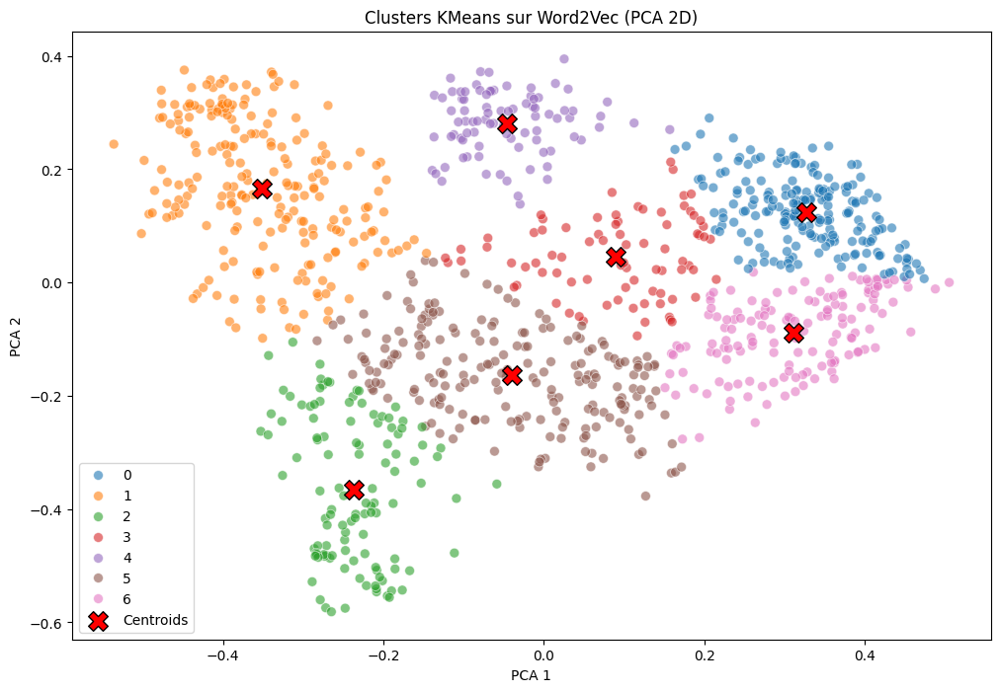

In [227]:
# Récupérer les centroïdes projetés en 2D
centers_2D = kmeans.cluster_centers_

plt.figure(figsize=(12, 8))

# Nuage de points
sns.scatterplot(
    x=pca_X_bert_2D[:, 0],
    y=pca_X_bert_2D[:, 1],
    hue=cluster_labels,
    palette="tab10",
    alpha=0.6,
    s=50,
    legend="full"
)

# Centroïdes en rouge
plt.scatter(
    centers_2D[:, 0],
    centers_2D[:, 1],
    c="red",
    marker="X",
    s=200,
    edgecolor="black",
    label="Centroids"
)

plt.title("Clusters KMeans sur Word2Vec (PCA 2D)")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.legend()
plt.show()

In [228]:
pca_silh_X_bert = silhouette_score(pca_X_bert_2D, cluster_labels)
print(f"Silhouette Score: {pca_silh_X_bert}")

Silhouette Score: 0.40625640749931335


In [229]:
pca_dbi_X_bert = davies_bouldin_score(pca_X_bert_2D, cluster_labels)
print(f"Davies-Bouldin Index: {pca_dbi_X_bert}")

Davies-Bouldin Index: 0.8106351253865814


In [230]:
pca_ari_X_bert = adjusted_rand_score(df_data['top_category'], df_data['pca_X_bert'])
print("Adjusted Rand Index:", pca_ari_X_bert)

Adjusted Rand Index: 0.29972109020282545


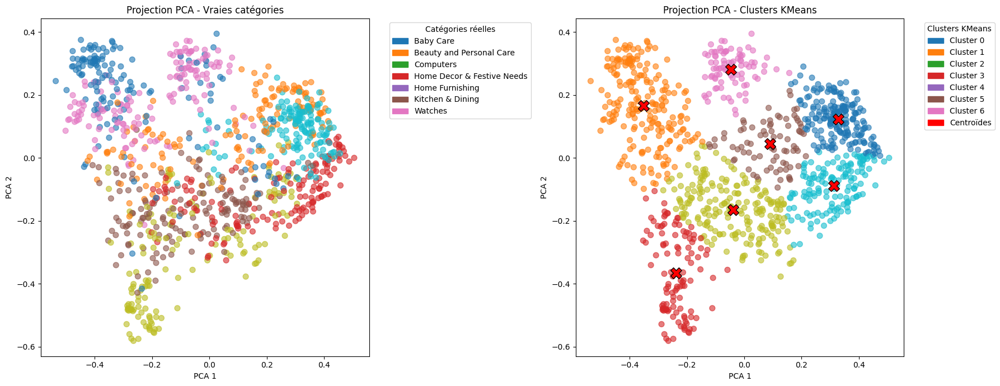

In [231]:
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Graphe de gauche : vraies catégories
scatter1 = axes[0].scatter(
    pca_X_bert_2D[:, 0],
    pca_X_bert_2D[:, 1],
    c=true_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

axes[0].set_title("Projection PCA - Vraies catégories")
axes[0].set_xlabel("PCA 1")
axes[0].set_ylabel("PCA 2")

# Graphe de droite : clusters KMeans + centroïdes
scatter2 = axes[1].scatter(
    pca_X_bert_2D[:, 0],
    pca_X_bert_2D[:, 1],
    c=cluster_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

# Ajouter les centroïdes en rouge
axes[1].scatter(
    centers_2D[:, 0],
    centers_2D[:, 1],
    c="red",
    marker="X",
    s=200,
    edgecolor="black",
    label="Centroïdes"
)

axes[1].set_title("Projection PCA - Clusters KMeans")
axes[1].set_xlabel("PCA 1")
axes[1].set_ylabel("PCA 2")

# Légende pour les vraies catégories (à gauche)
legend1 = axes[0].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=cat)
        for i, cat in enumerate(le.classes_)
    ],
    title="Catégories réelles",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

# Légende pour les clusters (à droite)
legend2 = axes[1].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=f"Cluster {i}")
        for i in range(n_cluster)
    ] + [mpatches.Patch(color="red", label="Centroïdes")],
    title="Clusters KMeans",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

fig.tight_layout()
plt.show()

##### PCA BERT UNCASED

In [232]:
import torch
from transformers import AutoTokenizer, AutoModel

# Choix du modèle
model_name = "bert-base-uncased"

# Chargement du tokenizer et du modèle
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModel.from_pretrained(model_name)

# Mise du modèle en mode évaluation
model.eval()


BertModel(
  (embeddings): BertEmbeddings(
    (word_embeddings): Embedding(30522, 768, padding_idx=0)
    (position_embeddings): Embedding(512, 768)
    (token_type_embeddings): Embedding(2, 768)
    (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (encoder): BertEncoder(
    (layer): ModuleList(
      (0-11): 12 x BertLayer(
        (attention): BertAttention(
          (self): BertSdpaSelfAttention(
            (query): Linear(in_features=768, out_features=768, bias=True)
            (key): Linear(in_features=768, out_features=768, bias=True)
            (value): Linear(in_features=768, out_features=768, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (output): BertSelfOutput(
            (dense): Linear(in_features=768, out_features=768, bias=True)
            (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
            (dropout): Dropout(p=0.1, inplace=False

In [233]:
# Récupérer la colonne description (et supprimer les NaN éventuels)
texts = df_data['cleaned_description'].dropna().astype(str).tolist()

print(f"Nombre de descriptions : {len(texts)}")
print("Exemple :", texts[0][:200])  # afficher un extrait


Nombre de descriptions : 1050
Exemple : key featur eleg polyest multicolor abstract eyelet door curtain floral curtaineleg polyest multicolor abstract eyelet door curtain cm height pack price r curtain enhanc look interiorsthi curtain made 


In [234]:
def get_bert_embeddings(texts, tokenizer, model, batch_size=16, max_len=128, device="cpu"):
    """
    Transforme une liste de textes en embeddings BERT.
    """
    all_embeddings = []

    # Envoie le modèle sur GPU si dispo
    model.to(device)

    for i in range(0, len(texts), batch_size):
        batch = texts[i:i+batch_size]

        # Tokenisation
        inputs = tokenizer(
            batch,
            padding=True,
            truncation=True,
            max_length=max_len,
            return_tensors="pt"
        ).to(device)

        # Passage dans BERT
        with torch.no_grad():
            outputs = model(**inputs)
        
        # last_hidden_state = (batch_size, seq_len, hidden_size=768)
        hidden_states = outputs.last_hidden_state

        # Moyenne sur la dimension seq_len → vecteur par texte
        embeddings = hidden_states.mean(dim=1)

        all_embeddings.append(embeddings.cpu())

    # Concaténer tous les batches
    return torch.cat(all_embeddings, dim=0)


In [235]:
# Utilisation de la fonction
device = "cuda" if torch.cuda.is_available() else "cpu"
embeddings = get_bert_embeddings(texts_bert, tokenizer, model, batch_size=16, max_len=128, device=device)

print("Shape des embeddings :", embeddings.shape)  # (1050, 768)


Shape des embeddings : torch.Size([1050, 768])


In [236]:
# Bag of Words → 2D
pca_bert = PCA(n_components=2)
pca_X_bert_uncased = pca_bert.fit_transform(embeddings)

In [237]:
kmeans = KMeans(n_clusters=n_cluster, random_state=42)
cluster_labels = kmeans.fit_predict(pca_X_bert_uncased)

In [238]:
unique_labels, label_counts = np.unique(cluster_labels, return_counts=True)
# Affiche le compte pour chaque cluster étiqueté
for label, count in zip(unique_labels, label_counts):
    print(f'CLUSTER {label} contains {count} products')

CLUSTER 0 contains 85 products
CLUSTER 1 contains 150 products
CLUSTER 2 contains 205 products
CLUSTER 3 contains 133 products
CLUSTER 4 contains 194 products
CLUSTER 5 contains 184 products
CLUSTER 6 contains 99 products


In [239]:
df_data['pca_X_bert_uncased'] = cluster_labels

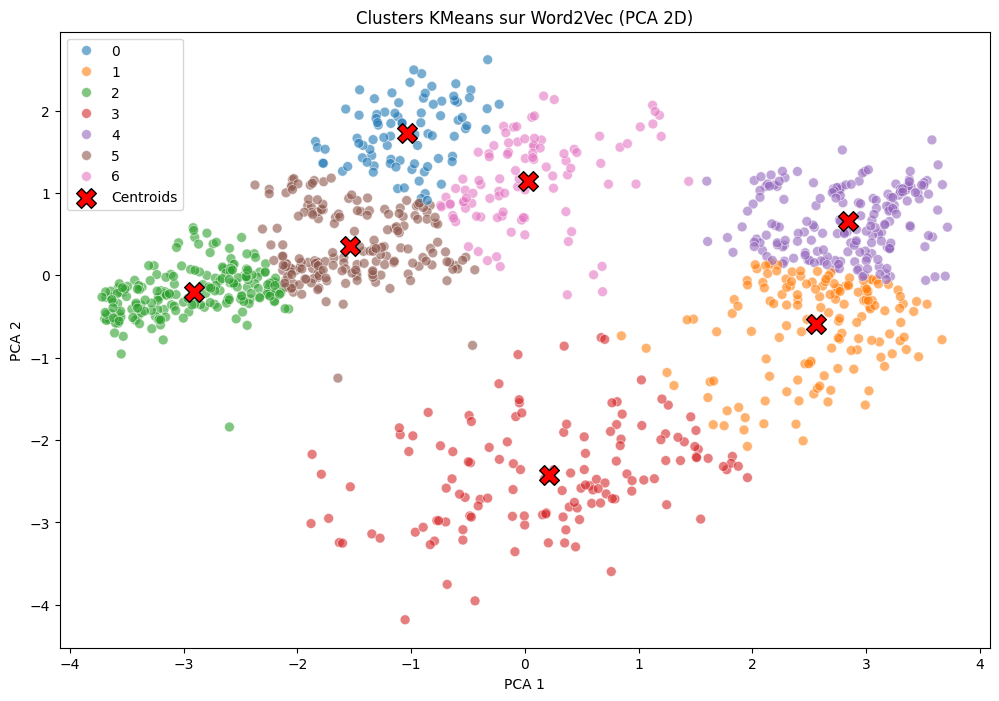

In [240]:
# Récupérer les centroïdes projetés en 2D
centers_2D = kmeans.cluster_centers_

plt.figure(figsize=(12, 8))

# Nuage de points
sns.scatterplot(
    x=pca_X_bert_uncased[:, 0],
    y=pca_X_bert_uncased[:, 1],
    hue=cluster_labels,
    palette="tab10",
    alpha=0.6,
    s=50,
    legend="full"
)

# Centroïdes en rouge
plt.scatter(
    centers_2D[:, 0],
    centers_2D[:, 1],
    c="red",
    marker="X",
    s=200,
    edgecolor="black",
    label="Centroids"
)

plt.title("Clusters KMeans sur Word2Vec (PCA 2D)")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.legend()
plt.show()

In [241]:
pca_silh_X_bert_uncased = silhouette_score(pca_X_bert_uncased, cluster_labels)
print(f"Silhouette Score: {pca_silh_X_bert_uncased}")

Silhouette Score: 0.4079455280763611


In [242]:
pca_dbi_X_bert_uncased = davies_bouldin_score(pca_X_bert_uncased, cluster_labels)
print(f"Davies-Bouldin Index: {pca_dbi_X_bert_uncased}")

Davies-Bouldin Index: 0.8386857626409403


In [243]:
pca_ari_X_bert_uncased = adjusted_rand_score(df_data['top_category'], df_data['pca_X_bert_uncased'])
print("Adjusted Rand Index:", pca_ari_X_bert_uncased)

Adjusted Rand Index: 0.12304134652185619


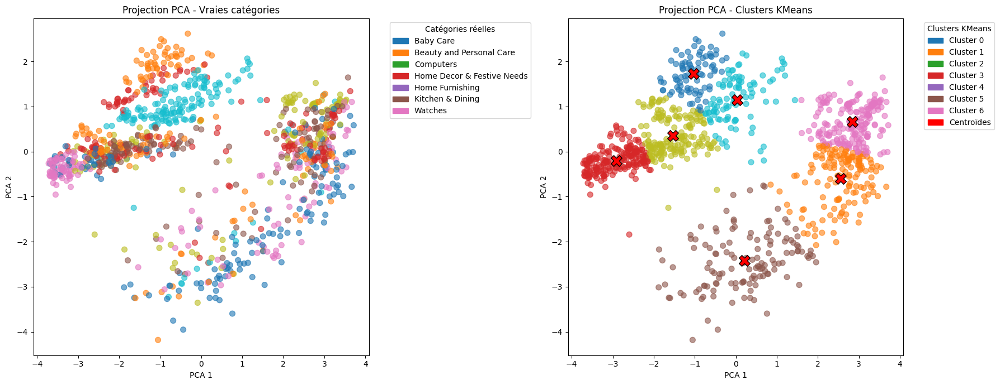

In [244]:
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Graphe de gauche : vraies catégories
scatter1 = axes[0].scatter(
    pca_X_bert_uncased[:, 0],
    pca_X_bert_uncased[:, 1],
    c=true_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

axes[0].set_title("Projection PCA - Vraies catégories")
axes[0].set_xlabel("PCA 1")
axes[0].set_ylabel("PCA 2")

# Graphe de droite : clusters KMeans + centroïdes
scatter2 = axes[1].scatter(
    pca_X_bert_uncased[:, 0],
    pca_X_bert_uncased[:, 1],
    c=cluster_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

# Ajouter les centroïdes en rouge
axes[1].scatter(
    centers_2D[:, 0],
    centers_2D[:, 1],
    c="red",
    marker="X",
    s=200,
    edgecolor="black",
    label="Centroïdes"
)

axes[1].set_title("Projection PCA - Clusters KMeans")
axes[1].set_xlabel("PCA 1")
axes[1].set_ylabel("PCA 2")

# Légende pour les vraies catégories (à gauche)
legend1 = axes[0].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=cat)
        for i, cat in enumerate(le.classes_)
    ],
    title="Catégories réelles",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

# Légende pour les clusters (à droite)
legend2 = axes[1].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=f"Cluster {i}")
        for i in range(n_cluster)
    ] + [mpatches.Patch(color="red", label="Centroïdes")],
    title="Clusters KMeans",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

fig.tight_layout()
plt.show()

##### PCA BERT CASED

In [245]:
# Choix du modèle
model_name = "bert-base-cased"

# Chargement du tokenizer et du modèle
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModel.from_pretrained(model_name)

# Mise du modèle en mode évaluation
model.eval()

BertModel(
  (embeddings): BertEmbeddings(
    (word_embeddings): Embedding(28996, 768, padding_idx=0)
    (position_embeddings): Embedding(512, 768)
    (token_type_embeddings): Embedding(2, 768)
    (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (encoder): BertEncoder(
    (layer): ModuleList(
      (0-11): 12 x BertLayer(
        (attention): BertAttention(
          (self): BertSdpaSelfAttention(
            (query): Linear(in_features=768, out_features=768, bias=True)
            (key): Linear(in_features=768, out_features=768, bias=True)
            (value): Linear(in_features=768, out_features=768, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (output): BertSelfOutput(
            (dense): Linear(in_features=768, out_features=768, bias=True)
            (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
            (dropout): Dropout(p=0.1, inplace=False

In [246]:
# Récupère la colonne description (et supprimer les NaN éventuels)
texts = df_data['cleaned_description'].dropna().astype(str).tolist()

print(f"Nombre de descriptions : {len(texts)}")
print("Exemple :", texts[0][:200])  # afficher un extrait

Nombre de descriptions : 1050
Exemple : key featur eleg polyest multicolor abstract eyelet door curtain floral curtaineleg polyest multicolor abstract eyelet door curtain cm height pack price r curtain enhanc look interiorsthi curtain made 


In [247]:
# Utilisation de la fonction
device = "cuda" if torch.cuda.is_available() else "cpu"
embeddings = get_bert_embeddings(texts_bert, tokenizer, model, batch_size=16, max_len=128, device=device)

print("Shape des embeddings :", embeddings.shape)  # (1050, 768)

Shape des embeddings : torch.Size([1050, 768])


In [248]:
# Bag of Words → 2D
pca_bert = PCA(n_components=2)
pca_X_bert_cased = pca_bert.fit_transform(embeddings)

In [249]:
kmeans = KMeans(n_clusters=n_cluster, random_state=42)
cluster_labels = kmeans.fit_predict(pca_X_bert_cased)

In [250]:
unique_labels, label_counts = np.unique(cluster_labels, return_counts=True)
# Affiche le compte pour chaque cluster étiqueté
for label, count in zip(unique_labels, label_counts):
    print(f'CLUSTER {label} contains {count} products')

CLUSTER 0 contains 192 products
CLUSTER 1 contains 105 products
CLUSTER 2 contains 149 products
CLUSTER 3 contains 143 products
CLUSTER 4 contains 98 products
CLUSTER 5 contains 232 products
CLUSTER 6 contains 131 products


In [251]:
df_data['pca_X_bert_cased'] = cluster_labels

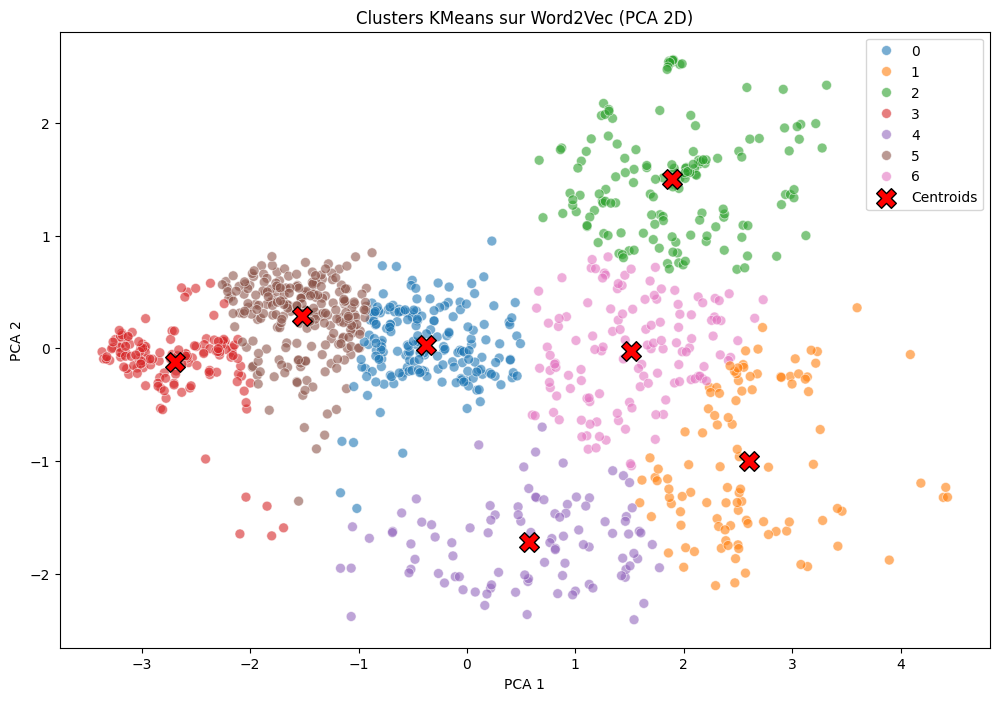

In [252]:
# Récupérer les centroïdes projetés en 2D
centers_2D = kmeans.cluster_centers_

plt.figure(figsize=(12, 8))

# Nuage de points
sns.scatterplot(
    x=pca_X_bert_cased[:, 0],
    y=pca_X_bert_cased[:, 1],
    hue=cluster_labels,
    palette="tab10",
    alpha=0.6,
    s=50,
    legend="full"
)

# Centroïdes en rouge
plt.scatter(
    centers_2D[:, 0],
    centers_2D[:, 1],
    c="red",
    marker="X",
    s=200,
    edgecolor="black",
    label="Centroids"
)

plt.title("Clusters KMeans sur Word2Vec (PCA 2D)")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.legend()
plt.show()

In [253]:
pca_silh_X_bert_cased = silhouette_score(pca_X_bert_cased, cluster_labels)
print(f"Silhouette Score: {pca_silh_X_bert_cased}")

Silhouette Score: 0.40486058876727


In [254]:
pca_dbi_X_bert_cased = davies_bouldin_score(pca_X_bert_cased, cluster_labels)
print(f"Davies-Bouldin Index: {pca_dbi_X_bert_cased}")

Davies-Bouldin Index: 0.8241732022741856


In [255]:
pca_ari_X_bert_cased = adjusted_rand_score(df_data['top_category'], df_data['pca_X_bert_cased'])
print("Adjusted Rand Index:", pca_ari_X_bert_cased)

Adjusted Rand Index: 0.12882334089082495


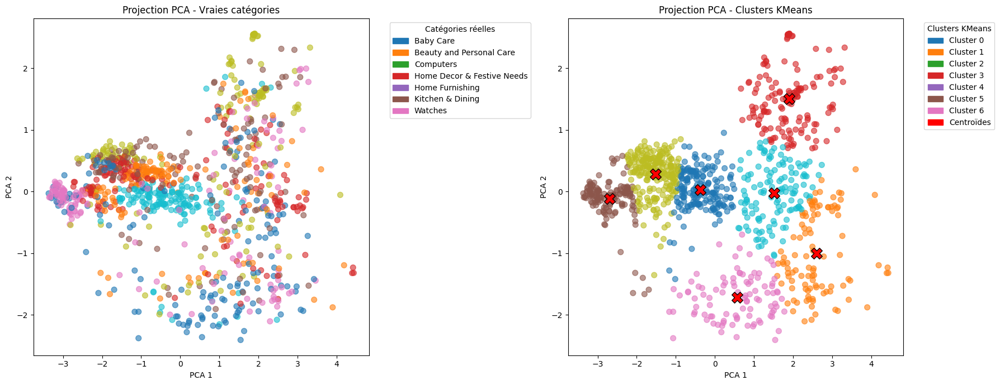

In [256]:
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Graphe de gauche : vraies catégories
scatter1 = axes[0].scatter(
    pca_X_bert_cased[:, 0],
    pca_X_bert_cased[:, 1],
    c=true_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

axes[0].set_title("Projection PCA - Vraies catégories")
axes[0].set_xlabel("PCA 1")
axes[0].set_ylabel("PCA 2")

# Graphe de droite : clusters KMeans + centroïdes
scatter2 = axes[1].scatter(
    pca_X_bert_cased[:, 0],
    pca_X_bert_cased[:, 1],
    c=cluster_labels,
    cmap="tab10",
    alpha=0.6,
    s=50
)

# Ajouter les centroïdes en rouge
axes[1].scatter(
    centers_2D[:, 0],
    centers_2D[:, 1],
    c="red",
    marker="X",
    s=200,
    edgecolor="black",
    label="Centroïdes"
)

axes[1].set_title("Projection PCA - Clusters KMeans")
axes[1].set_xlabel("PCA 1")
axes[1].set_ylabel("PCA 2")

# Légende pour les vraies catégories (à gauche)
legend1 = axes[0].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=cat)
        for i, cat in enumerate(le.classes_)
    ],
    title="Catégories réelles",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

# Légende pour les clusters (à droite)
legend2 = axes[1].legend(
    handles=[
        mpatches.Patch(color=plt.cm.tab10(i), label=f"Cluster {i}")
        for i in range(n_cluster)
    ] + [mpatches.Patch(color="red", label="Centroïdes")],
    title="Clusters KMeans",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

fig.tight_layout()
plt.show()

#### Etape 3: COMPARAISON

In [257]:
results = [
    #{
    #    "Model": "BOW (unigram)",
    #    "Dim Reduc Method": "t-SNE",
    #    "Silhouette Score": t_sne_silh_X_bow,
    #    "Davies-Bouldin Index": t_sne_dbi_X_bow,
    #   "Adjusted Rand Index": t_sne_ari_X_bow,
    #},
    {
        "Model": "BOW (unigram)",
        "Dim Reduc Method": "PCA",
        "Silhouette Score": pca_silh_X_bow,
        "Davies-Bouldin Index": pca_dbi_X_bow,
        "Adjusted Rand Index": pca_ari_X_bow,
    },
    #{
    #    "Model": "BOW (bigram)",
    #    "Dim Reduc Method": "t-SNE",
    #    "Silhouette Score": t_sne_silh_X_bow2gram,
    #    "Davies-Bouldin Index": t_sne_dbi_X_bow2gram,
    #    "Adjusted Rand Index": t_sne_ari_X_bow2gram,
    #},
    {
        "Model": "BOW (bigram)",
        "Dim Reduc Method": "PCA",
        "Silhouette Score": pca_silh_X_bow2gram,
        "Davies-Bouldin Index": pca_dbi_X_bow2gram,
        "Adjusted Rand Index": pca_ari_X_bow2gram,
    },
    #{
    #    "Model": "BOW (trigram)",
    #    "Dim Reduc Method": "t-SNE",
    #    "Silhouette Score": t_sne_silh_X_bow3gram,
    #    "Davies-Bouldin Index": t_sne_dbi_X_bow3gram,
    #    "Adjusted Rand Index": t_sne_ari_X_bow3gram,
    #},
    {
        "Model": "BOW (trigram)",
        "Dim Reduc Method": "PCA",
        "Silhouette Score": pca_silh_X_bow3gram,
        "Davies-Bouldin Index": pca_dbi_X_bow3gram,
        "Adjusted Rand Index": pca_ari_X_bow3gram,
    },
    #{
    #    "Model": "TF-IDF (uni+bigram)",
    #    "Dim Reduc Method": "t-SNE",
    #    "Silhouette Score": t_sne_silh_X_tfidf2gram,
    #    "Davies-Bouldin Index": t_sne_dbi_X_tfidf2gram,
    #    "Adjusted Rand Index": t_sne_ari_X_tfidf2gram,
    #},
    {
        "Model": "TF-IDF (uni+bigram)",
        "Dim Reduc Method": "PCA",
        "Silhouette Score": pca_silh_X_tfidf2gram,
        "Davies-Bouldin Index": pca_dbi_X_tfidf2gram,
        "Adjusted Rand Index": pca_ari_X_tfidf2gram,
    },
    #{
    #    "Model": "TF-IDF (bigram_only)",
    #    "Dim Reduc Method": "t-SNE",
    #    "Silhouette Score": t_sne_silh_X_tfidf2gramonly,
    #    "Davies-Bouldin Index": t_sne_dbi_X_tfidf2gramonly,
    #    "Adjusted Rand Index": t_sne_ari_X_tfidf2gramonly,
    #},
    {
        "Model": "TF-IDF (bigram_only)",
        "Dim Reduc Method": "PCA",
        "Silhouette Score": pca_silh_X_tfidf2gramonly,
        "Davies-Bouldin Index": pca_dbi_X_tfidf2gramonly,
        "Adjusted Rand Index": pca_ari_X_tfidf2gramonly,
    },
    #{
    #    "Model": "TF-IDF (uni-trigram)",
    #    "Dim Reduc Method": "t-SNE",
    #    "Silhouette Score": t_sne_silh_X_tfidf3gram,
    #    "Davies-Bouldin Index": t_sne_dbi_X_tfidf3gram,
    #    "Adjusted Rand Index": t_sne_ari_X_tfidf3gram,
    #},
    {
        "Model": "TF-IDF (uni-trigram)",
        "Dim Reduc Method": "PCA",
        "Silhouette Score": pca_silh_X_tfidf3gram,
        "Davies-Bouldin Index": pca_dbi_X_tfidf3gram,
        "Adjusted Rand Index": pca_ari_X_tfidf3gram,
    },
    #{
    #    "Model": "Word2Vec Skip-gram",
    #    "Dim Reduc Method": "t-SNE",
    #    "Silhouette Score": t_sne_silh_X_w2v,
    #    "Davies-Bouldin Index": t_sne_dbi_X_w2v,
    #    "Adjusted Rand Index": t_sne_ari_X_w2v,
    #},
    {
        "Model": "Word2Vec Skip-gram",
        "Dim Reduc Method": "PCA",
        "Silhouette Score": pca_silh_X_w2v,
        "Davies-Bouldin Index": pca_dbi_X_w2v,
        "Adjusted Rand Index": pca_ari_X_w2v,
    },
    #{
    #    "Model": "Word2Vec CBOW",
    #    "Dim Reduc Method": "t-SNE",
    #    "Silhouette Score": t_sne_silh_X_cbow,
    #    "Davies-Bouldin Index": t_sne_dbi_X_cbow,
    #    "Adjusted Rand Index": t_sne_ari_X_cbow,
    #},
    {
        "Model": "Word2Vec CBOW",
        "Dim Reduc Method": "PCA",
        "Silhouette Score": pca_silh_X_cbow,
        "Davies-Bouldin Index": pca_dbi_X_cbow,
        "Adjusted Rand Index": pca_ari_X_cbow,
    },
    #{
    #    "Model": "USE",
    #    "Dim Reduc Method": "t-SNE",
    #    "Silhouette Score": t_sne_silh_X_use,
    #    "Davies-Bouldin Index": t_sne_dbi_X_use,
    #    "Adjusted Rand Index": t_sne_ari_X_use,
    #},
    {
        "Model": "USE",
        "Dim Reduc Method": "PCA",
        "Silhouette Score": pca_silh_X_use,
        "Davies-Bouldin Index": pca_dbi_X_use,
        "Adjusted Rand Index": pca_ari_X_use,
    },
    #{
    #    "Model": "BERT",
    #    "Dim Reduc Method": "t-SNE",
    #    "Silhouette Score": t_sne_silh_X_bert,
    #    "Davies-Bouldin Index": t_sne_dbi_X_bert,
    #    "Adjusted Rand Index": t_sne_ari_X_bert,
    #},
    {
        "Model": "BERT_Mini",
        "Dim Reduc Method": "PCA",
        "Silhouette Score": pca_silh_X_bert,
        "Davies-Bouldin Index": pca_dbi_X_bert,
        "Adjusted Rand Index": pca_ari_X_bert,
    },
    {
        "Model": "BERT_uncased",
        "Dim Reduc Method": "PCA",
        "Silhouette Score": pca_silh_X_bert_uncased,
        "Davies-Bouldin Index": pca_dbi_X_bert_uncased,
        "Adjusted Rand Index": pca_ari_X_bert_uncased,
    },
    {
        "Model": "BERT_cased",
        "Dim Reduc Method": "PCA",
        "Silhouette Score": pca_silh_X_bert_cased,
        "Davies-Bouldin Index": pca_dbi_X_bert_cased,
        "Adjusted Rand Index": pca_ari_X_bert_cased,
    }
]

# Conversion en DataFrame
df_results = pd.DataFrame(results)

display(df_results.sort_values(by='Adjusted Rand Index', ascending=False))


,Model,Dim Reduc Method,Silhouette Score,Davies-Bouldin Index,Adjusted Rand Index
9,BERT_Mini,PCA,0.406256,0.810635,0.299721
8,USE,PCA,0.430584,0.837277,0.235457
6,Word2Vec Skip-gram,PCA,0.415938,0.917797,0.217353
2,BOW (trigram),PCA,0.851268,0.203150,0.189842
4,TF-IDF (bigram_only),PCA,0.688721,0.622764,0.149516
5,TF-IDF (uni-trigram),PCA,0.464902,0.776192,0.149516
11,BERT_cased,PCA,0.404861,0.824173,0.128823
10,BERT_uncased,PCA,0.407946,0.838686,0.123041
1,BOW (bigram),PCA,0.684772,0.329783,0.118602
3,TF-IDF (uni+bigram),PCA,0.602859,0.681030,0.109719


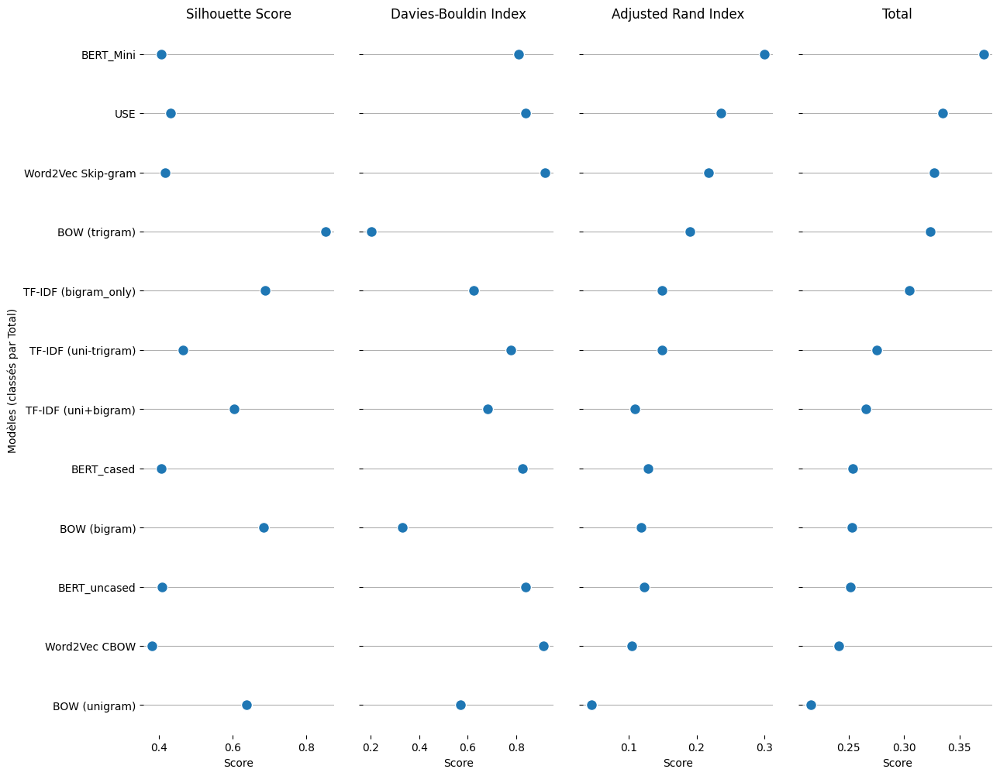

In [258]:
# On recrée la colonne Total
df_results["Total"] = (
    0.7 * df_results["Adjusted Rand Index"]
    + 0.2 * df_results["Silhouette Score"]
    + 0.1 * df_results["Davies-Bouldin Index"]
)

# Trie par Total décroissant
df_sorted = df_results.sort_values("Total", ascending=False)

# Colonnes à tracer
metrics = ["Silhouette Score", "Davies-Bouldin Index", "Adjusted Rand Index", "Total"]

# Créer le PairGrid avec seaborn
g = sns.PairGrid(
    df_sorted,
    x_vars=metrics,
    y_vars=["Model"],
    height=10,
    aspect=0.3
)

# Dot plot
g.map(
    sns.stripplot,
    size=10,
    orient="h",
    jitter=False,
    palette="flare_r",
    linewidth=1,
    edgecolor="w"
)

# Ajustements axes et labels
for ax, metric in zip(g.axes.flat, metrics):
    ax.set(title=metric)
    ax.xaxis.grid(False)
    ax.yaxis.grid(True)

g.set(xlabel="Score", ylabel="Modèles (classés par Total)")
sns.despine(left=True, bottom=True)
plt.show()


In [259]:
import torch
from transformers import AutoTokenizer, AutoModel
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, davies_bouldin_score, adjusted_rand_score
import numpy as np

# Charger BERT cased (meilleur pour les noms propres et marques)
model_name = "bert-base-cased"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModel.from_pretrained(model_name)
model.eval()



BertModel(
  (embeddings): BertEmbeddings(
    (word_embeddings): Embedding(28996, 768, padding_idx=0)
    (position_embeddings): Embedding(512, 768)
    (token_type_embeddings): Embedding(2, 768)
    (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (encoder): BertEncoder(
    (layer): ModuleList(
      (0-11): 12 x BertLayer(
        (attention): BertAttention(
          (self): BertSdpaSelfAttention(
            (query): Linear(in_features=768, out_features=768, bias=True)
            (key): Linear(in_features=768, out_features=768, bias=True)
            (value): Linear(in_features=768, out_features=768, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (output): BertSelfOutput(
            (dense): Linear(in_features=768, out_features=768, bias=True)
            (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
            (dropout): Dropout(p=0.1, inplace=False